In [9]:
!pip install scipy

In [10]:
import matplotlib.pyplot as plt
plt.style.available

['Solarize_Light2',
 '_classic_test_patch',
 '_mpl-gallery',
 '_mpl-gallery-nogrid',
 'bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn-v0_8',
 'seaborn-v0_8-bright',
 'seaborn-v0_8-colorblind',
 'seaborn-v0_8-dark',
 'seaborn-v0_8-dark-palette',
 'seaborn-v0_8-darkgrid',
 'seaborn-v0_8-deep',
 'seaborn-v0_8-muted',
 'seaborn-v0_8-notebook',
 'seaborn-v0_8-paper',
 'seaborn-v0_8-pastel',
 'seaborn-v0_8-poster',
 'seaborn-v0_8-talk',
 'seaborn-v0_8-ticks',
 'seaborn-v0_8-white',
 'seaborn-v0_8-whitegrid',
 'tableau-colorblind10']

In [11]:
plt.style.use('seaborn-v0_8-white')

In [12]:
data_path = '/content/drive/MyDrive/ESTUDIO_TIME_SERIES'

# 1. Dataset Preparation


In [13]:
from google.colab import drive
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import LSTM, Dense, Dropout, Reshape, Flatten, GRU
from tensorflow.keras.optimizers import RMSprop, Adam, SGD
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
import numpy as np
import re


# df1 = pd.read_csv('cpu_percent_results_2.csv', usecols=['beginTimeSeconds', 'CPU percent'])
# df2 = pd.read_csv('uptime_results_2.csv', usecols=['Uptime'])
# df3 = pd.read_csv('tx_rx_results_2.csv',
#                   usecols=['Rx packets', 'Tx packets'])
# df4 = pd.read_csv('nb_np_results_2.csv',
#                   usecols=['NetBytes In', 'NetBytes Out', 'NetPackets In', 'NetPackets Out'])
# df5 = pd.read_csv('disk_memory_results_2.csv',
#                   usecols=['Disk read/s', 'Disk write/s', 'Free Disk', 'Free Memory', 'Used Disk',
#                            'Used Memory'], dtype='str')
# df6 = pd.read_csv('disk_percent_results_2.csv', usecols=['Disk Used percent'])
# df7 = pd.read_csv('memory_percent_results_2.csv', usecols=['Memory Used percent'])

# df = pd.concat([df1, df2, df3, df4, df5, df6, df7], axis=1)
# df = df2.copy()
# df.head()

In [14]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [15]:
df = pd.read_csv('data (1).csv', index_col=0, parse_dates=['beginTimeSeconds'])
df.head()

,CPU percent,Uptime,Rx packets,Tx packets,NetBytes In,NetBytes Out,NetPackets In,NetPackets Out,Disk read/s,Disk write/s,Free Disk,Free Memory,Used Disk,Used Memory,Disk Used percent,Memory Used percent
beginTimeSeconds,,,,,,,,,,,,,,,,
2023-03-01 00:00:00,35.89,99.4234,1800,1800,15,15,15,15,14.12,44.97,76.93,3.75,43.86,4.44,27.57,54.23
2023-03-01 00:30:00,36.57,99.4233,1800,1800,15,15,15,15,5.19,41.19,76.94,3.76,43.84,4.43,27.55,54.14
2023-03-01 01:00:00,37.94,99.4232,1800,1800,15,15,15,15,23.64,70.99,77.00,3.77,43.78,4.41,27.52,53.91
2023-03-01 01:30:00,37.40,99.4231,1800,1800,15,15,15,15,5.25,38.45,77.00,3.78,43.79,4.41,27.52,53.86
2023-03-01 02:00:00,38.08,99.4230,1800,1800,15,15,15,15,9.42,43.94,77.01,3.76,43.77,4.43,27.51,54.11


In [16]:
df.shape

(7344, 16)

In [17]:
new_order_columns = [
    'Free Memory',
    'Used Memory',
    'Free Disk',
    'Used Disk',
    'Disk read/s',
    'Disk write/s',
    'NetBytes In',
    'NetBytes Out',
    'NetPackets In',
    'NetPackets Out',
    'Rx packets',
    'Tx packets',
    'CPU percent',
    'Memory Used percent',
    'Disk Used percent',
    'Uptime',
]
df = df[new_order_columns]
df.head()

,Free Memory,Used Memory,Free Disk,Used Disk,Disk read/s,Disk write/s,NetBytes In,NetBytes Out,NetPackets In,NetPackets Out,Rx packets,Tx packets,CPU percent,Memory Used percent,Disk Used percent,Uptime
beginTimeSeconds,,,,,,,,,,,,,,,,
2023-03-01 00:00:00,3.75,4.44,76.93,43.86,14.12,44.97,15,15,15,15,1800,1800,35.89,54.23,27.57,99.4234
2023-03-01 00:30:00,3.76,4.43,76.94,43.84,5.19,41.19,15,15,15,15,1800,1800,36.57,54.14,27.55,99.4233
2023-03-01 01:00:00,3.77,4.41,77.00,43.78,23.64,70.99,15,15,15,15,1800,1800,37.94,53.91,27.52,99.4232
2023-03-01 01:30:00,3.78,4.41,77.00,43.79,5.25,38.45,15,15,15,15,1800,1800,37.40,53.86,27.52,99.4231
2023-03-01 02:00:00,3.76,4.43,77.01,43.77,9.42,43.94,15,15,15,15,1800,1800,38.08,54.11,27.51,99.4230


In [18]:
def cut_col_name(col_name):
  return re.sub("[^a-zA-Z]", '', col_name)

In [19]:
## df['beginTimeSeconds'] = pd.to_datetime(df['beginTimeSeconds'], unit='s')
## df = df.set_index('beginTimeSeconds')

In [20]:
# cols = df.columns

# N = df.shape[0]
# plots = df[['Free Disk', 'Used Disk', 'Disk Used percent']][:N]
# # plots.index = df['beginTimeSeconds'][0:N]
# plots.index = df.index[:N]
# _ = plots.plot(subplots=True, figsize=(25,25))
# plt.legend(fontsize='xx-large')

# # plt.grid(True)
# plt.savefig('dataset.png')

In [21]:
fsize_labels = 23
fsize_ticks = 25
fsize_title = 23
figsize = (15, 5)

# for col in df.columns:

#   fig, ax = plt.subplots(figsize = figsize)
#   ax.plot(df.index, df[col].values)
#   ax.set_title(col, fontsize=fsize_title)
#   ax.set_xlabel('Time', fontsize=fsize_labels)
#   ax.set_ylabel('Value', fontsize=fsize_labels)
#   ax.tick_params(labelsize=fsize_ticks)
#   ax.grid(False)

#   plt.tight_layout()
#   plt.savefig(f'{data_path}/DATA_COMPLETA/{cut_col_name(col)}_data.jpg')

# plt.show()

## 1.1. Feature management



It is necessary to eliminate a certain segment of the information due to its lack of temporality, since it would generate errors during training.
The information to be predicted corresponds to data collected after July 5, 2023.

In [22]:
df = df[(df.index <= '2023-07-05 00:00:00')]

In [23]:
# cols = df.columns

# N = df.shape[0]
# plots = df[cols[-4:]][:N]
# # plots.index = df['beginTimeSeconds'][0:N]
# plots.index = df.index[0:N] # Time Variable
# _ = plots.plot(subplots=True, figsize=(25,25))

In [24]:
fsize_labels = 23
fsize_ticks = 20
fsize_title = 23

# for col in df.columns:

#   fig, ax = plt.subplots(figsize = figsize)
#   ax.plot(df.index, df[col].values)
#   ax.set_title(col, fontsize=fsize_title)
#   ax.set_xlabel('Time', fontsize=fsize_labels)
#   ax.set_ylabel('Value', fontsize=fsize_labels)
#   ax.tick_params(labelsize=fsize_ticks)
#   ax.grid(False)

#   plt.tight_layout()
#   plt.savefig(f'{data_path}/DATA_LIMITADA/{cut_col_name(col)}_data.jpg')

# plt.show()

##1.2. Descriptive statistics

In [25]:
for column in df.columns:
  print(f'\nVariable [{column}]\n', df[column].describe())


Variable [Free Memory]
 count    6049.000000
mean        3.586995
std         0.250336
min         3.200000
25%         3.400000
50%         3.550000
75%         3.700000
max         5.520000
Name: Free Memory, dtype: float64

Variable [Used Memory]
 count    6049.000000
mean        4.602232
std         0.250353
min         2.670000
25%         4.490000
50%         4.640000
75%         4.790000
max         4.990000
Name: Used Memory, dtype: float64

Variable [Free Disk]
 count    6049.000000
mean       73.601152
std         1.477678
min        71.740000
25%        72.350000
50%        73.060000
75%        74.550000
max        77.050000
Name: Free Disk, dtype: float64

Variable [Used Disk]
 count    6049.000000
mean       47.183316
std         1.477693
min        43.730000
25%        46.230000
50%        47.720000
75%        48.430000
max        49.050000
Name: Used Disk, dtype: float64

Variable [Disk read/s]
 count     6049.000000
mean       132.422352
std       1772.217510
min      

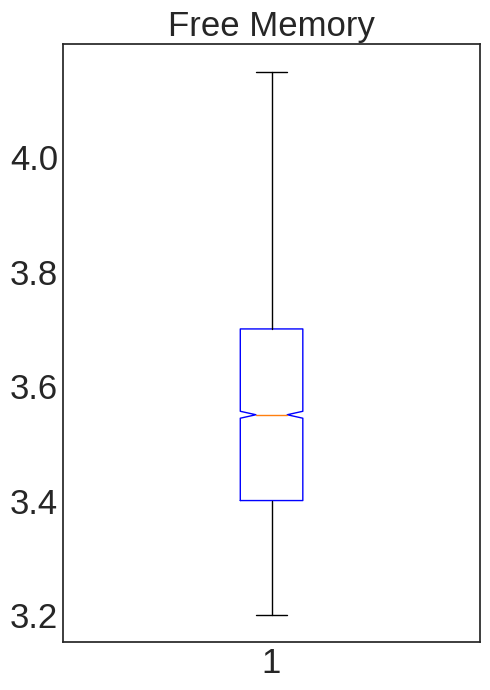

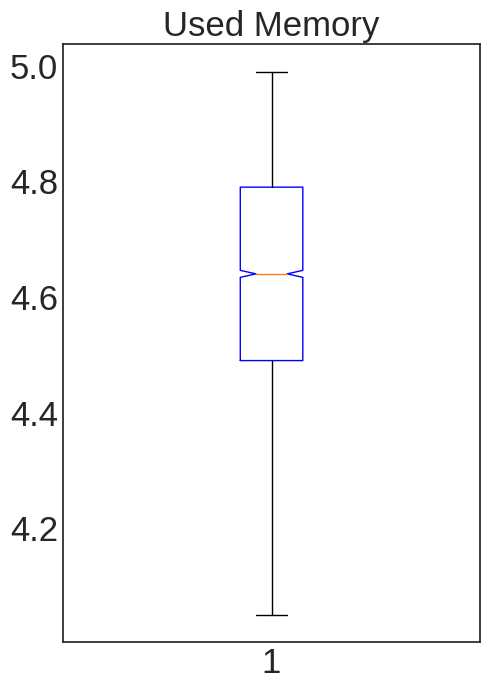

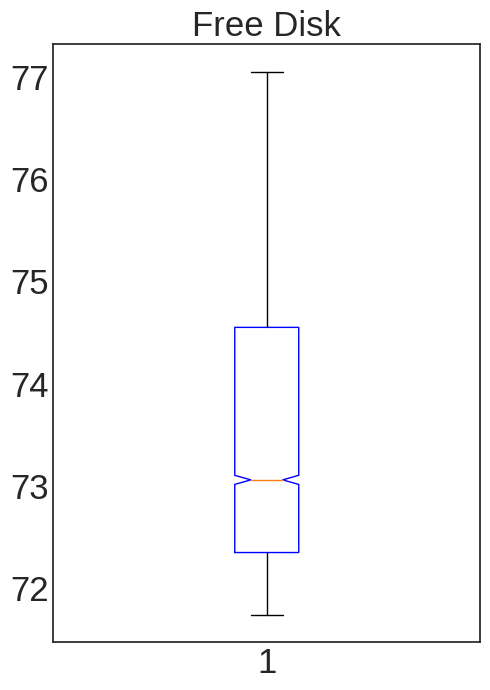

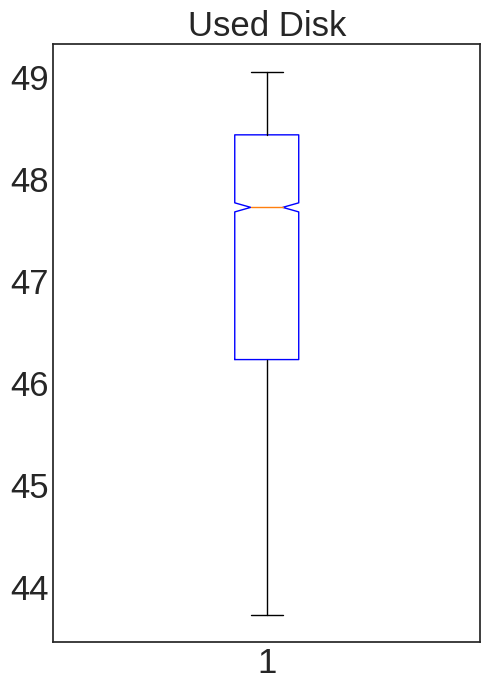

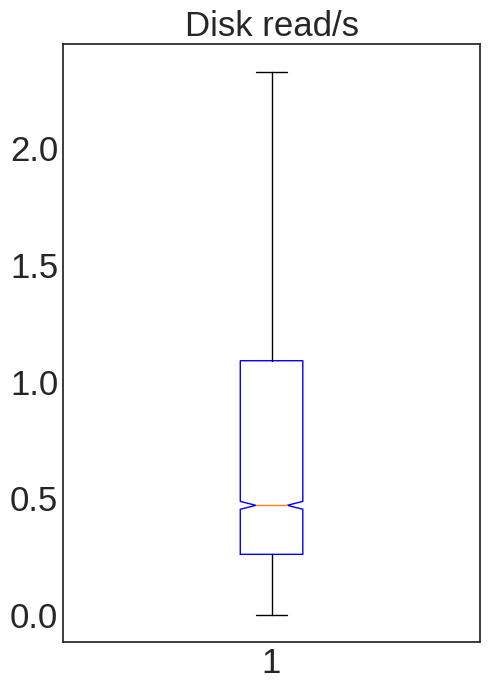

...

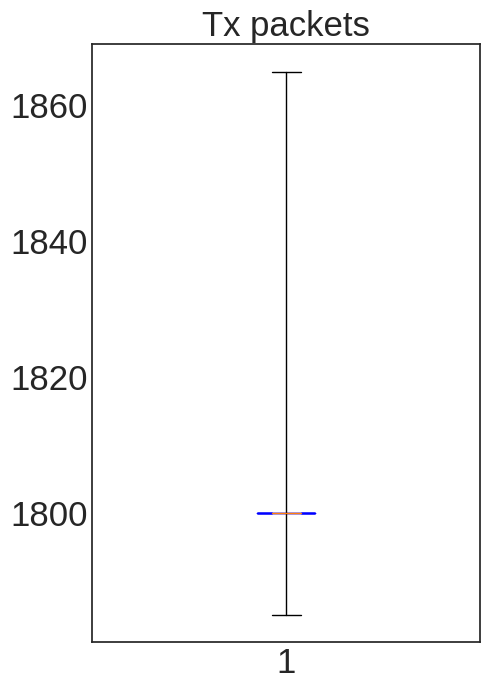

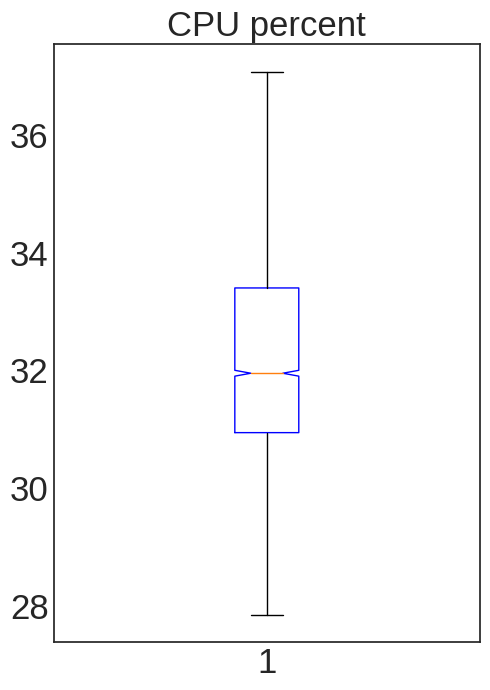

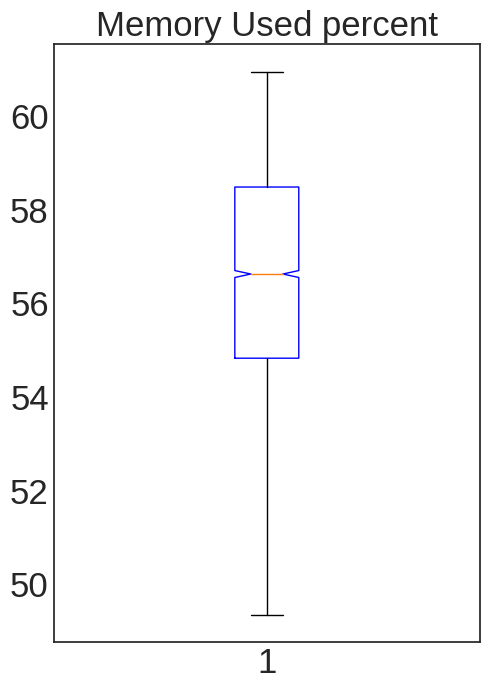

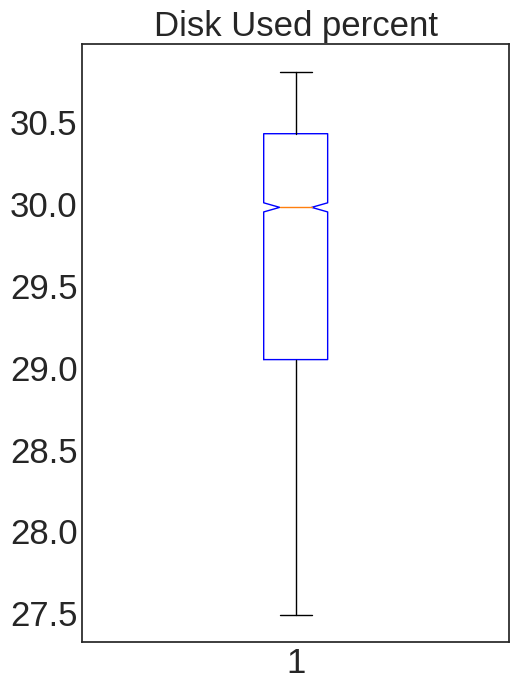

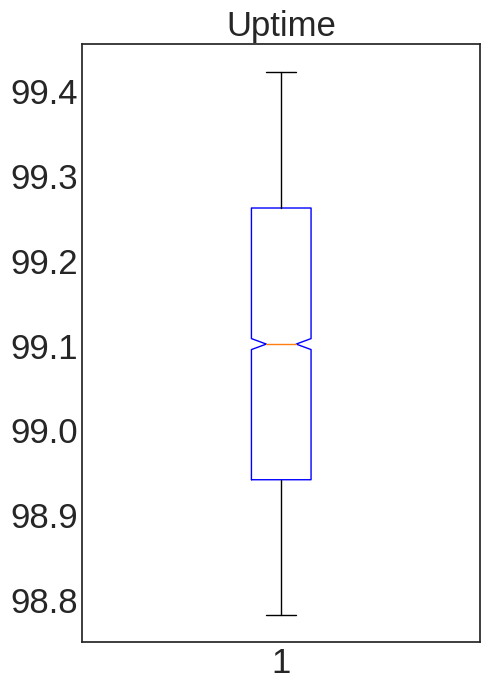

In [26]:
for col in df.columns:
  fig, axe = plt.subplots(figsize=(5, 7))
  box = axe.boxplot(df[col], notch=True, vert=True, autorange=True, sym="")
  for box in box['boxes']:
      box.set_color('b')
      axe.set_title(col, fontsize=25)
      axe.tick_params(labelsize=25)
      plt.tight_layout()
      # plt.savefig(f'{data_path}/DATA_STATISTICS/{cut_col_name(col)}_data.jpg')
plt.show()

## 1.3. Variability determination


In [27]:
print(len(df.columns))
for column in df.columns:
  arr = df[column].unique()
  print(f'Column: [{column}] :: Unique data [{arr}], Total Unique Data [{len(arr)}]')

16
Column: [Free Memory] :: Unique data [[3.75 3.76 3.77 3.78 3.74 4.22 4.18 4.06 3.98 3.93 3.89 3.87 3.86 3.85
 3.83 3.82 3.81 3.79 3.8  3.67 3.68 3.71 3.72 3.7  3.66 3.64 3.63 3.5
 3.51 3.46 3.55 3.56 3.58 3.62 3.61 3.88 3.73 4.13 5.52 5.49 4.97 4.23
 4.15 4.07 4.08 4.09 4.1  4.14 4.16 4.17 4.19 4.2  4.12 4.21 3.97 3.95
 3.96 3.94 3.69 3.65 3.52 3.41 3.42 3.43 3.32 3.3  3.29 3.6  3.54 3.53
 3.48 3.4  3.39 3.49 3.31 3.33 3.38 3.36 3.37 3.34 3.35 4.34 4.01 4.
 3.9  3.47 3.45 3.44 3.28 3.27 3.26 3.25 3.24 3.23 3.92 3.84 3.57 4.33
 4.27 4.29 4.25 4.05 4.04 4.03 4.02 3.99 3.59 3.91 4.43 3.22 3.2  3.21
 5.03 4.69 4.66 4.51 4.48 4.47 4.45 4.39 4.32 5.02 5.01 4.98 4.96 4.95
 4.72 4.37 4.36 4.9  5.11 5.1  5.09 4.71 4.31 4.38 4.11 5.16 5.13 5.12
 4.81 4.54 4.53 4.35]], Total Unique Data [144]
Column: [Used Memory] :: Unique data [[4.44 4.43 4.41 4.45 4.42 3.97 4.   4.13 4.2  4.26 4.3  4.32 4.33 4.34
 4.36 4.37 4.38 4.4  4.39 4.52 4.5  4.48 4.47 4.49 4.51 4.53 4.54 4.56
 4.69 4.68 4.72 4.64 4.6

### 1.3.3 Correlation matrix

The correlation of variables is identified.
A higher correlation when the values are closer to -1 and 1.
It indicates if the variables have an impact on each other.

In [28]:
correlation_matrix = df.corr()

print(correlation_matrix)

                     Free Memory  Used Memory  Free Disk  Used Disk  \
Free Memory             1.000000    -0.999943   0.213579  -0.213530   
Used Memory            -0.999943     1.000000  -0.213727   0.213678   
Free Disk               0.213579    -0.213727   1.000000  -0.999994   
Used Disk              -0.213530     0.213678  -0.999994   1.000000   
Disk read/s            -0.077635     0.077848   0.050975  -0.050963   
Disk write/s           -0.233031     0.233043   0.362643  -0.362723   
NetBytes In            -0.003741     0.003696  -0.023508   0.023575   
NetBytes Out           -0.003741     0.003696  -0.023508   0.023575   
NetPackets In          -0.003741     0.003696  -0.023508   0.023575   
NetPackets Out         -0.003741     0.003696  -0.023508   0.023575   
Rx packets             -0.018790     0.018873  -0.040164   0.040189   
Tx packets             -0.018790     0.018873  -0.040164   0.040189   
CPU percent            -0.146697     0.146768   0.140007  -0.140037   
Memory

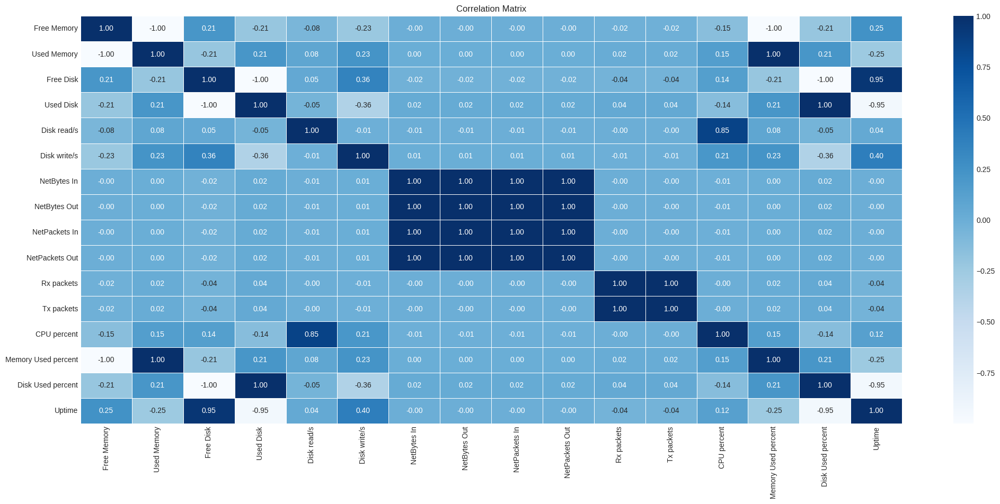

In [29]:
import seaborn as sns

plt.figure(figsize=(25, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='Blues', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix')
# plt.savefig(f'/content/drive/MyDrive/ESTUDIO_TIME_SERIES/DATA_STATISTICS/cor_matrix.jpg')
plt.show()

##1.4. Data Pre-processing


### 1.4.1. Partitioning in Training, Validation and Testing datasets

Unlike other Deep Learning models, in the case of time series **it must be guaranteed that the partitions are generated without randomly mixing the data**.

Note:
- The training set (*train*) will be used to find the model parameters.
- The validation set (*val*) to verify that there is no *under/over-fitting* of the model and to adjust its hyperparameters.
- The test set (*test*) to test the best model found during training/validation.

In this case we will use the same function implemented for the univariate models with the difference that instead of entering a *series* of Pandas, we will enter the complete *DataFrame*.

Therefore, the function will return three *dataframes* (train, val and test):

In [30]:
fsize_labels = 23
fsize_ticks = 16
fsize_title = 25
figsize = (15, 5)

In [31]:
datasets = {}
# tr_ptg = 0.7
# vl_ptg = 0.15
# ts_ptg = 0.15
num_folds = 4
cut_dates = {}

for i, fold in enumerate(range(0, num_folds - 1)):
  len_data = len(df) / num_folds
  len_train_data = int(len_data * (i + 1))

  train_data = int(len_train_data * 0.8)
  val_data = int(len_train_data * 0.2)

  print('--' * 20)
  print(f'Training - iteration {i}  has {len_train_data}')
  tr = df[:train_data]
  vl = df[train_data:train_data + val_data]
  ts = df[len_train_data:len_train_data + int(len_data)]

  cut_dates[i] = [tr.index[-1], vl.index[-1], ts.index[-1]]

  print(f'Cut date train dataset: {tr.index[0]} - {tr.index[-1]}')
  print(f'Cut date val dataset: {vl.index[0]} - {vl.index[-1]}')
  print(f'Cut date test dataset: {ts.index[0]} - {ts.index[-1]}')
  print('--' * 20)

  datasets[i] = [tr, vl, ts]

----------------------------------------
Training - iteration 0  has 1512
Cut date train dataset: 2023-03-01 00:00:00 - 2023-03-26 04:00:00
Cut date val dataset: 2023-03-26 04:30:00 - 2023-04-01 11:00:00
Cut date test dataset: 2023-04-01 12:00:00 - 2023-05-02 23:30:00
----------------------------------------
----------------------------------------
Training - iteration 1  has 3024
Cut date train dataset: 2023-03-01 00:00:00 - 2023-04-20 09:00:00
Cut date val dataset: 2023-04-20 09:30:00 - 2023-05-02 23:00:00
Cut date test dataset: 2023-05-03 00:00:00 - 2023-06-03 11:30:00
----------------------------------------
----------------------------------------
Training - iteration 2  has 4536
Cut date train dataset: 2023-03-01 00:00:00 - 2023-05-15 13:30:00
Cut date val dataset: 2023-05-15 14:00:00 - 2023-06-03 11:00:00
Cut date test dataset: 2023-06-03 12:00:00 - 2023-07-04 23:30:00
----------------------------------------


In [32]:
line_width = 3

In [33]:
n_fold = 3

# for col in df.columns:
#   for fold in range(n_fold):

#     print(f'Presentando el fold {fold} para {col}')
#     tr_ds = datasets[fold][0]
#     val_ds = datasets[fold][1]
#     ts_ds = datasets[fold][2]

#     fig, ax = plt.subplots(figsize = figsize)

#     ax.plot(tr_ds.index, tr_ds[col].values, linewidth=2)
#     ax.plot(val_ds.index, val_ds[col].values, linewidth=2)
#     ax.plot(ts_ds.index, ts_ds[col].values, linewidth=2)

#     ax.set_title(f'Fold {fold} - {col}', fontsize=fsize_title)
#     ax.set_xlabel('Time', fontsize=fsize_labels)
#     ax.set_ylabel('Value', fontsize=fsize_labels)
#     ax.tick_params(labelsize=fsize_ticks)
#     ax.grid(False)
#     plt.tight_layout()

#     plt.savefig(f'{data_path}/SUPERVISED_DATASETS/{fold}_{cut_col_name(col)}_data.jpg')

#     plt.show()

In [34]:
def create_supervised_dataset(dataset, input_length, output_length):
  X = []
  Y = []
  rows = dataset.shape[0]
  for i in range(rows - input_length - output_length + 1):
    X.append(dataset[i:i + input_length])
    Y.append(dataset[i + input_length:i + input_length + output_length])
  return np.array(X), np.array(Y)

In [35]:
tr_datasets = {}
vl_datasets = {}
ts_datasets = {}

INPUT_LENGTH = 1
OUTPUT_LENGTH = 1

for fold, dataset in datasets.items():
    tr, vl, ts = dataset
    print('--' * 20)
    print(f'Iteration {fold}: {tr.shape}, {vl.shape}, {ts.shape}')
    print('--' * 20)

    tr_datasets[fold] = create_supervised_dataset(tr.values, INPUT_LENGTH, OUTPUT_LENGTH)
    vl_datasets[fold] = create_supervised_dataset(vl.values, INPUT_LENGTH, OUTPUT_LENGTH)
    ts_datasets[fold] = create_supervised_dataset(ts.values, INPUT_LENGTH, OUTPUT_LENGTH)

    print('Input (BATCHES x INPUT_LENGTH x FEATURES) and output sizes (BATCHES x OUTPUT_LENGTH x FEATURES)')
    print(f'Train Set - x_tr: {tr_datasets[fold][0].shape}, y_tr: {tr_datasets[fold][1].shape}')
    print(f'Validation Set - x_vl: {vl_datasets[fold][0].shape}, y_vl: {vl_datasets[fold][1].shape}')
    print(f'Test Set - x_ts: {ts_datasets[fold][0].shape}, y_ts: {ts_datasets[fold][1].shape}')


----------------------------------------
Iteration 0: (1209, 16), (302, 16), (1512, 16)
----------------------------------------
Input (BATCHES x INPUT_LENGTH x FEATURES) and output sizes (BATCHES x OUTPUT_LENGTH x FEATURES)
Train Set - x_tr: (1208, 1, 16), y_tr: (1208, 1, 16)
Validation Set - x_vl: (301, 1, 16), y_vl: (301, 1, 16)
Test Set - x_ts: (1511, 1, 16), y_ts: (1511, 1, 16)
----------------------------------------
Iteration 1: (2419, 16), (604, 16), (1512, 16)
----------------------------------------
Input (BATCHES x INPUT_LENGTH x FEATURES) and output sizes (BATCHES x OUTPUT_LENGTH x FEATURES)
Train Set - x_tr: (2418, 1, 16), y_tr: (2418, 1, 16)
Validation Set - x_vl: (603, 1, 16), y_vl: (603, 1, 16)
Test Set - x_ts: (1511, 1, 16), y_ts: (1511, 1, 16)
----------------------------------------
Iteration 2: (3628, 16), (907, 16), (1512, 16)
----------------------------------------
Input (BATCHES x INPUT_LENGTH x FEATURES) and output sizes (BATCHES x OUTPUT_LENGTH x FEATURES)
Tra

In [36]:
def escalar_dataset(data_input):
    NFEATS = data_input['x_tr'].shape[2]

    # Generate list with "scalers" (1 for each input covariate)
    scalers = [MinMaxScaler(feature_range=(-1,1)) for i in range(NFEATS)]
    print(len(scalers), NFEATS)


    # Arreglos que contendrán los datasets escalados
    x_tr_s = np.zeros(data_input['x_tr'].shape)
    x_vl_s = np.zeros(data_input['x_vl'].shape)
    x_ts_s = np.zeros(data_input['x_ts'].shape)
    y_tr_s = np.zeros(data_input['y_tr'].shape)
    y_vl_s = np.zeros(data_input['y_vl'].shape)
    y_ts_s = np.zeros(data_input['y_ts'].shape)

    x_tr_ds, y_tr_ds = data_input['x_tr'], data_input['y_tr']
    x_val_ds, y_val_ds = data_input['x_vl'], data_input['y_vl']
    x_ts_ds, y_ts_ds = data_input['x_ts'], data_input['y_ts']

    # Scaling: the min/max of the training set will be used to scale all the datasets.

    # Scaling Xs
    for i in range(NFEATS):
        x_tr_s[:,:,i] = scalers[i].fit_transform(x_tr_ds[:,:,i])
        x_ts_s[:,:,i] = scalers[i].transform(x_ts_ds[:,:,i])
        x_vl_s[:,:,i] = scalers[i].transform(x_val_ds[:,:,i])

        y_tr_s[:,:,i] = scalers[i].transform(y_tr_ds[:,:,i])
        y_vl_s[:,:,i] = scalers[i].transform(y_val_ds[:,:,i])
        y_ts_s[:,:,i] = scalers[i].transform(y_ts_ds[:,:,i])


    # Create output dictionary
    data_scaled = {
        'x_tr_s': x_tr_s, 'y_tr_s': y_tr_s,
        'x_vl_s': x_vl_s, 'y_vl_s': y_vl_s,
        'x_ts_s': x_ts_s, 'y_ts_s': y_ts_s,
    }

    return data_scaled, scalers

In [37]:
tr_s_ds, vl_s_ds, ts_s_ds = {}, {}, {}
scalers = {}

index = 0

for (x_tr_ds, y_tr_ds), (x_val_ds, y_val_ds), (x_ts_ds, y_ts_ds) in zip(tr_datasets.values(), vl_datasets.values(), ts_datasets.values()):

    print('--' * 20)
    print(f'Iteration {index}: {x_tr_ds.shape}, {x_val_ds.shape}, {x_ts_ds.shape}')
    print('--' * 20)

    data_in = {
        'x_tr': x_tr_ds, 'y_tr': y_tr_ds,
        'x_vl': x_val_ds, 'y_vl': y_val_ds,
        'x_ts': x_ts_ds, 'y_ts': y_ts_ds,
    }

    # Y scalar (specifying the column with the variable to predict)
    data_s, scalers_result = escalar_dataset(data_in,)

    tr_s_ds[index] = data_s['x_tr_s'], data_s['y_tr_s']
    vl_s_ds[index] = data_s['x_vl_s'], data_s['y_vl_s']
    ts_s_ds[index] = data_s['x_ts_s'], data_s['y_ts_s']
    scalers[index] = scalers_result

    index += 1

----------------------------------------
Iteration 0: (1208, 1, 16), (301, 1, 16), (1511, 1, 16)
----------------------------------------
16 16
----------------------------------------
Iteration 1: (2418, 1, 16), (603, 1, 16), (1511, 1, 16)
----------------------------------------
16 16
----------------------------------------
Iteration 2: (3627, 1, 16), (906, 1, 16), (1511, 1, 16)
----------------------------------------
16 16


In [38]:
# And let's generate a violin plot to see the distribution of values in each covariate (input) and in the variable to predict (output).
# index = 0
# for (x_tr_s, y_tr_s), (x_vl_s, y_vl_s), (x_ts_s, y_ts_s) in zip(tr_s_ds.values(), vl_s_ds.values(), ts_s_ds.values()):
#   print('--' * 20)
#   print(f'Fold {index}: {x_tr_s.shape}, {x_vl_s.shape}, {x_ts_s.shape}')
#   print('--' * 20)
#   index += 1
#   for i, col in enumerate(df.columns):
#     plt.figure(figsize=(10, 8))

#     plt.subplot(1, 1, 1)
#     plt.violinplot(dataset=x_tr_s[:,:,i].flatten(), positions=[0])
#     plt.violinplot(dataset=x_vl_s[:,:,i].flatten(), positions=[0])
#     plt.violinplot(dataset=x_ts_s[:,:,i].flatten(), positions=[0])
#     plt.title(f'Fold {index} - {col}', fontdict={'fontsize': 20})

#     plt.xticks(fontsize=20)
#     plt.yticks(fontsize=20)

#     plt.grid(False)
#     plt.savefig(f'{data_path}/DATA_STATISTICS/fold-{index}_{cut_col_name(col)}_violin.jpg')
#     # plt.savefig(f'{col.replace("/", "_")}_frecuencia.png')
#     plt.show()

#2. LSTM Model Building

In [39]:
from tensorflow.keras.metrics import RootMeanSquaredError, MeanAbsoluteError, MeanAbsolutePercentageError, MeanSquaredError

In [40]:
# Loss: the RMSE (root mean squared error) will be used for training because it allows to have errors in the same units as each variable.
def root_mean_squared_error(y_true, y_pred):
    rmse = tf.math.sqrt(tf.math.reduce_mean(tf.square(y_pred-y_true)))
    return rmse

In [41]:
dict_variables_results = {}

for i, col in enumerate(df.columns):
  dict_variables_results[col] = {
      "rmse": 0,
      "mae": 0,
      "mape": 0,
  }

In [42]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Bidirectional, Flatten, Conv1D, Dropout
from tensorflow.keras.optimizers import RMSprop, Adam, Adagrad
from keras.regularizers import l2
import tensorflow as tf
from tensorflow.keras.utils import plot_model
from scipy.stats import shapiro
from time import time


In [1]:
# Model creation
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Bidirectional, Flatten, Conv1D, Dropout
from tensorflow.keras.optimizers import RMSprop, Adam, Adagrad
from keras.regularizers import l2
import tensorflow as tf
from tensorflow.keras.utils import plot_model
from scipy.stats import shapiro
from time import time

# Loss: the RMSE (root mean squared error) will be used for training because it allows to have errors in the same units as each variable.
def root_mean_squared_error(y_true, y_pred):
    rmse = tf.math.sqrt(tf.math.reduce_mean(tf.square(y_pred-y_true)))
    return rmse

for jp in range(10):

  index = 0

  print('RUN N°', jp)

  for (x_tr_s, y_tr_s), (x_vl_s, y_vl_s), (x_ts_s, y_ts_s) in zip(tr_s_ds.values(), vl_s_ds.values(), ts_s_ds.values()):

    print('--' * 20)
    print(f'Fold {index}: {x_tr_s.shape}, {x_ts_s.shape}')
    print('--' * 20)

    scaler = scalers[index]
    tr_cut_date, vl_cut_date, ts_cut_date = cut_dates[index]

    tr, vl, ts = datasets[index]
    x_ts, y_true = ts_datasets[index]

    for i, col in enumerate(df.columns):

      start = time()

      print(f'Training LSTM... for {col}')

      model = Sequential([
          LSTM(128, input_shape=(x_tr_ds.shape[1], 1), return_sequences = True,),
          Dropout(0.1),
          LSTM(128, return_sequences = True),
          LSTM(64, return_sequences = False),
          Dense(16, activation='relu'),
          Dense(1, activation='linear')]
      )


      model.compile(optimizer = RMSprop(5e-5), loss = root_mean_squared_error, metrics = [MeanAbsoluteError(), MeanAbsolutePercentageError()])

      # Training (approximately 1 min using GPU)

      EPOCHS = 200
      BATCH_SIZE = 256

      story = model.fit(
          x = np.expand_dims(x_tr_s[:,:,i], axis=-1),
          y = np.expand_dims(y_tr_s[:,:,i], axis=-1),
          batch_size = BATCH_SIZE,
          epochs = EPOCHS,
          validation_data = (np.expand_dims(x_vl_s[:,:,i], axis=-1), np.expand_dims(y_vl_s[:,:,i], axis=-1)),
          verbose=2,
          callbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)],
      )

      finish = time() - start

      plt.figure(figsize=(15, 7))
      plt.subplot(1, 1, 1)
      plt.plot(story.history['loss'], label='RMSE train', linewidth=line_width)
      plt.plot(story.history['val_loss'],label='RMSE val', linewidth=line_width)
      plt.title(f'Iteration {index} - {col}', fontsize=28)
      plt.xlabel('Epoch', fontsize=20)
      plt.ylabel('RMSE', fontsize=20)
      plt.xticks(fontsize=20)
      plt.yticks(fontsize=20)
      plt.tight_layout()
      plt.legend(fontsize=22);

      plt.grid(False)
      plt.savefig(f'{data_path}/LSTM/metrics_result/iteration_{index}_{col.replace("/", "_")}_rmse.png')
      plt.tight_layout()
      plt.show()

      plt.figure(figsize=(15, 7))
      plt.subplot(1, 1, 1)
      plt.plot(story.history['mean_absolute_error'], label='MAE train', linewidth=line_width)
      plt.plot(story.history['val_mean_absolute_error'],label='MAE val', linewidth=line_width)
      plt.title(f'Iteration {index} - {col}',  fontsize=28)
      plt.xlabel('Epoch', fontsize=20)
      plt.ylabel('MAE', fontsize=20)
      plt.xticks(fontsize=20)
      plt.yticks(fontsize=20)
      plt.tight_layout()
      plt.legend(fontsize=22);

      plt.grid(False)
      plt.savefig(f'{data_path}/LSTM/metrics_result/iteration_{index}_{col.replace("/", "_")}_mae.png')
      plt.tight_layout()
      plt.show()

      plt.figure(figsize=(15, 7))
      plt.subplot(1, 1, 1)
      plt.plot(story.history['mean_absolute_percentage_error'], label='MAPE train', linewidth=line_width)
      plt.plot(story.history['val_mean_absolute_percentage_error'],label='MAPE val', linewidth=line_width)
      plt.title(f'Iteration {index} - {col}', fontsize=28)
      plt.xlabel('Epoch', fontsize=20)
      plt.ylabel('MAPE', fontsize=20)
      plt.xticks(fontsize=20)
      plt.yticks(fontsize=20)
      plt.tight_layout()
      plt.legend(fontsize=22);

      plt.grid(False)
      plt.savefig(f'{data_path}/LSTM/metrics_result/iteration_{index}_{col.replace("/", "_")}_mape.png')
      plt.tight_layout()
      plt.show()

      story = None

      y_ts_predict = scaler[i].inverse_transform(model.predict(x_ts_s[:,:,i], verbose=0))

      ts_predict = pd.DataFrame(y_ts_predict[:, 0], index=ts[:-1].index)

      mae = MeanAbsoluteError()
      mape = MeanAbsolutePercentageError()

      mae.update_state(y_true[:, :, i], ts_predict.values)
      mape.update_state(y_true[:, :, i], ts_predict.values)

      i2, b2 = y_ts_predict.shape

      # with open(f'./lstm-fold_{index}_results_ts.txt', 'a') as file:
      with open(f'{data_path}/LSTM/metrics_result/{jp}_Iteration_{index}_results_ts.txt', 'a') as file:
        file.write(f'VARIABLE ==> [{col}]\n')
        file.write(f'RMSE -> {round(root_mean_squared_error(y_true[:, :, i], ts_predict.values).numpy(), 3)} \n')
        file.write(f'MAE ->  {round(mae.result().numpy(), 3)} \n')
        file.write(f'MAPE -> { round(mape.result().numpy(), 3)} \n')
        file.write(f'SW statistic: -> {shapiro(abs(y_ts_predict.reshape(i2, b2))).statistic} \n')
        file.write(f'TRAIN TIME -> {round(finish, 3)} \n')

      plt.figure(figsize=(24, 10))
      plt.subplot(1, 1, 1)
      plt.plot(ts.index, ts[[col]].values, label='Real', linewidth=line_width)
      plt.plot(ts_predict.index, ts_predict.values, label='Predicted LSTM', linewidth=line_width)
      plt.title(f'Iteration {index} - {col}', fontdict={'fontsize': 28})
      plt.xlabel('Time', fontsize=20)
      plt.ylabel('Value', fontsize=20)

      plt.xticks(fontsize=20)
      plt.yticks(fontsize=20)
      plt.grid(False)
      plt.legend(fontsize=22)
      plt.savefig(f'{data_path}/LSTM/test_result/iteration_{index}_{col.replace("/", "_")}_test_result.png')
      plt.show()

      fig, axe = plt.subplots(figsize=(5, 7))
      box = axe.boxplot(ts_predict.values - ts[[col]][:-1].values, notch=True, vert=True, autorange=True, sym="")
      for box in box['boxes']:
        box.set_color('b')
        axe.set_title(f'Iteration {index} - {col}', fontsize=23)
        axe.tick_params(labelsize=23)
        plt.tight_layout()
        plt.savefig(f'{data_path}/LSTM/test_result/iteration-{index}_{cut_col_name(col)}_test_result_box_plot.jpg')
      # break

    index += 1

RUN N° 0


NameError: name 'tr_s_ds' is not defined

#3. ARIMA Model Building

In [44]:
!pip install pmdarima

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 6.7 MB/s eta 0:00:00


In [45]:
def metrics_values(y_true, y_pred):

  for index, column in enumerate(tr.columns):
    mae = MeanAbsoluteError()
    mape = MeanAbsolutePercentageError()
    mae.update_state(y_true[:, :, index], y_pred[:, :, index])
    mape.update_state(y_true[:, :, index], y_pred[:, :, index])

    with open('results_tr.txt', 'a') as file:
      file.write(f'VARIABLE ==> [{column}]\n')
      file.write(f'RMSE -> {round(root_mean_squared_error(y_true[:, :, index], y_pred[:, :, index]).numpy(), 3)} \n')
      file.write(f'MAE ->  {round(mae.result().numpy(), 3)} \n')
      file.write(f'MAPE -> { round(mape.result().numpy(), 3)} \n')
    # file.write(f'MASE -> { round(mase.result().numpy(), 3)} \n')

In [46]:
from tensorflow.keras.metrics import RootMeanSquaredError, MeanAbsoluteError, MeanAbsolutePercentageError, MeanSquaredError
from pmdarima import ARIMA, auto_arima
from scipy.stats import shapiro

In [47]:
def root_mean_squared_error(y_true, y_pred):
    rmse = tf.math.sqrt(tf.math.reduce_mean(tf.square(y_pred-y_true)))
    return rmse

----------------------------------------
Training ARIMA... for Uptime (1208, 1) ---- (1208,)
----------------------------------------
Training ARIMA... for Free Memory


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)


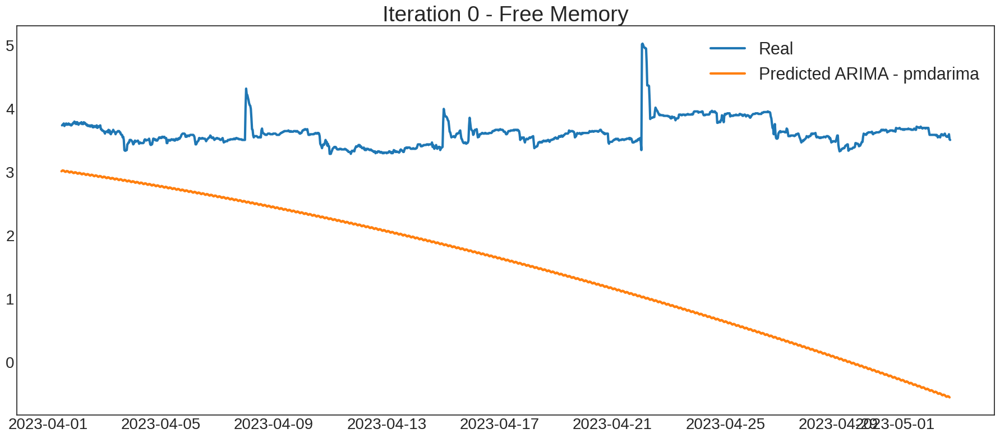

Training ARIMA... for Used Memory


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


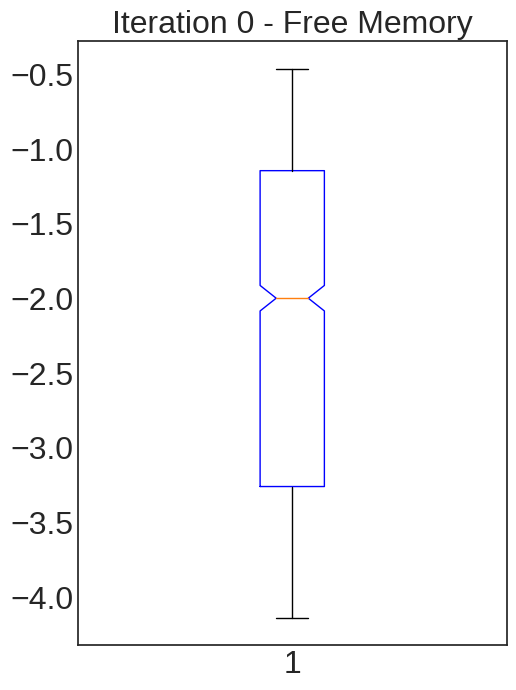

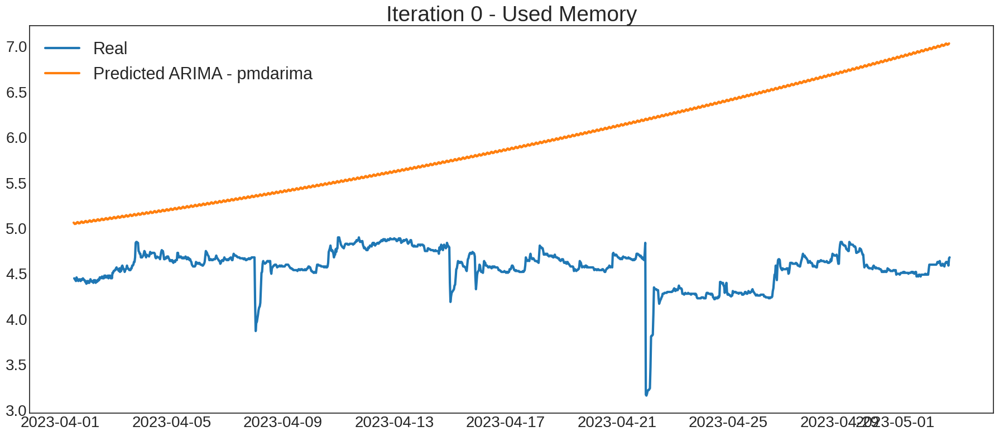

Training ARIMA... for Free Disk


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


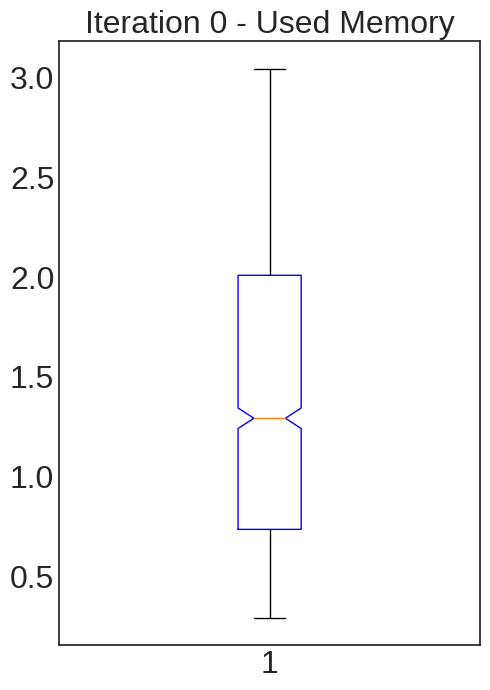

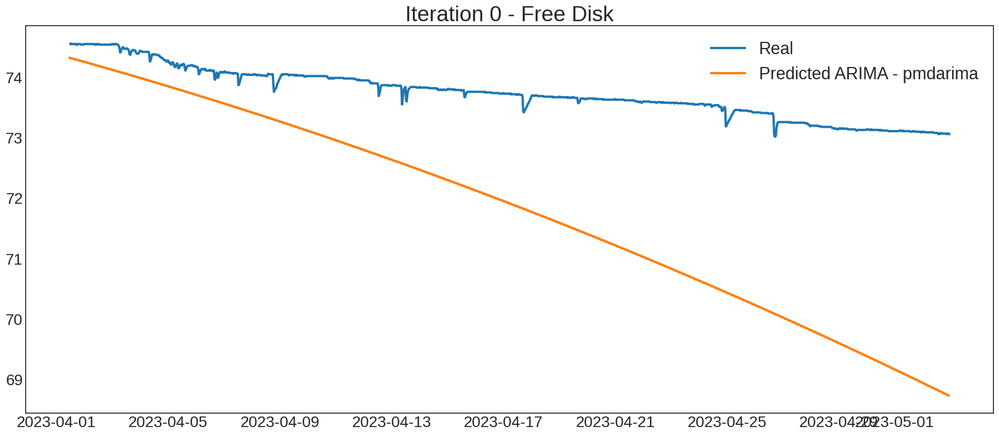

Training ARIMA... for Used Disk


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)


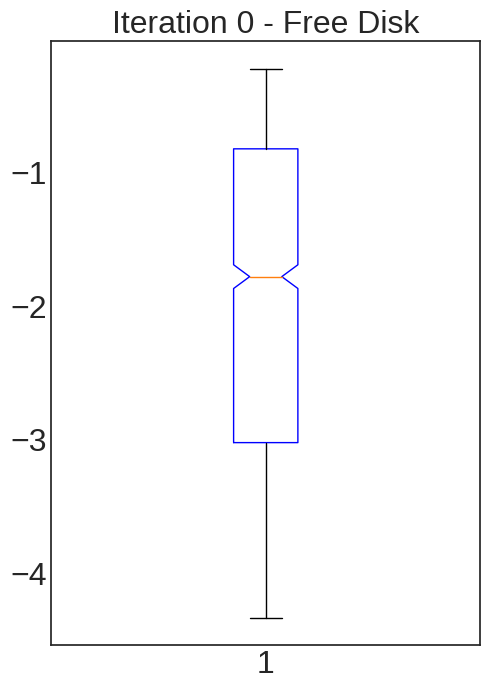

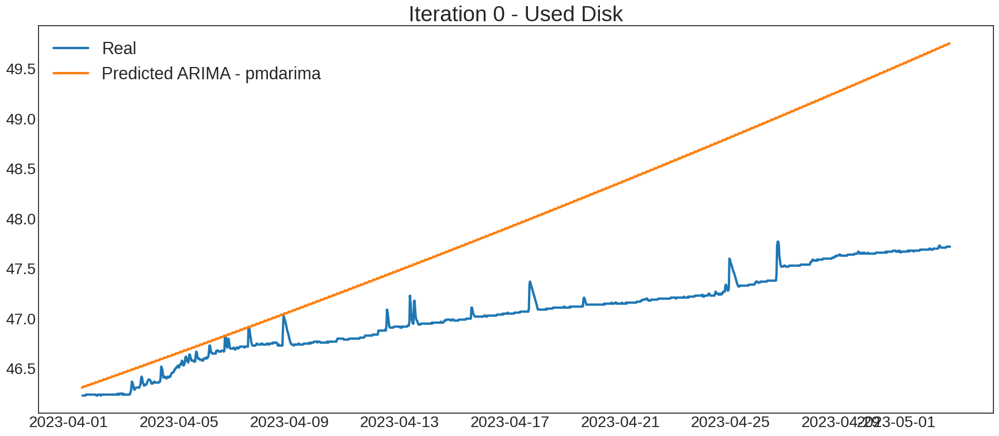

Training ARIMA... for Disk read/s


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


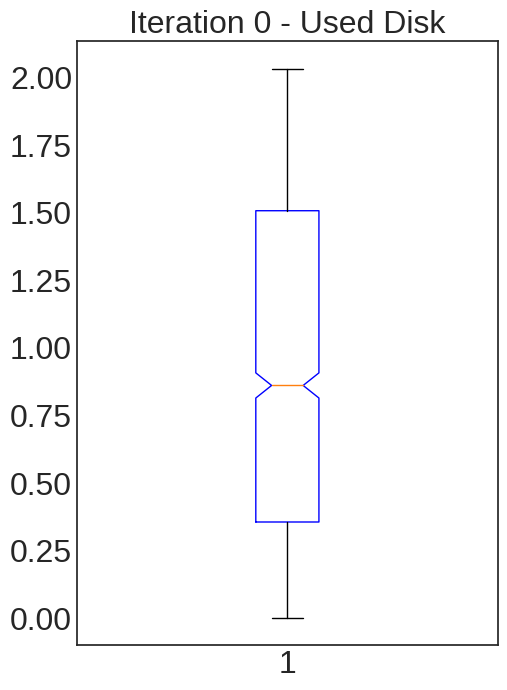

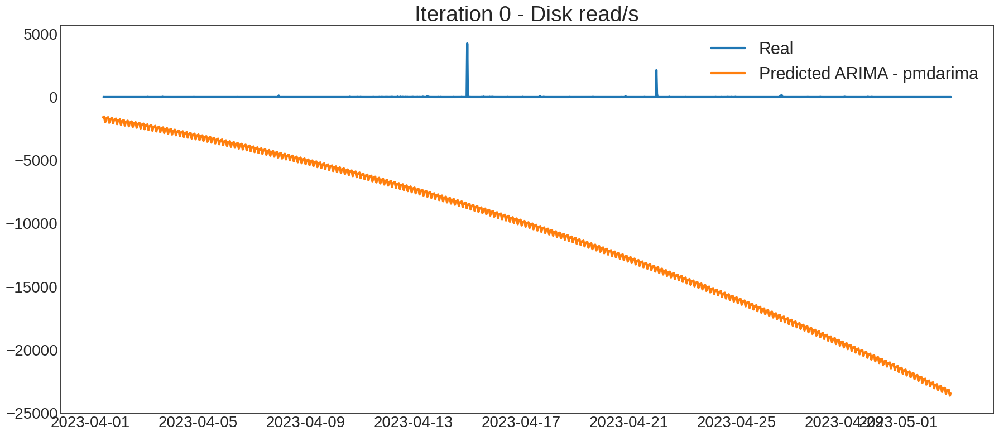

Training ARIMA... for Disk write/s


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


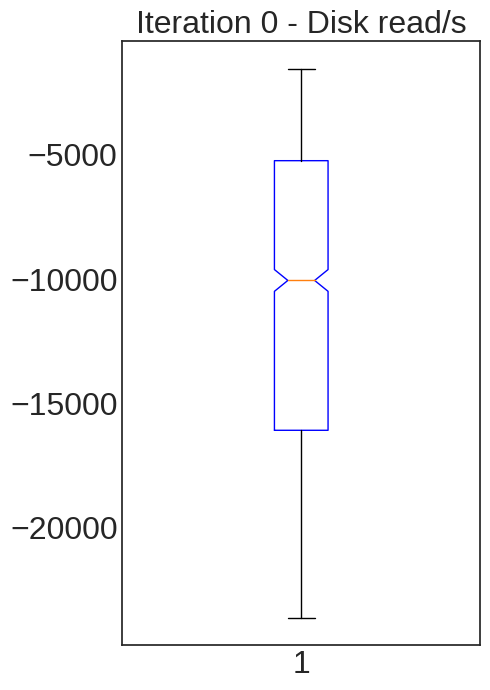

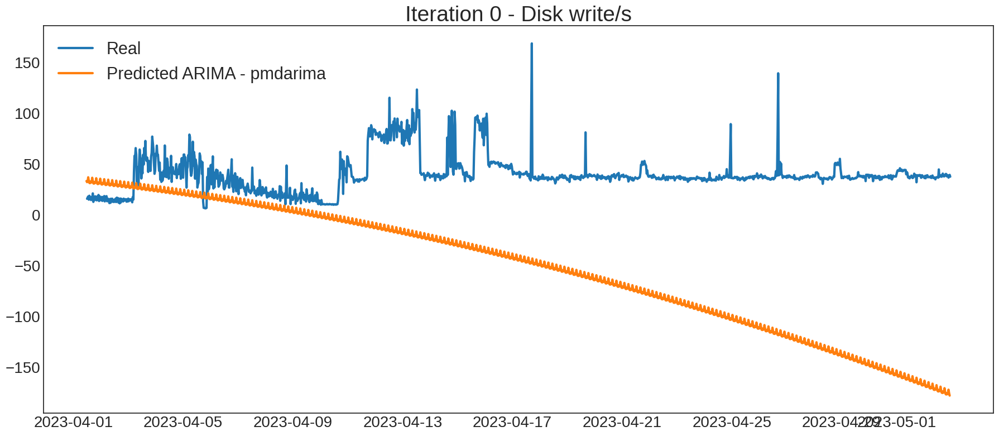

Training ARIMA... for NetBytes In


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


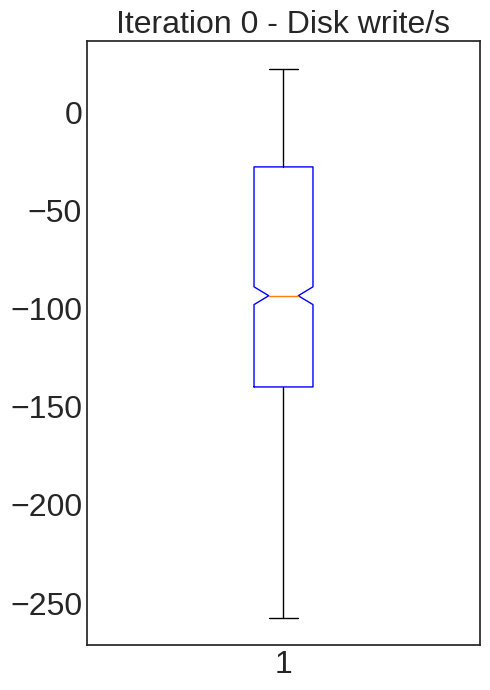

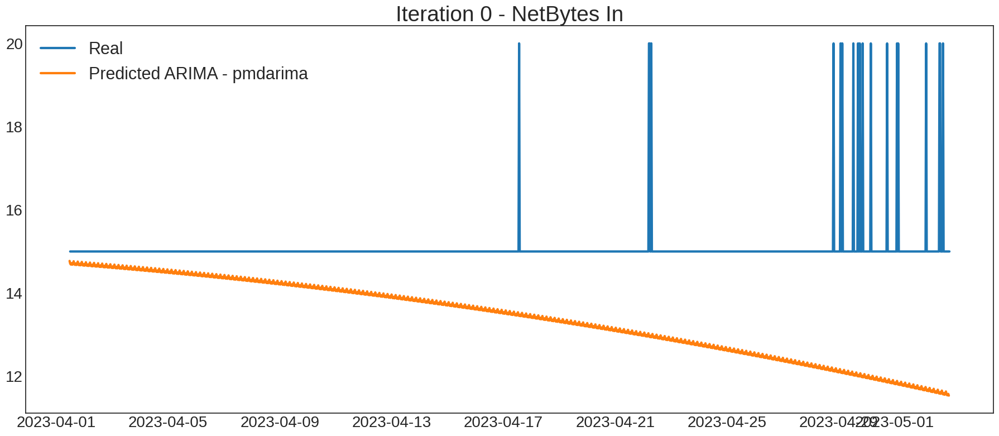

Training ARIMA... for NetBytes Out


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


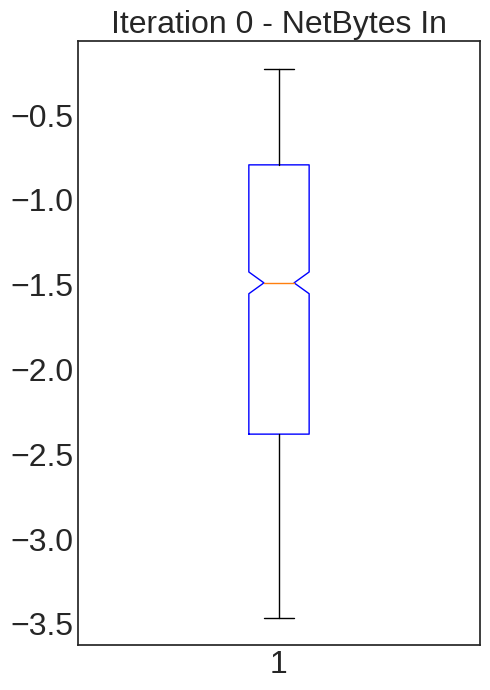

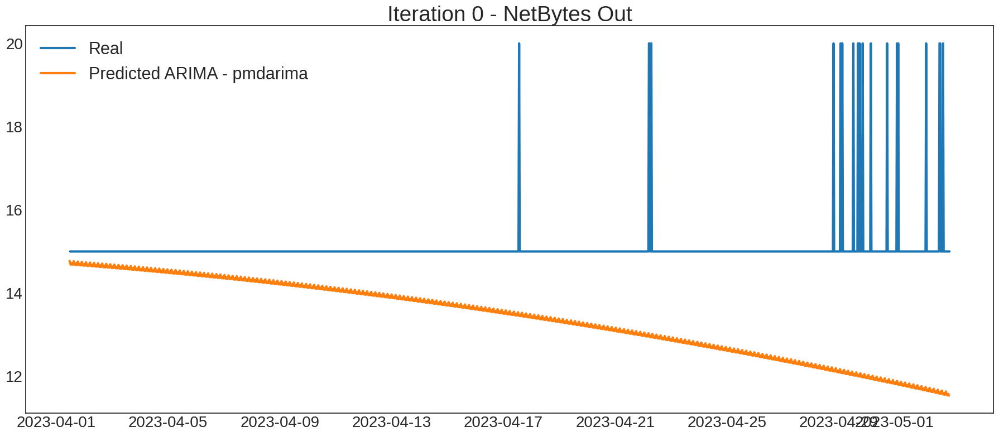

Training ARIMA... for NetPackets In


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


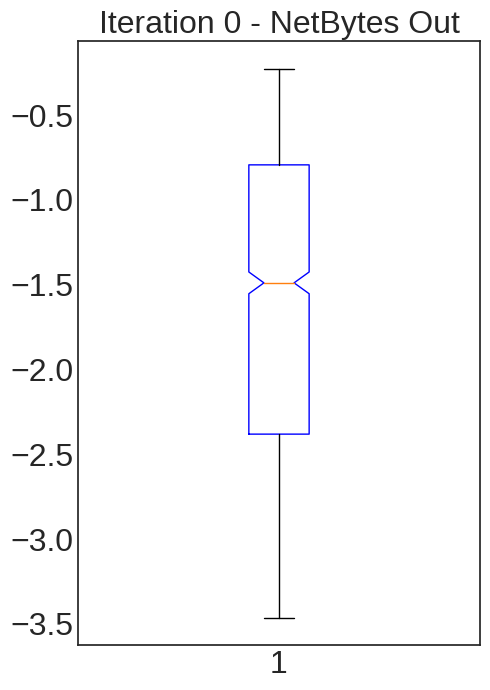

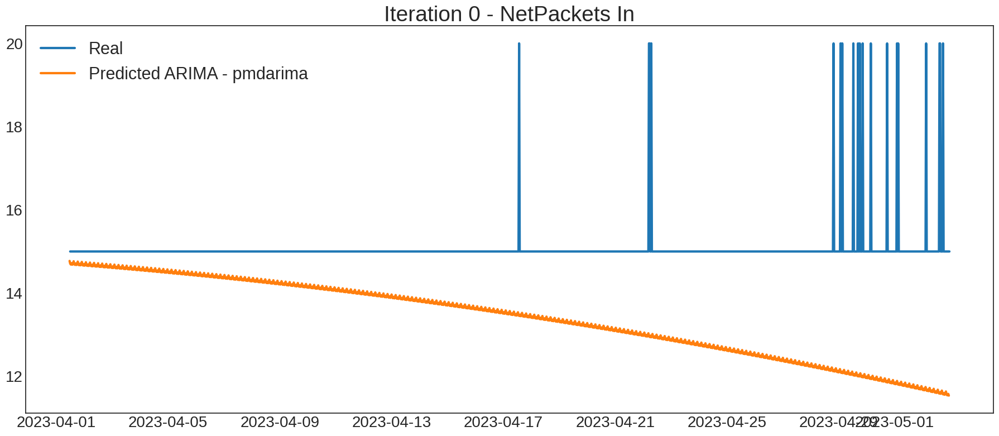

Training ARIMA... for NetPackets Out


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


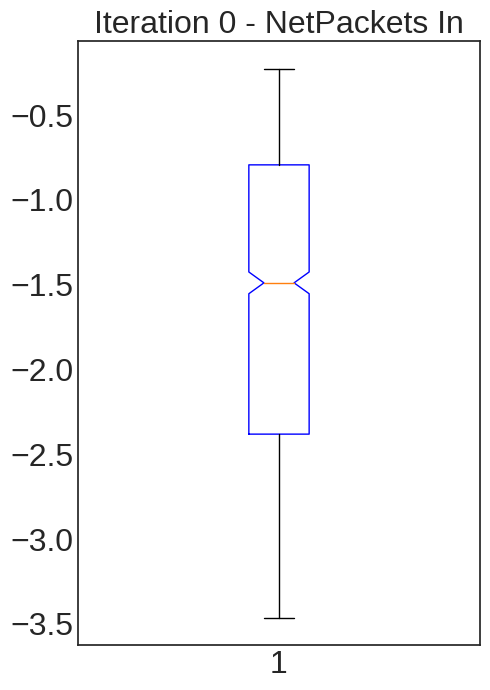

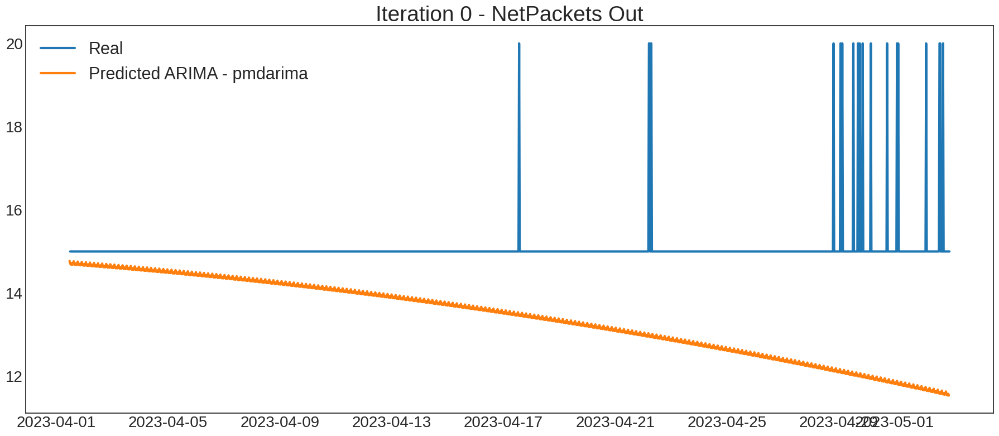

Training ARIMA... for Rx packets


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


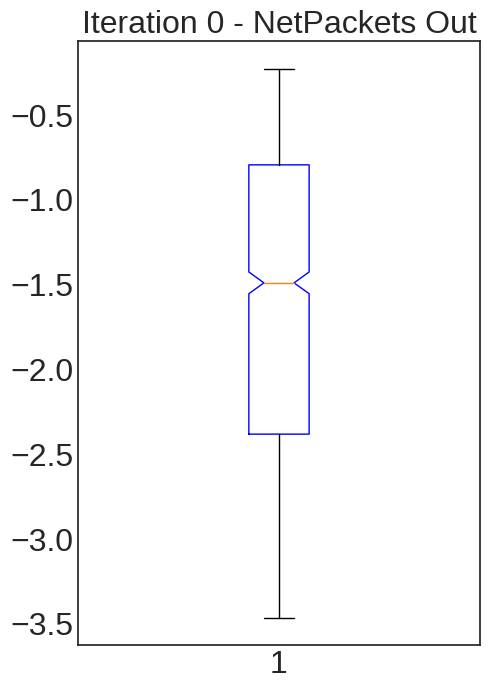

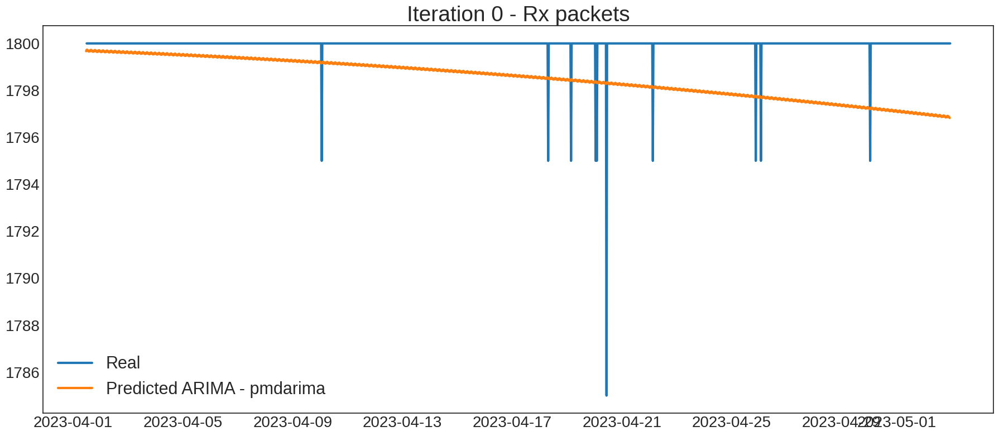

Training ARIMA... for Tx packets


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


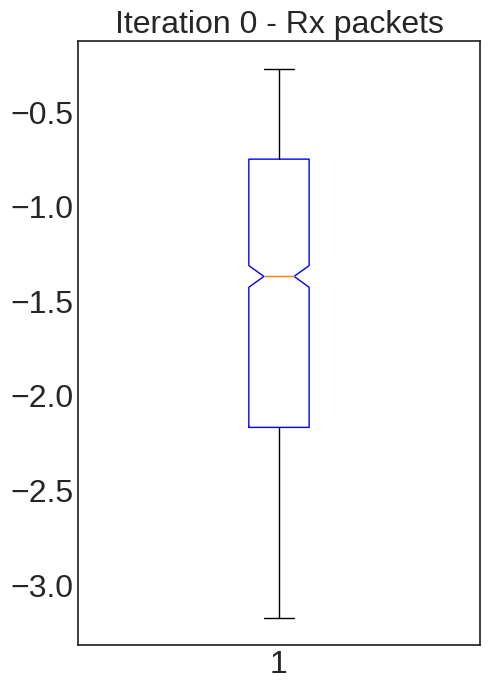

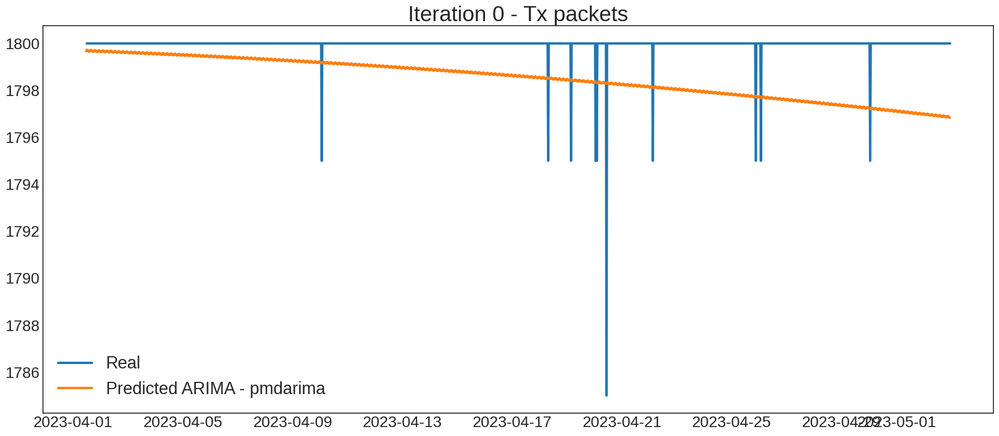

Training ARIMA... for CPU percent


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


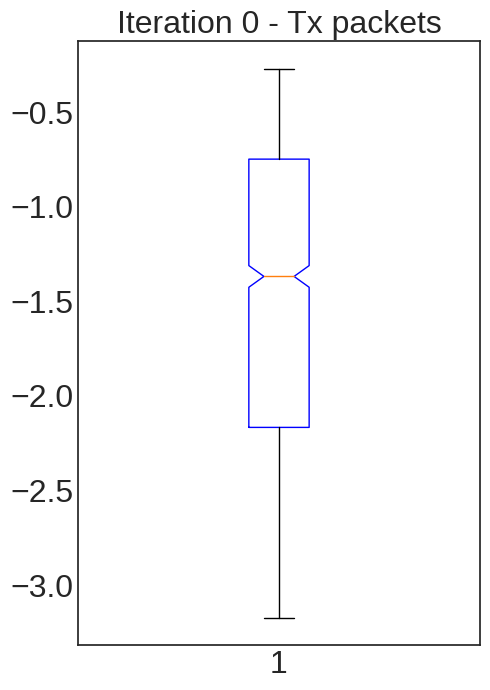

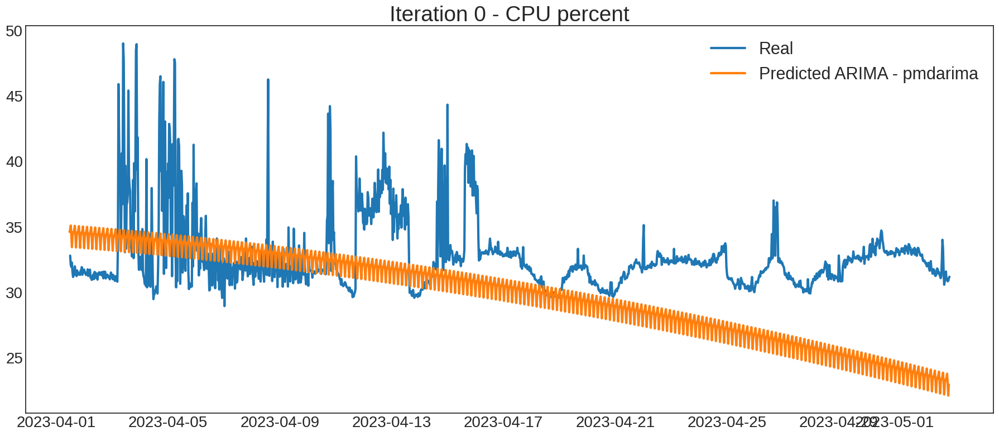

Training ARIMA... for Memory Used percent


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)


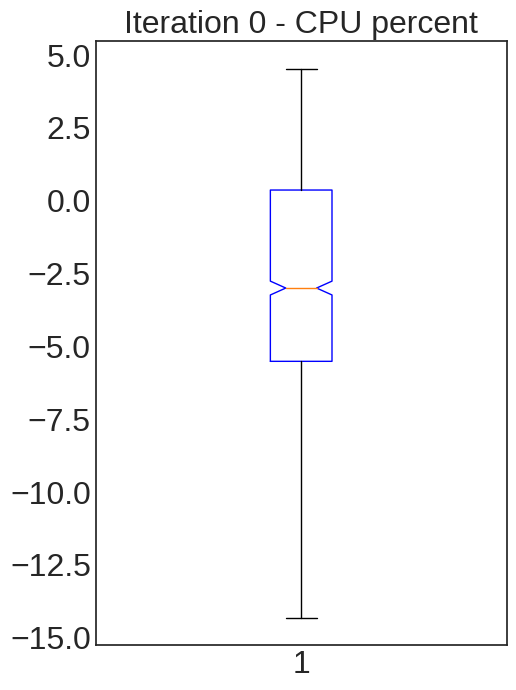

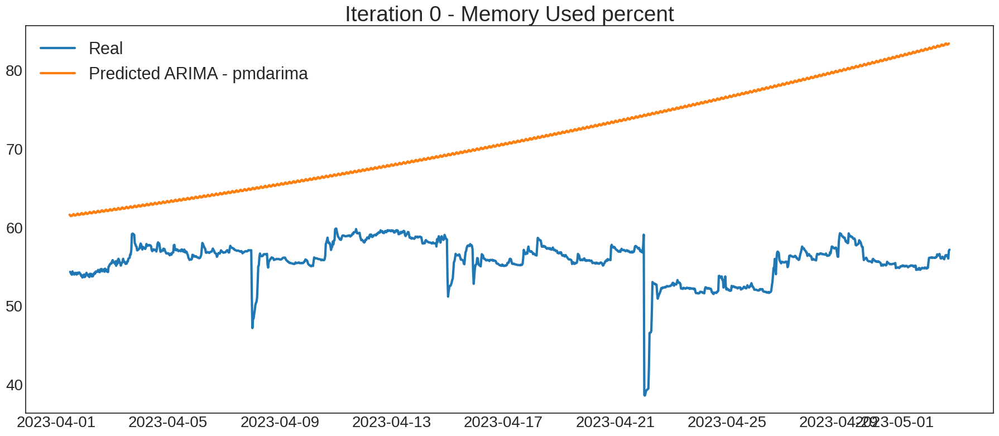

Training ARIMA... for Disk Used percent


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)


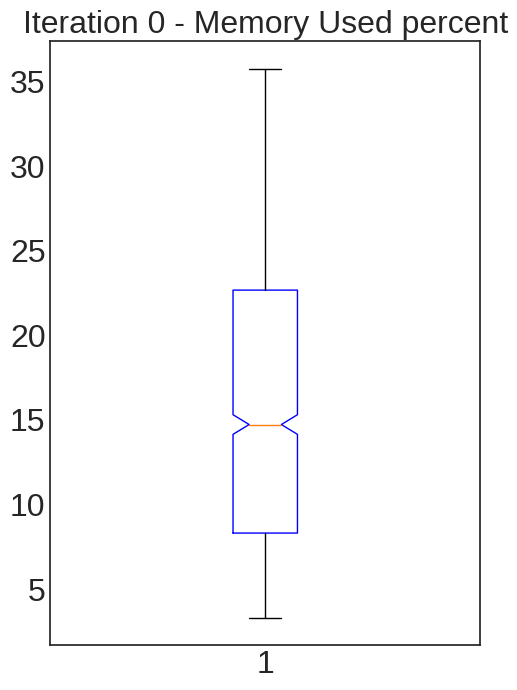

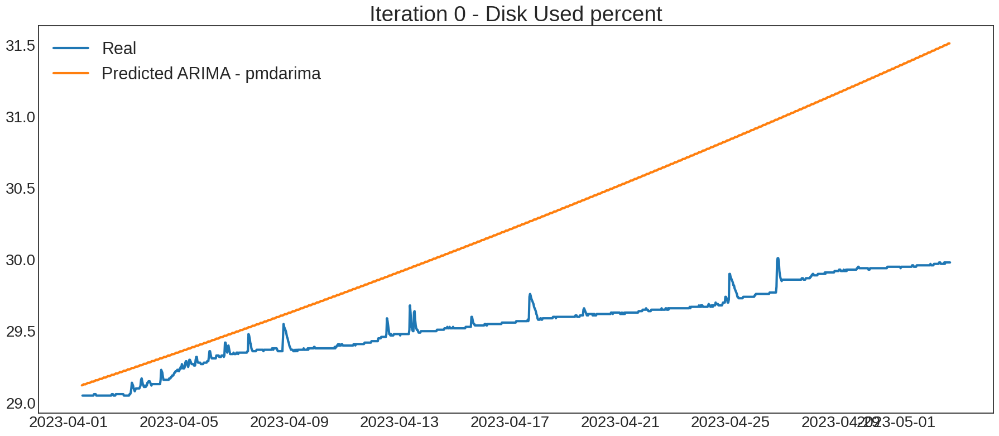

Training ARIMA... for Uptime


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)


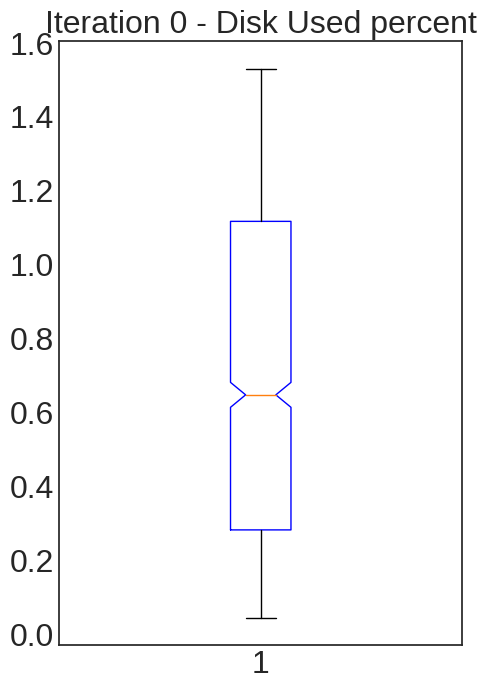

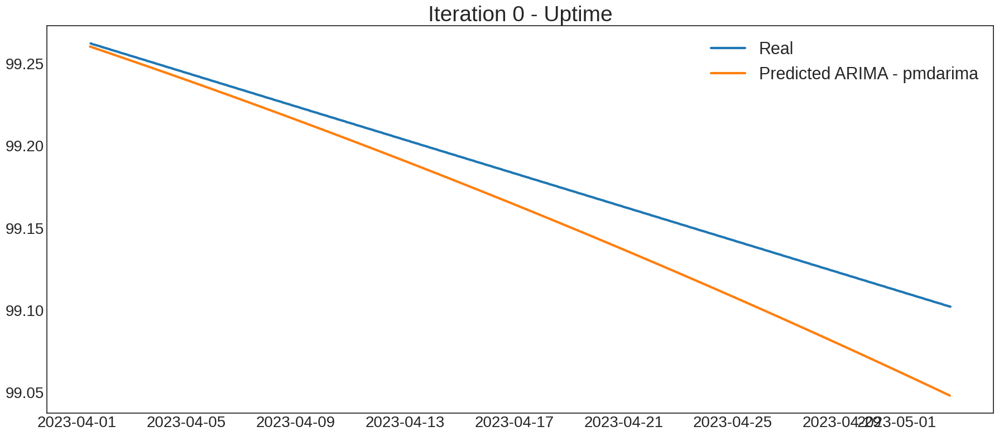

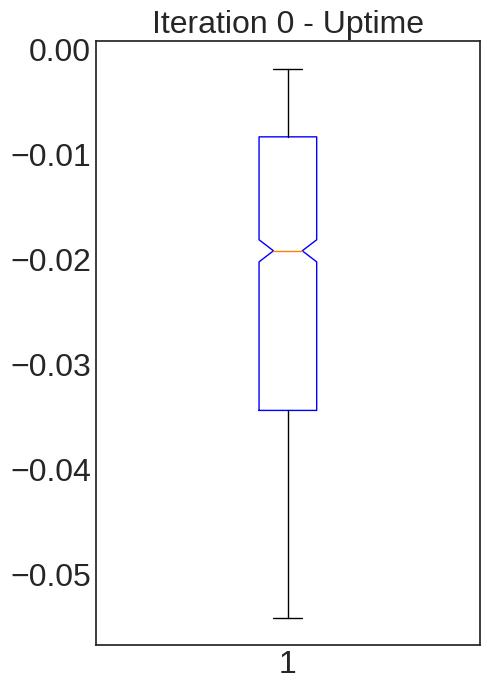

----------------------------------------
Training ARIMA... for Uptime (2418, 1) ---- (1208,)
----------------------------------------
Training ARIMA... for Free Memory


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)


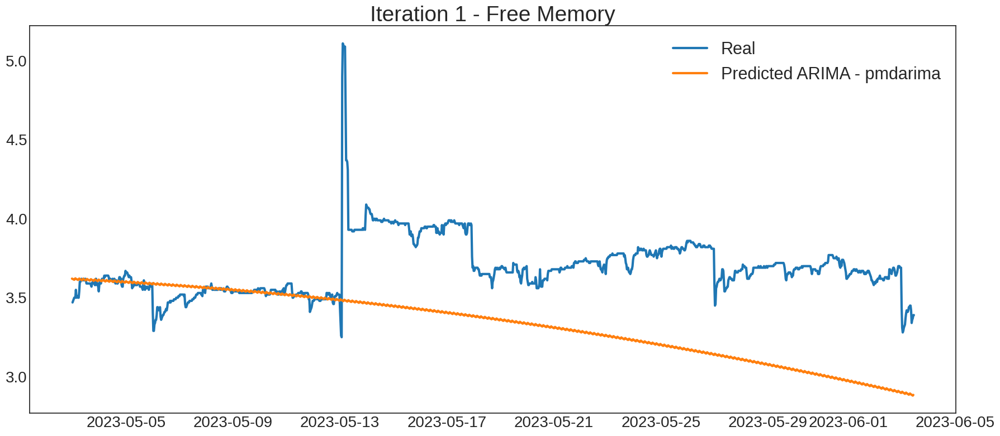

Training ARIMA... for Used Memory


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


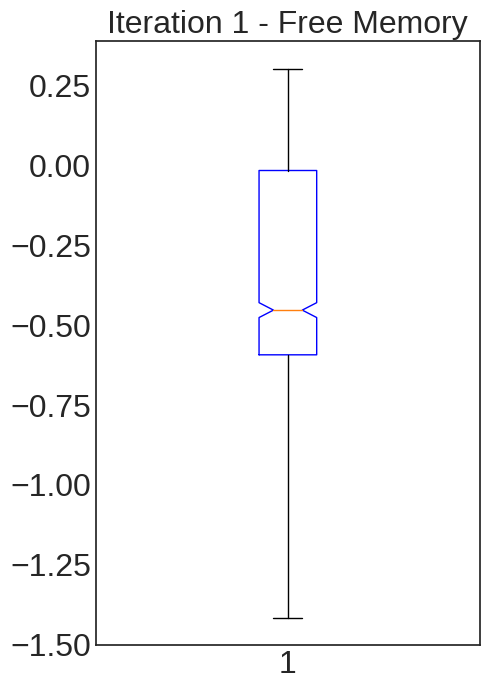

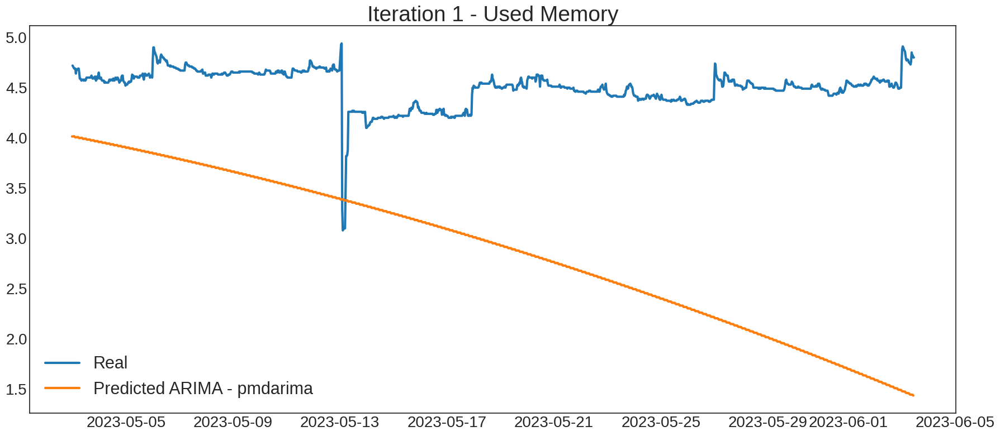

Training ARIMA... for Free Disk


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


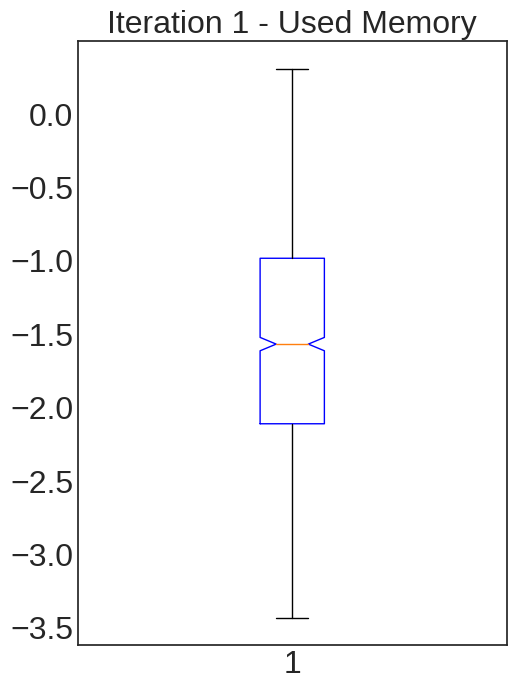

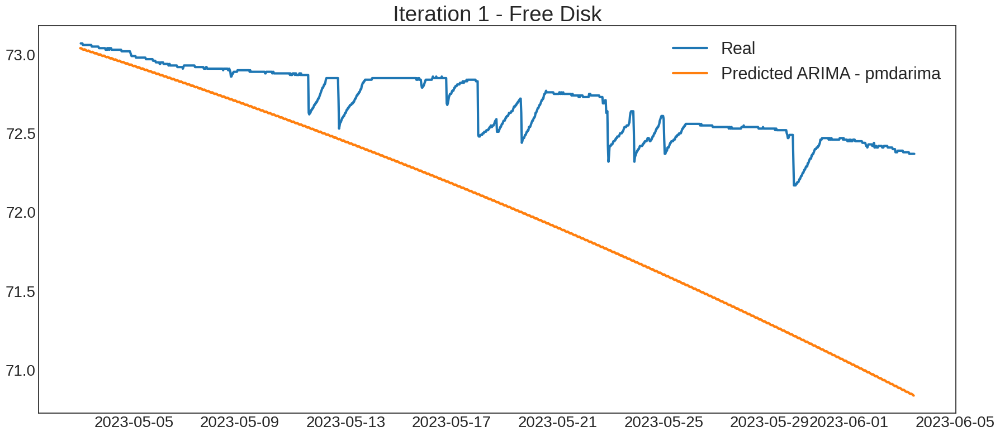

Training ARIMA... for Used Disk


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


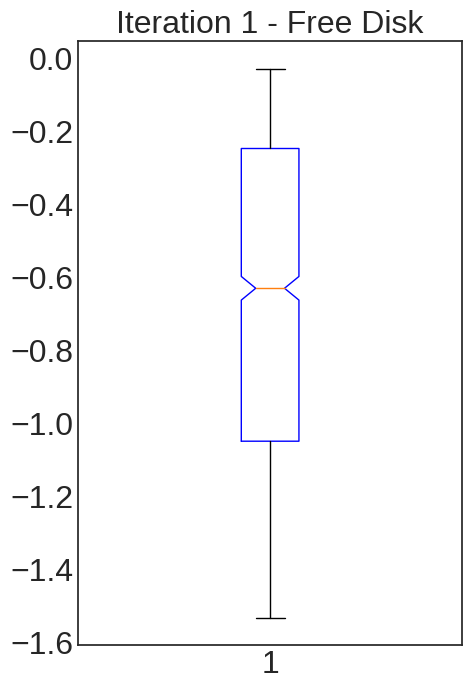

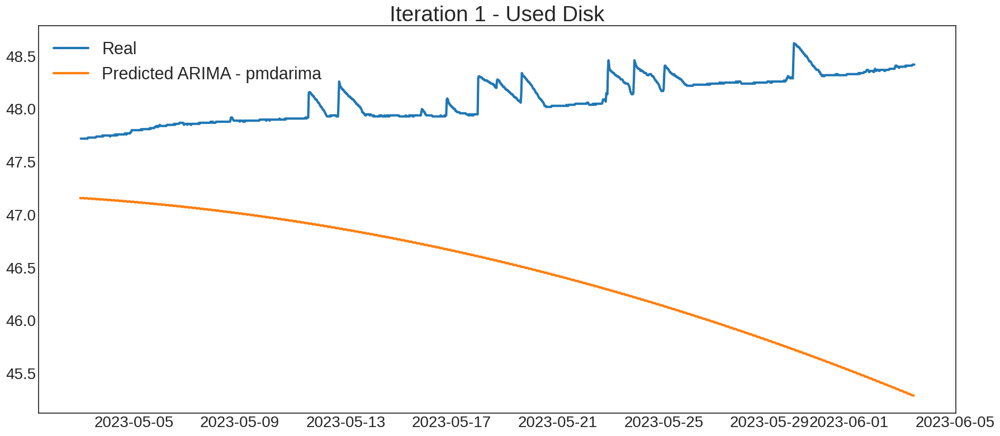

Training ARIMA... for Disk read/s


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)


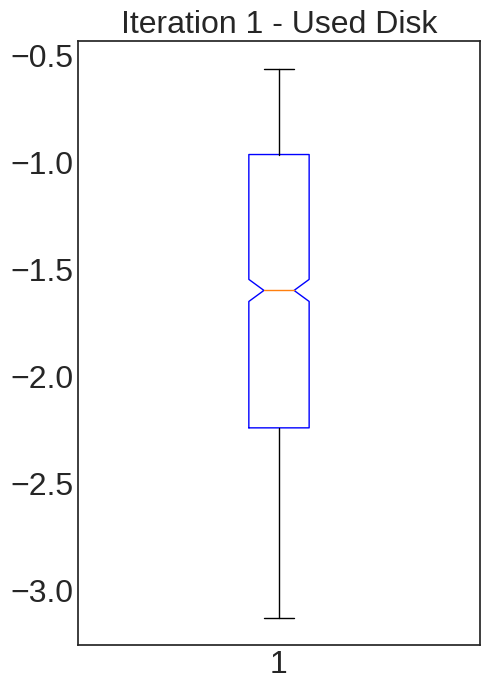

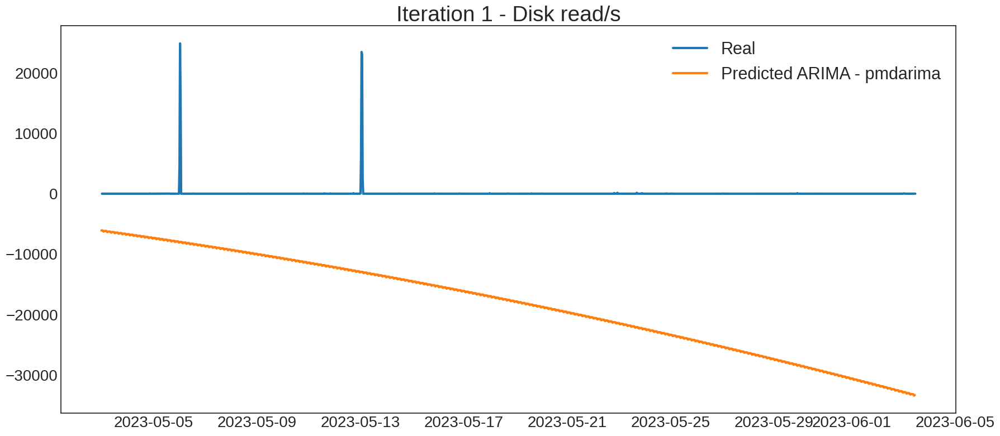

Training ARIMA... for Disk write/s


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)


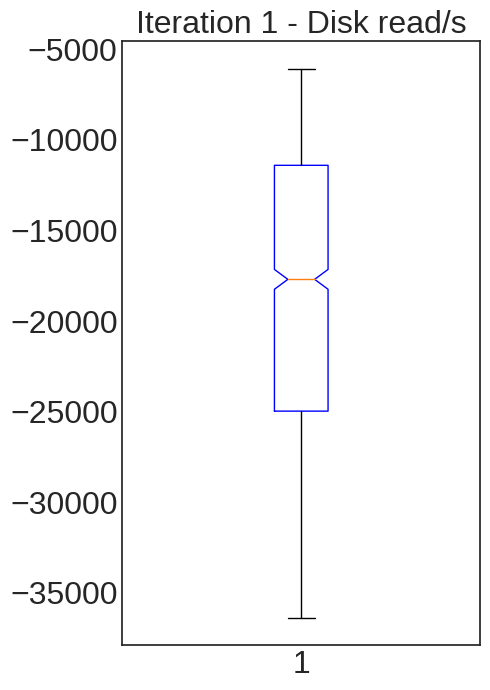

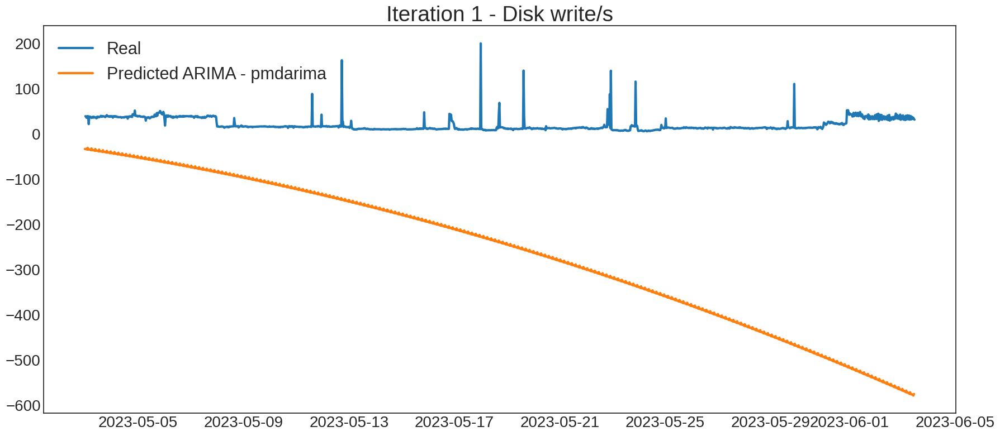

Training ARIMA... for NetBytes In


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


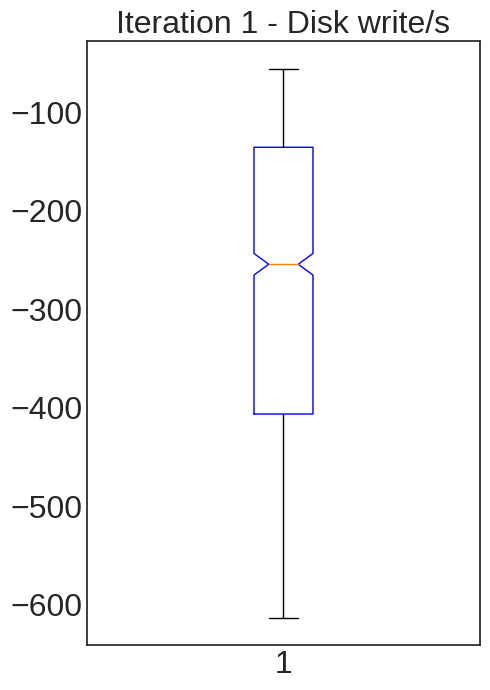

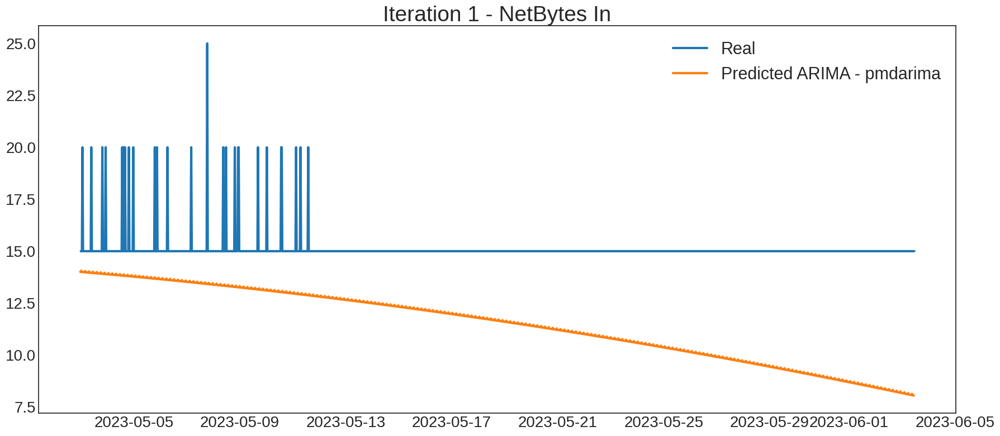

Training ARIMA... for NetBytes Out


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


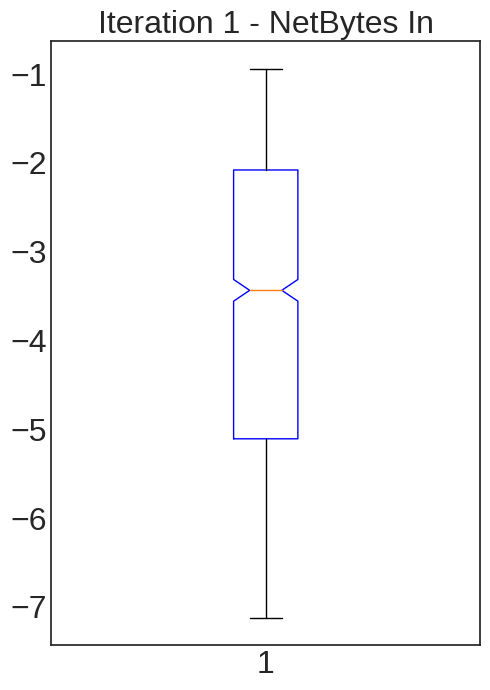

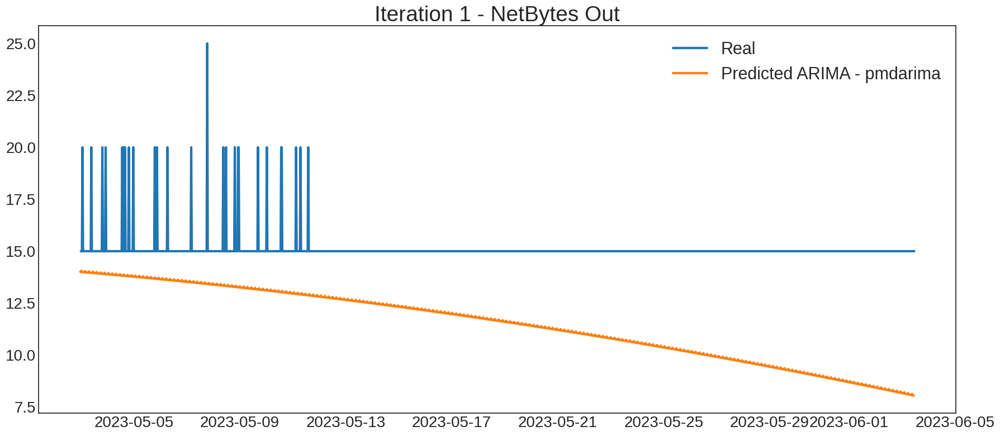

Training ARIMA... for NetPackets In


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


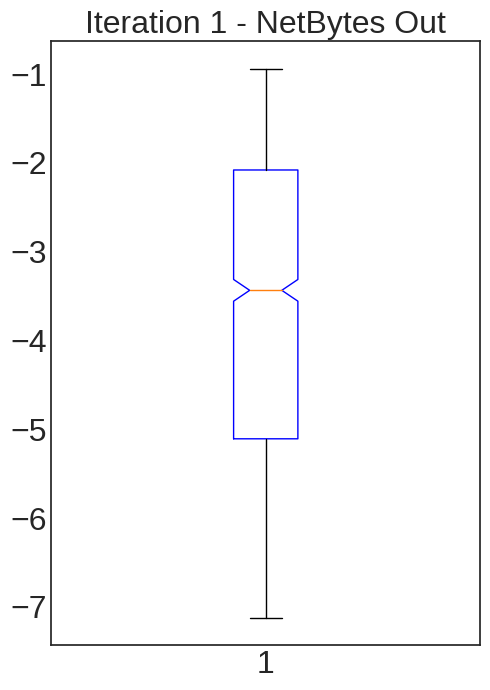

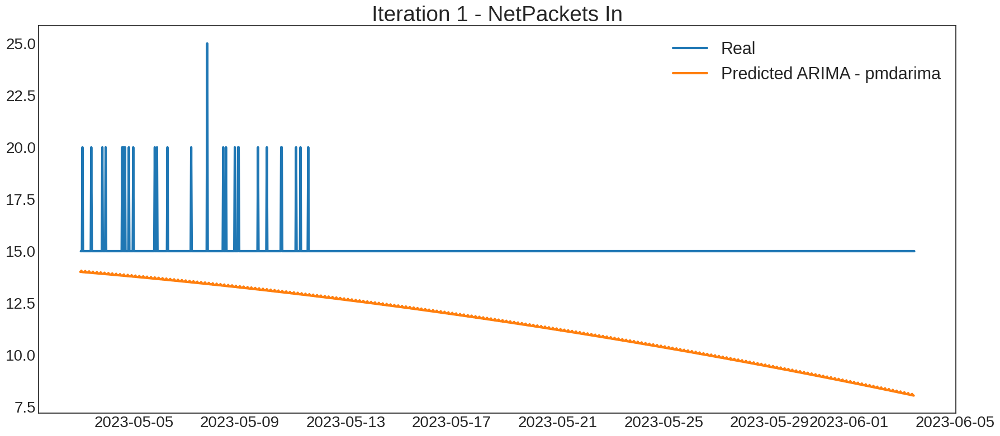

Training ARIMA... for NetPackets Out


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


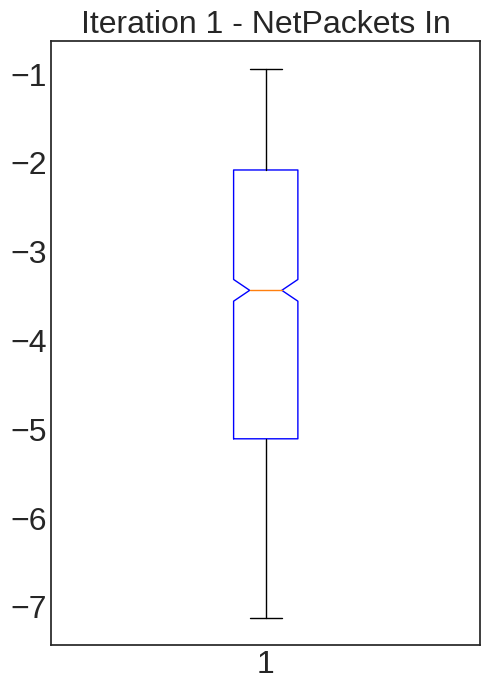

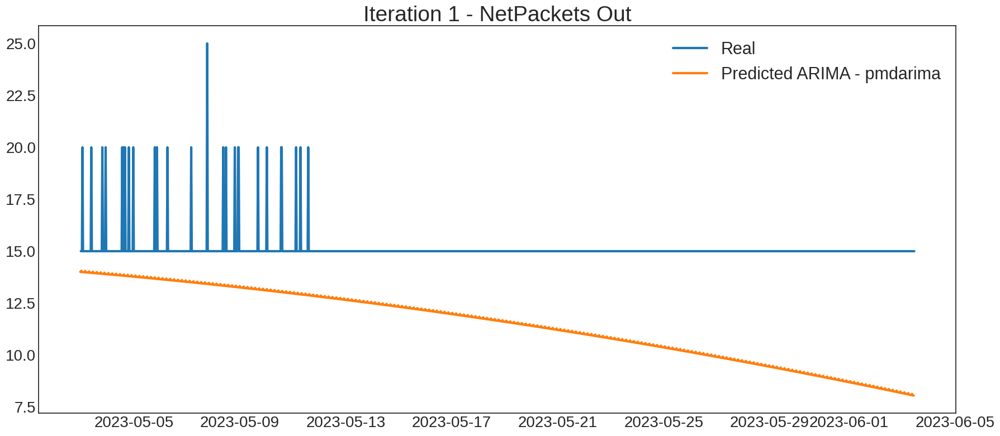

Training ARIMA... for Rx packets


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


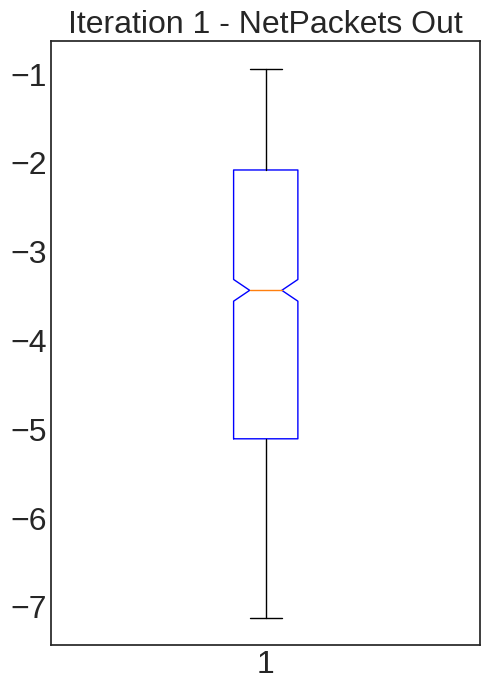

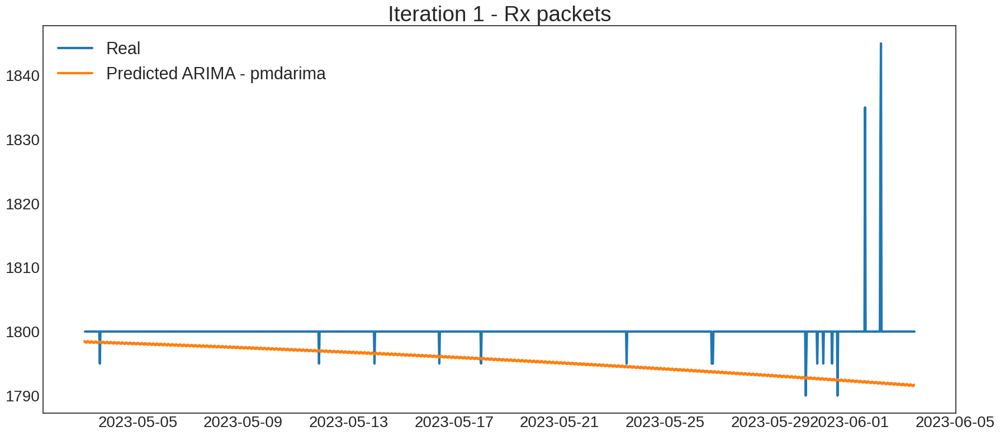

Training ARIMA... for Tx packets


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


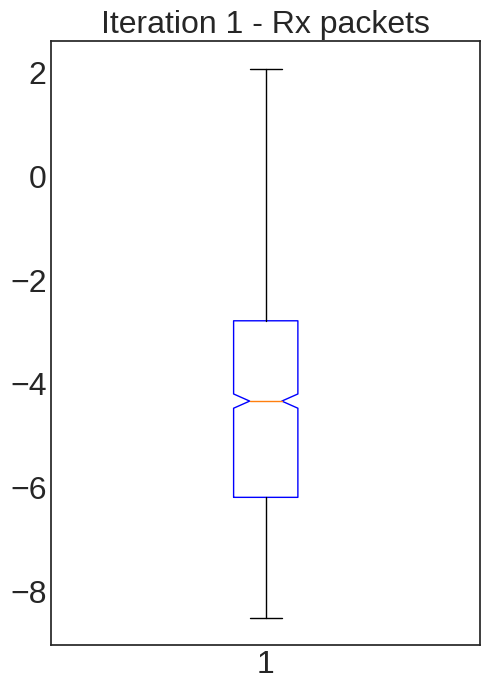

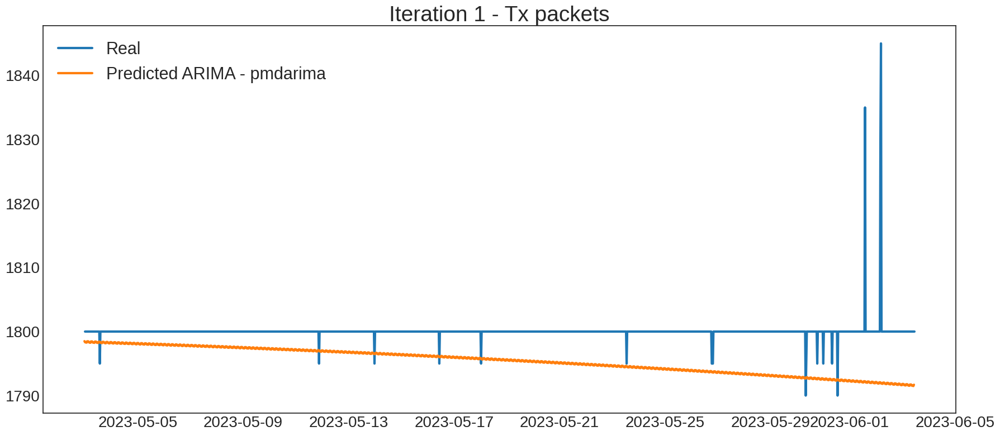

Training ARIMA... for CPU percent


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)


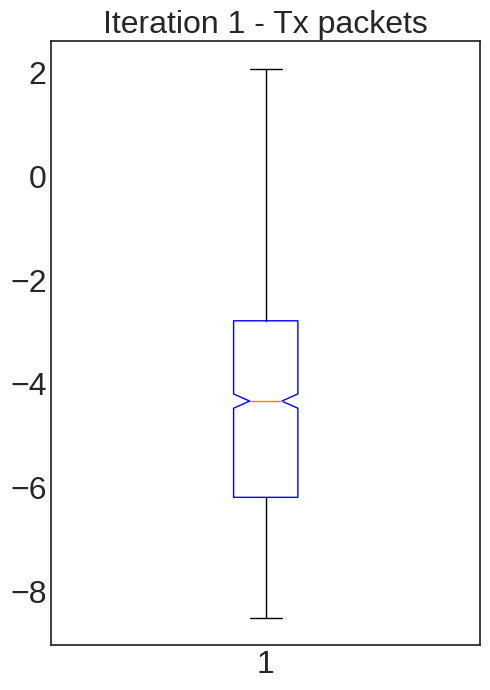

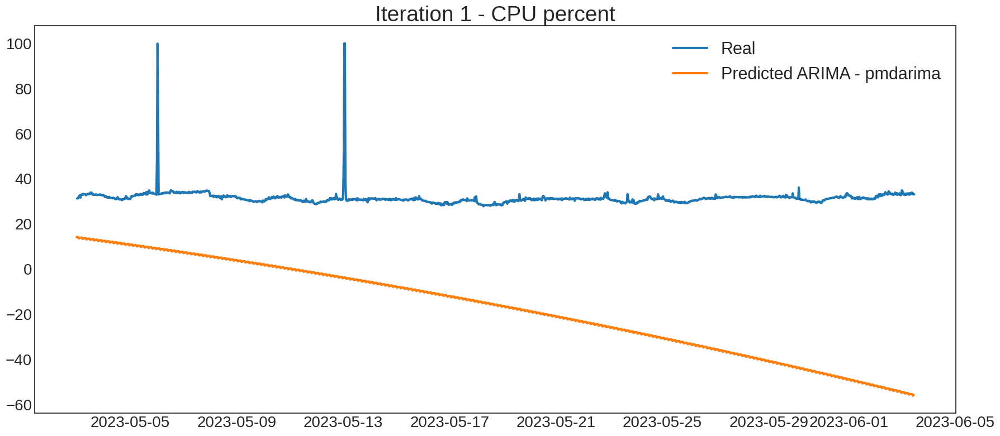

Training ARIMA... for Memory Used percent


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)


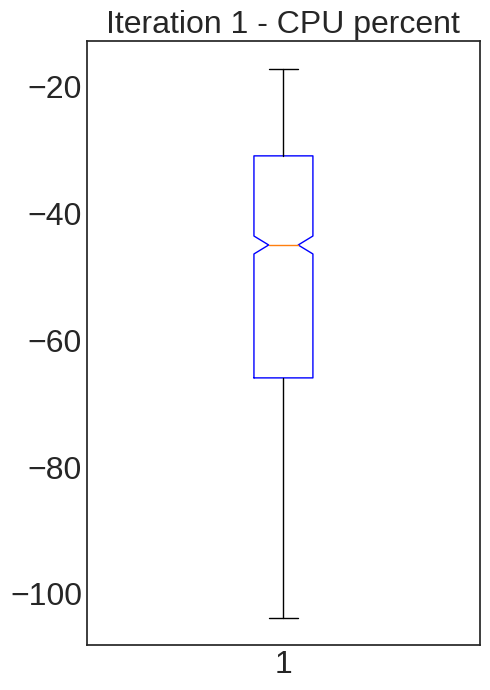

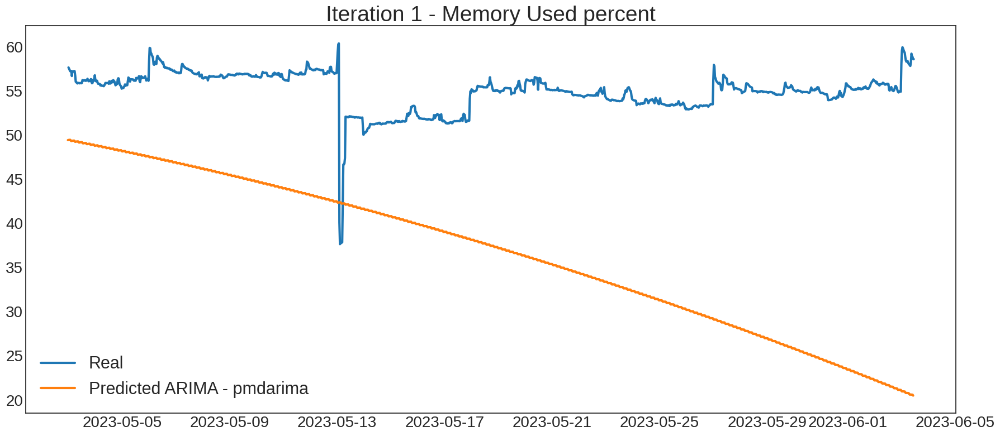

Training ARIMA... for Disk Used percent


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)


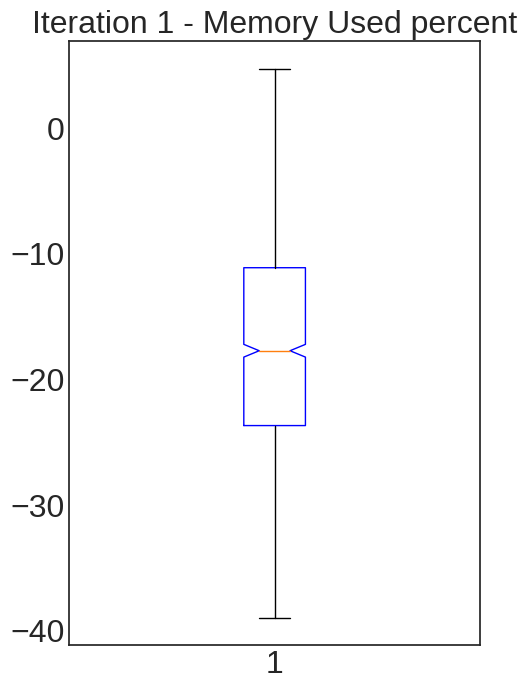

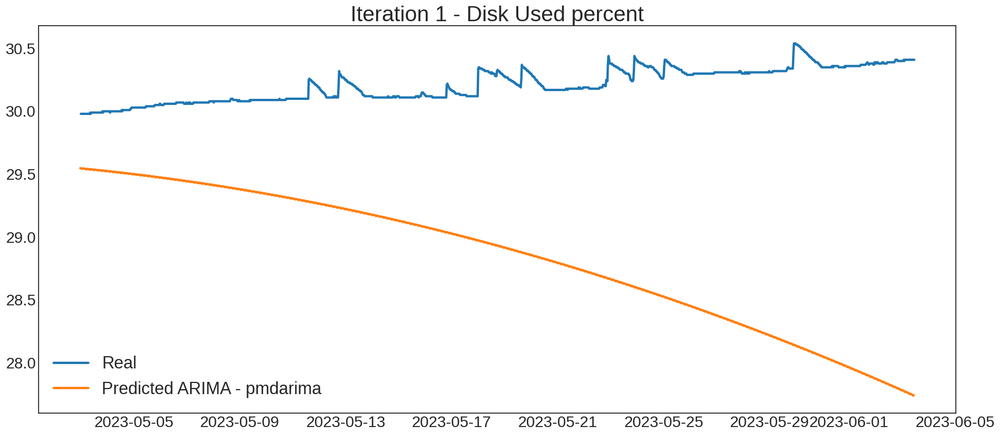

Training ARIMA... for Uptime


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)


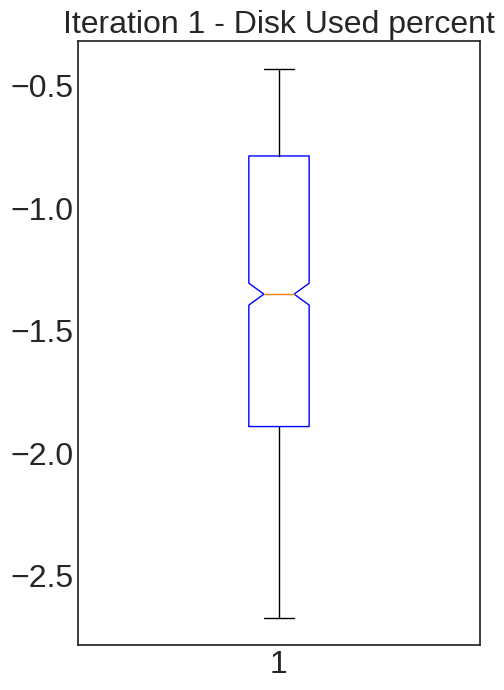

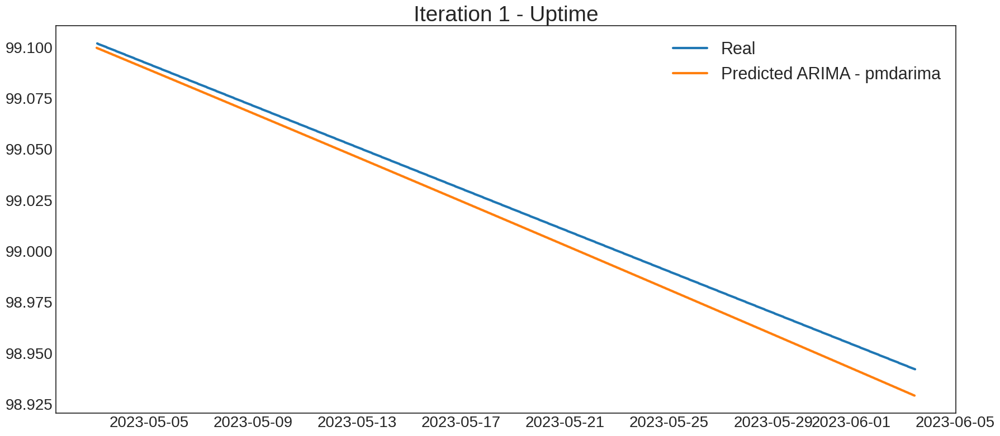

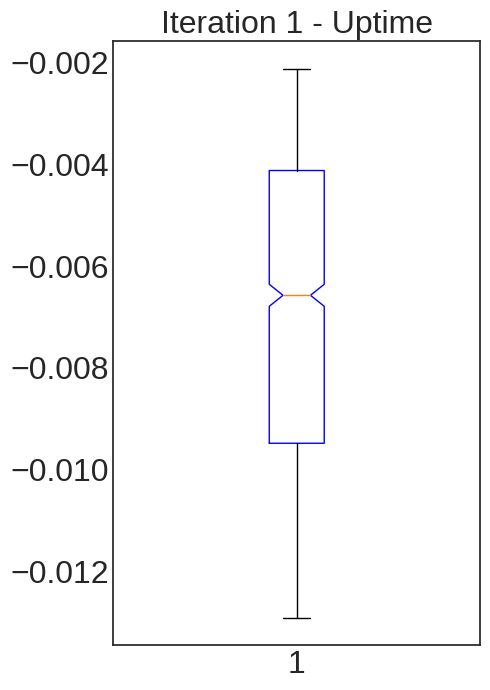

----------------------------------------
Training ARIMA... for Uptime (3627, 1) ---- (2418,)
----------------------------------------
Training ARIMA... for Free Memory


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)


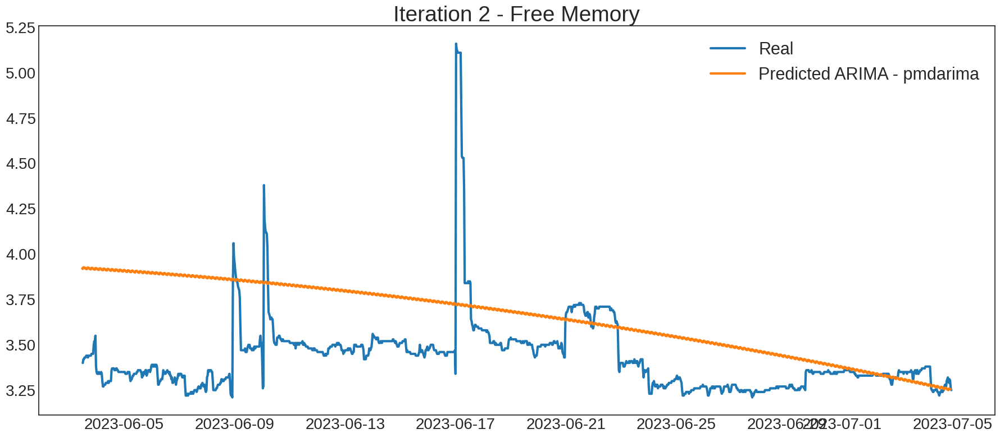

Training ARIMA... for Used Memory


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


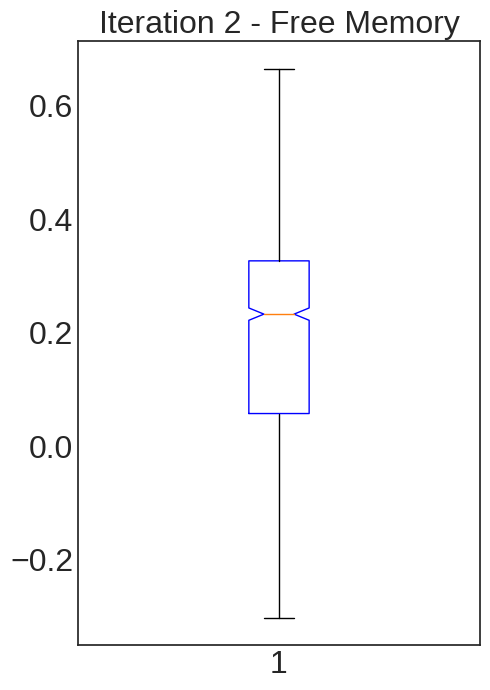

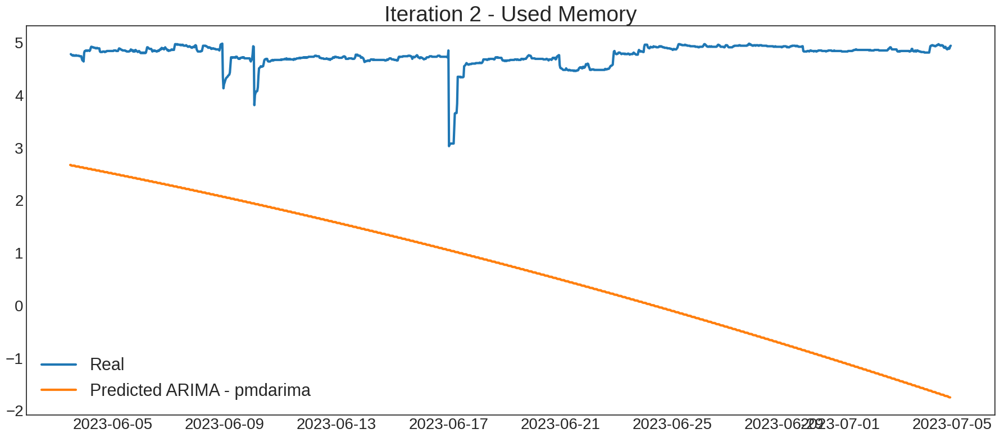

Training ARIMA... for Free Disk


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)


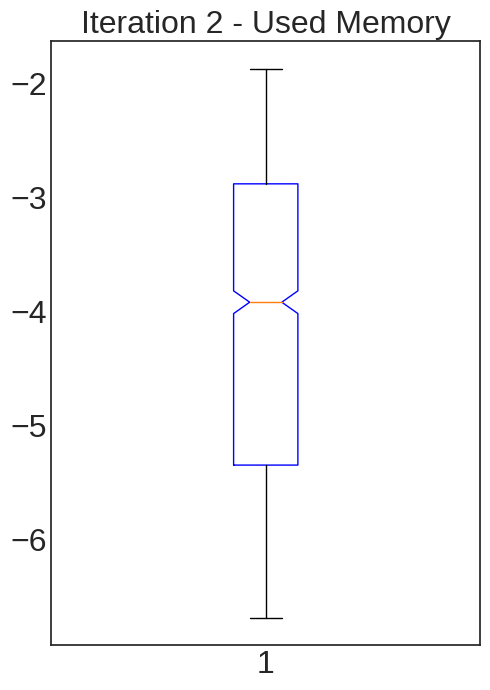

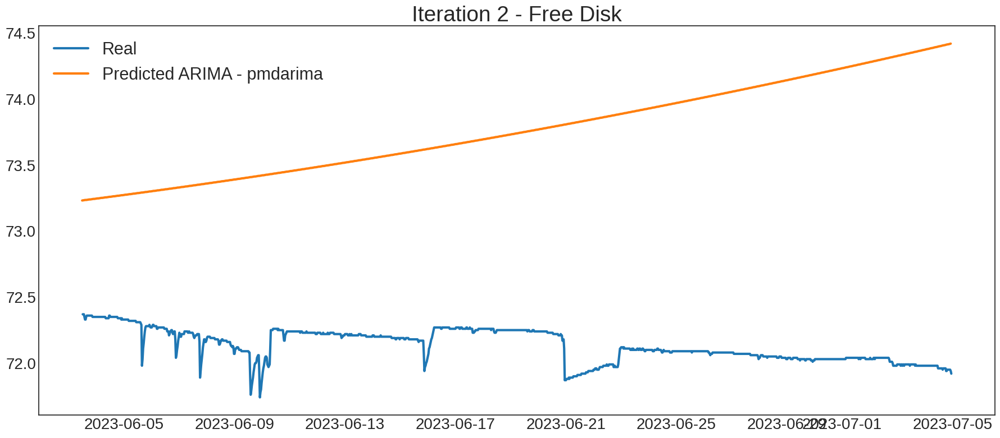

Training ARIMA... for Used Disk


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


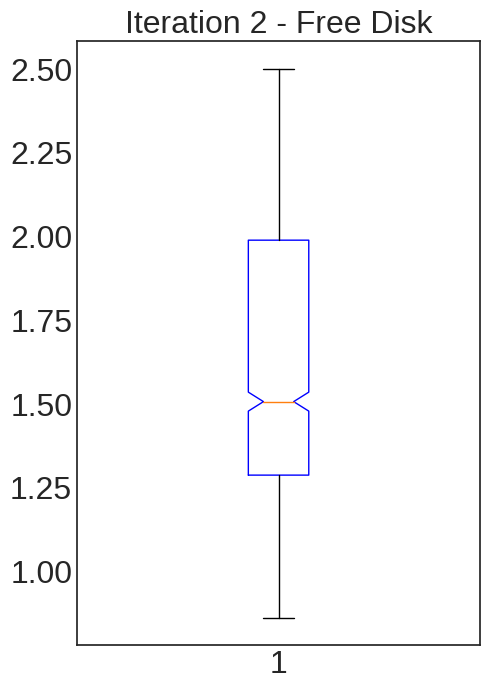

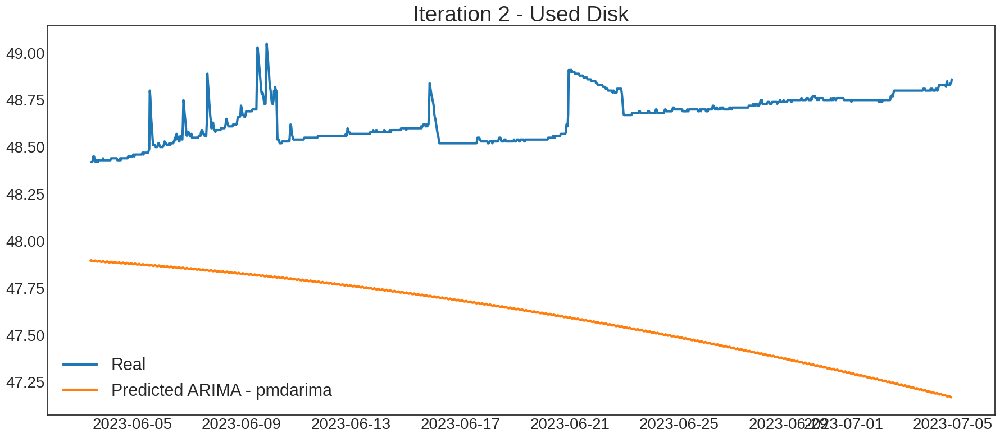

Training ARIMA... for Disk read/s


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)


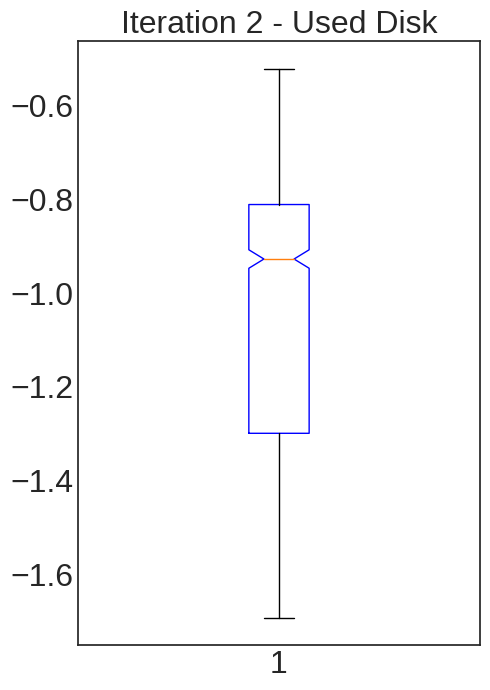

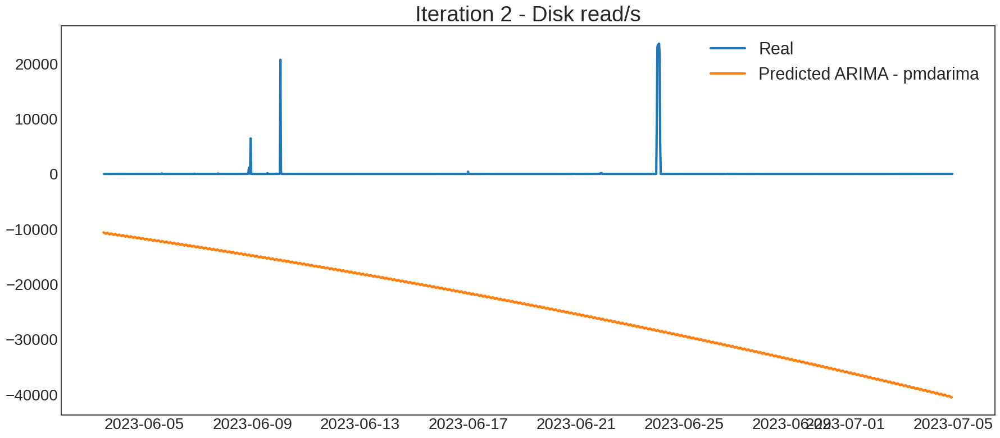

Training ARIMA... for Disk write/s


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)


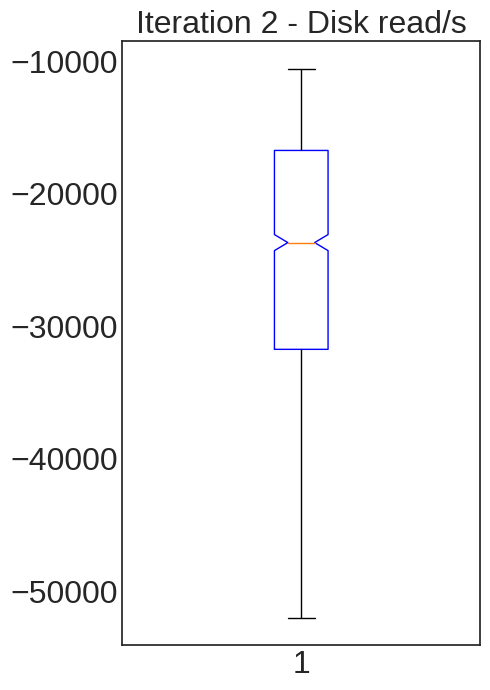

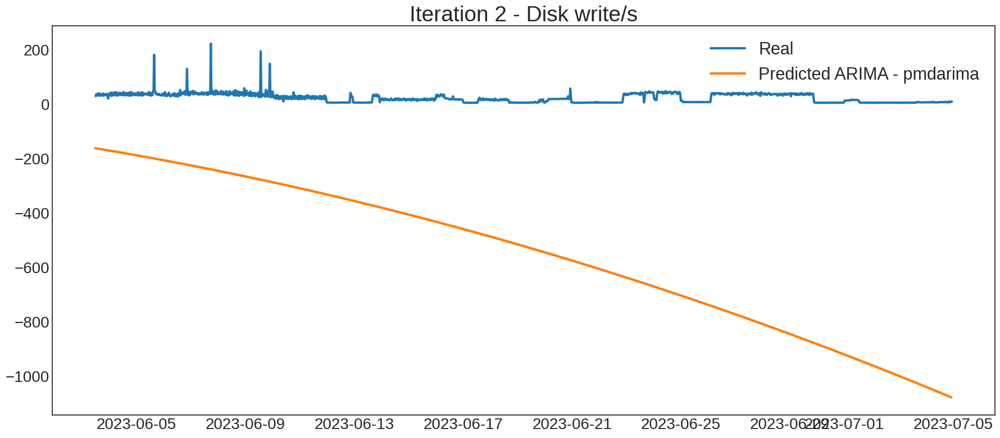

Training ARIMA... for NetBytes In


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


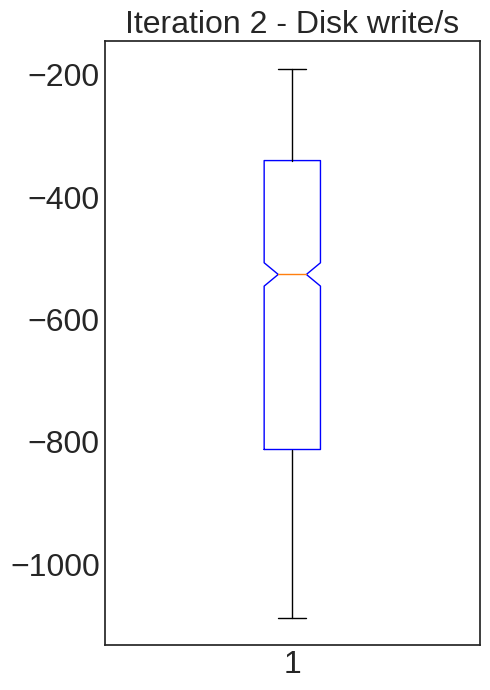

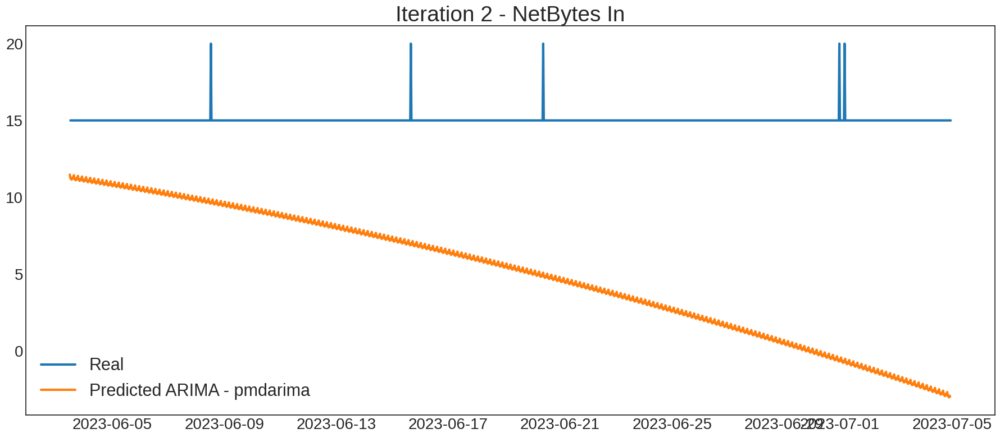

Training ARIMA... for NetBytes Out


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


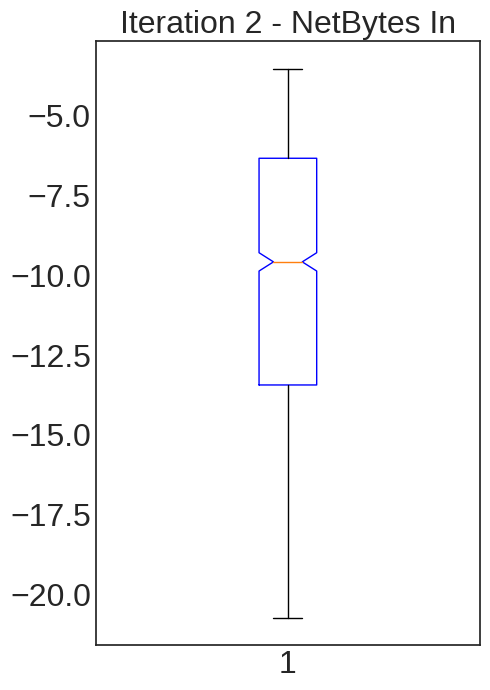

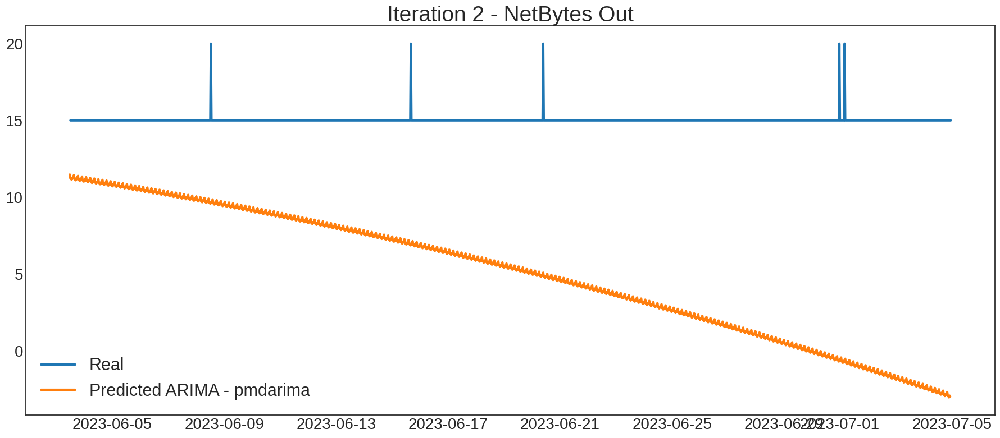

Training ARIMA... for NetPackets In


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


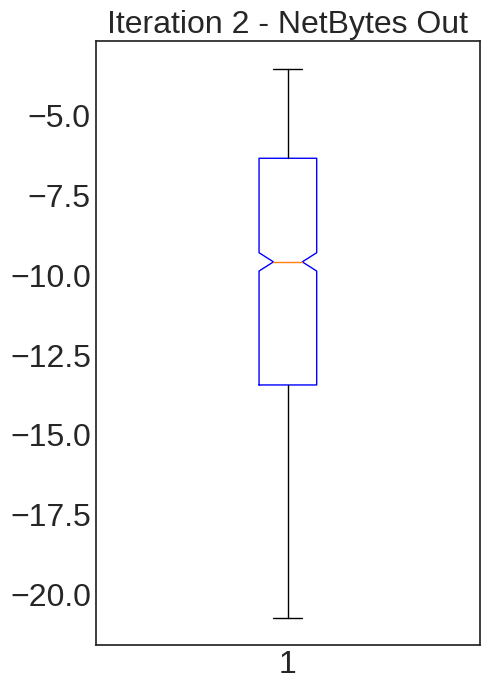

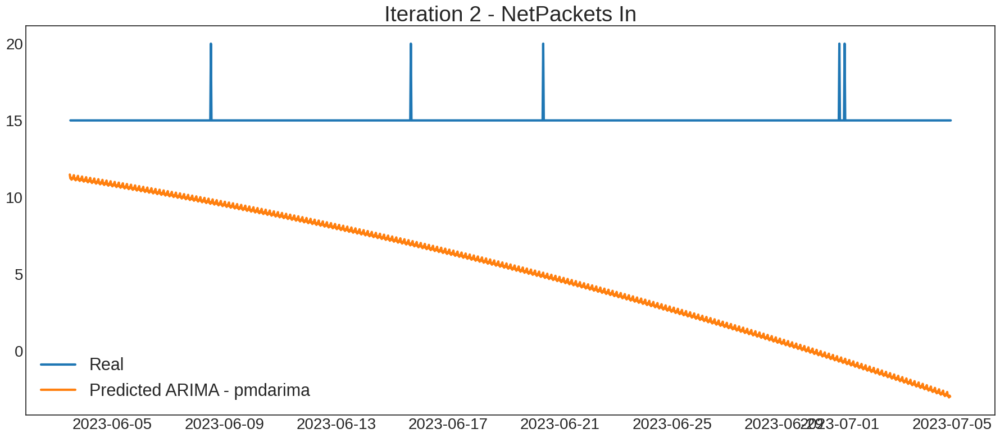

Training ARIMA... for NetPackets Out


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


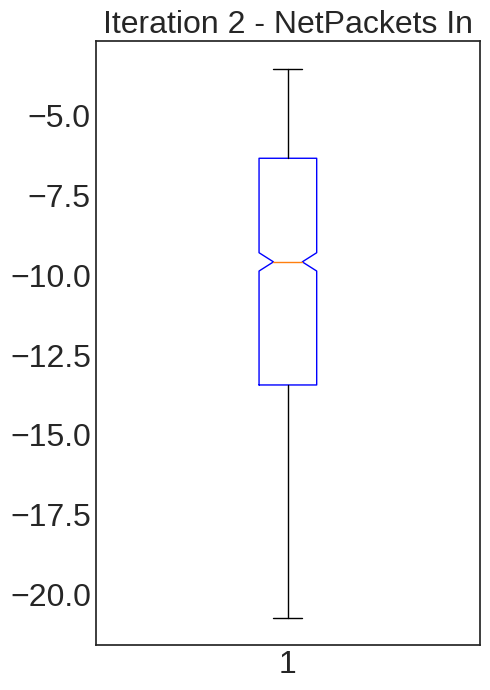

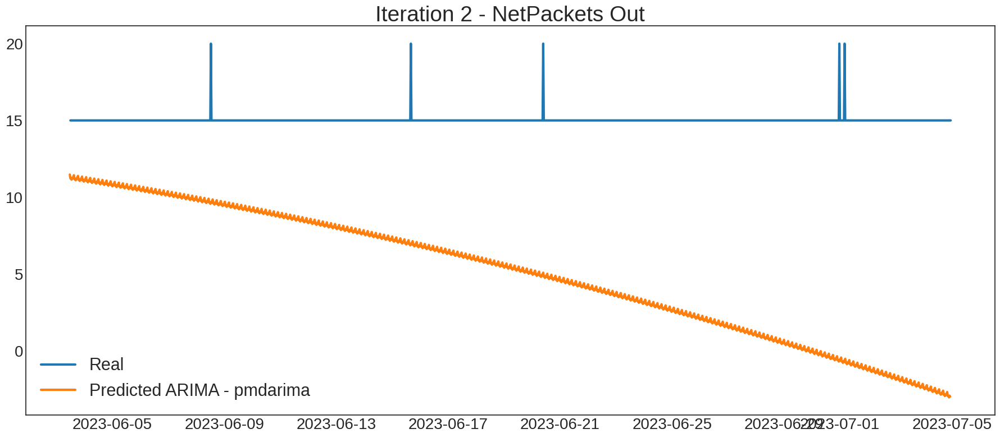

Training ARIMA... for Rx packets


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


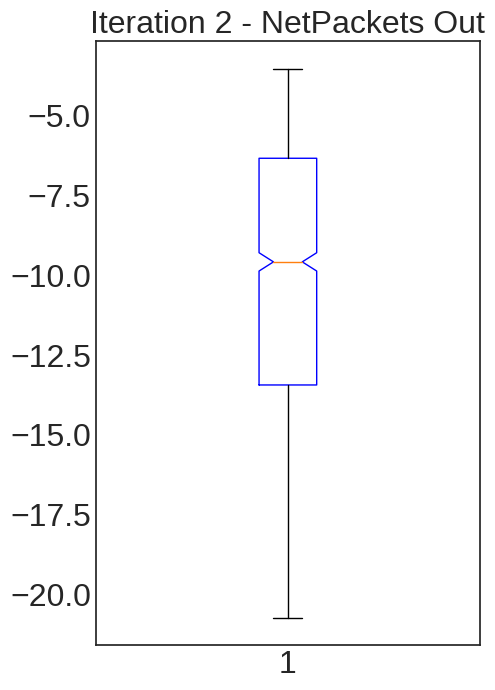

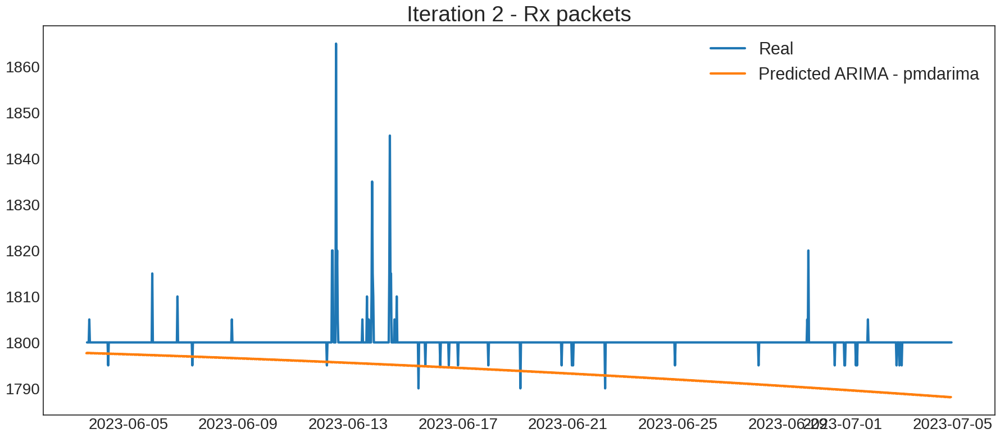

Training ARIMA... for Tx packets


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


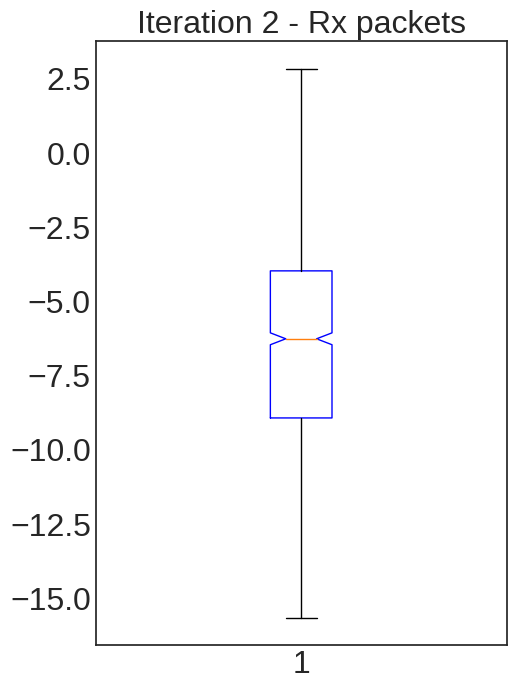

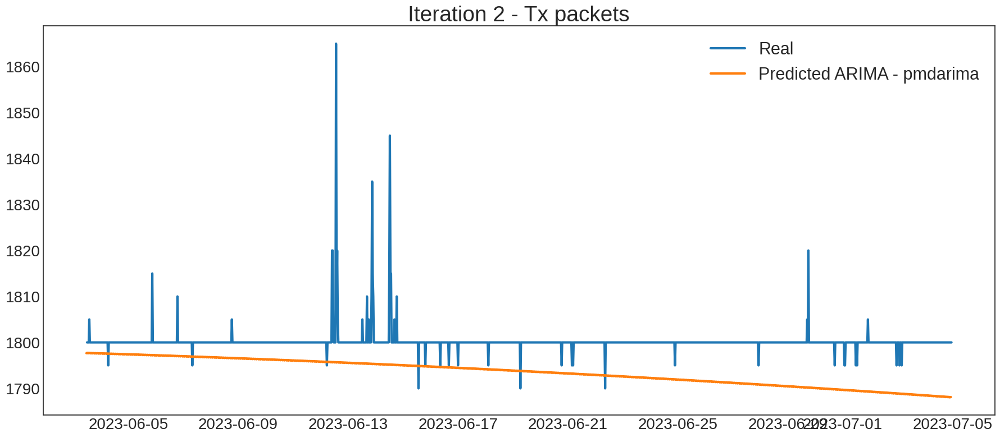

Training ARIMA... for CPU percent


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)


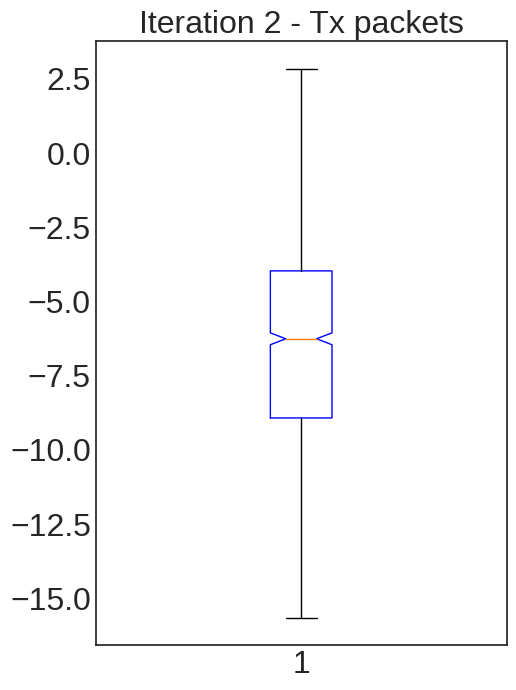

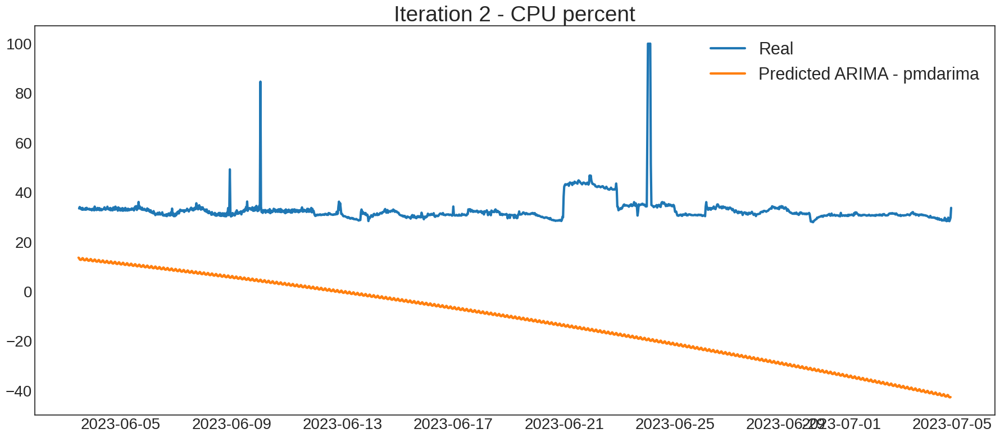

Training ARIMA... for Memory Used percent


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


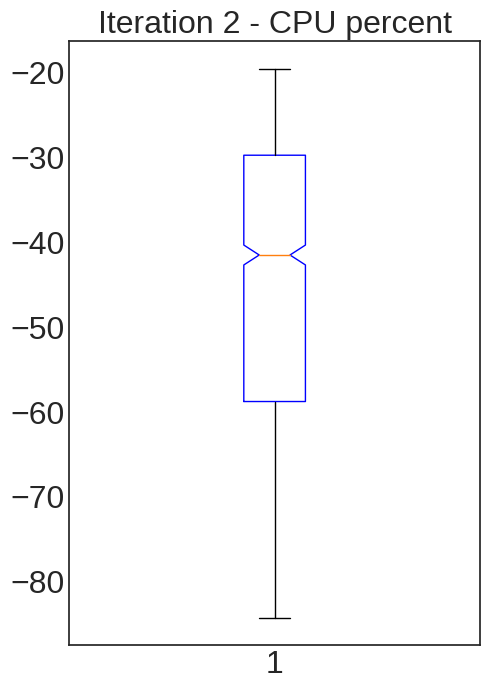

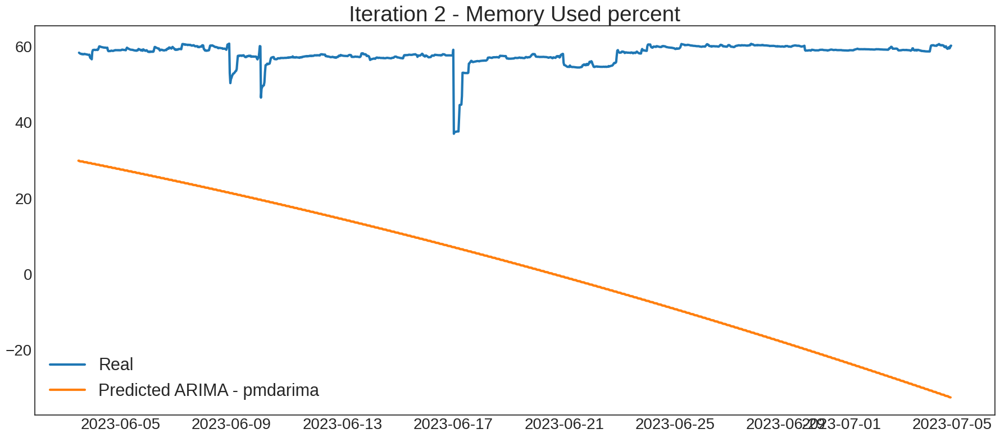

Training ARIMA... for Disk Used percent


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)


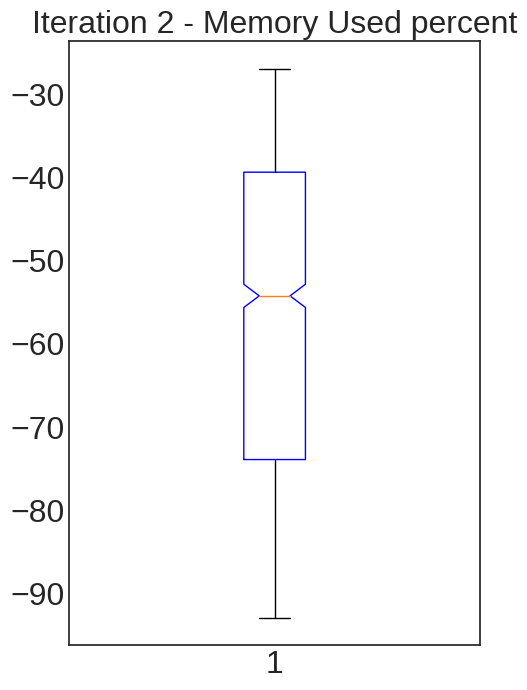

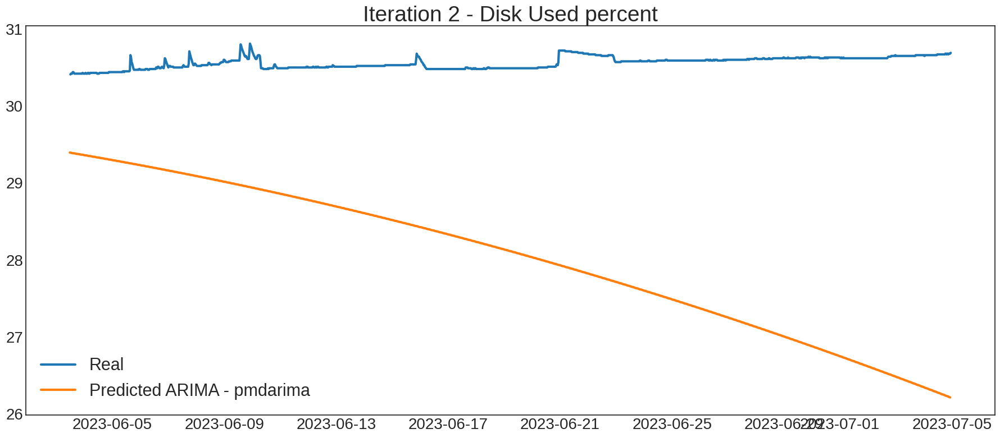

Training ARIMA... for Uptime


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 30T will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood opt

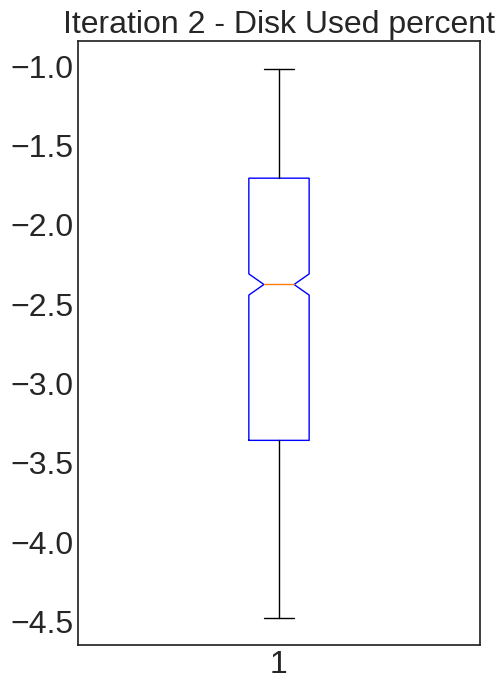

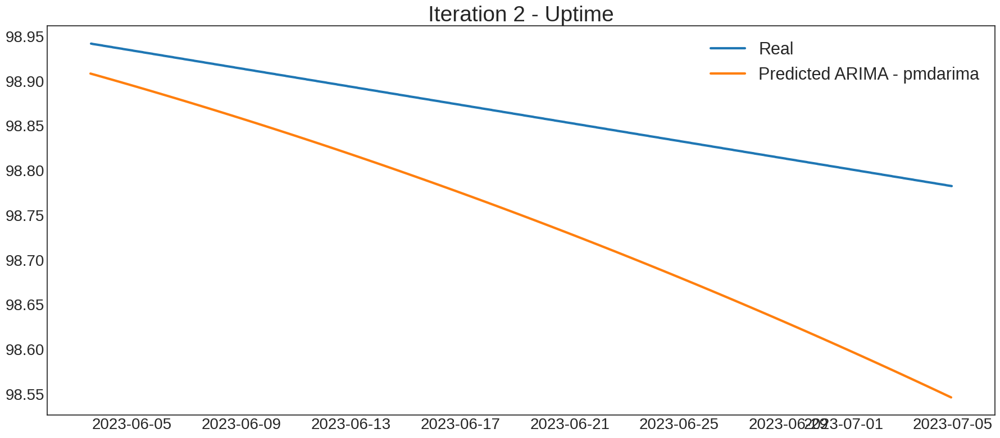

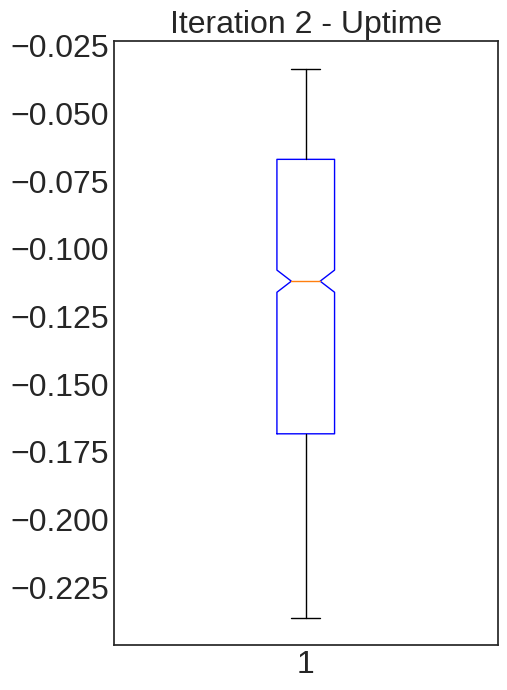

In [52]:
# from time import time

index = 0

dict_variables = {}

dict_variables_results = {}

for i, col in enumerate(df.columns):
  dict_variables_results[col] = {
      "rmse": 0,
      "mae": 0,
      "mape": 0,
  }


for jp in range(1):

  for (x_tr_s, y_tr_s), (x_vl_s, y_vl_s), (x_ts_s, y_ts_s) in zip(tr_s_ds.values(), vl_s_ds.values(), ts_s_ds.values()):

    print('--' * 20)
    print(f'Training ARIMA... for {col} {x_tr_s[:,:,i].shape} ---- {tr.index[:-1].shape}')
    print('--' * 20)

    scaler = scalers[index]
    tr_cut_date, vl_cut_date, ts_cut_date = cut_dates[index]

    tr, vl, ts = datasets[index]
    x_ts, y_true = ts_datasets[index]

    for i, col in enumerate(df.columns):
      start = time()

      print(f'Training ARIMA... for {col}')

      #modelo.summary()

      modelo = ARIMA(order=(1, 1, 1), seasonal_order=(1, 1, 1, 7))
      modelo.fit(y=pd.DataFrame(x_tr_s[:,:,i], index=tr.index[:-1])) # tomo hasta la penultima fecha

      #predicciones_pdmarima = modelo.predict(len(x_vl_s.shape[0]) + len(x_ts_s.shape[0]))

      predicciones_pdmarima = modelo.predict(len(vl) + len(ts))
      predicciones_pdmarima.name = 'predicciones_pdmarima'
      pred_arima = pd.DataFrame(predicciones_pdmarima[predicciones_pdmarima.index > str(vl_cut_date)])

      plt.figure(figsize=(18, 15))
      plt.subplot(2, 1, 1)

      scaled_predicted = scaler[i].inverse_transform(pred_arima.values)

      finish = time() - start

      # pd.DataFrame({'predict': scaler[i].inverse_transform(pred_arima.values).squeeze(), 'real': ts[[col]].values.squeeze()}, index=ts.index).to_csv('result')

      plt.plot(ts.index[:-1], ts[[col]][:-1], label='Real', linewidth=line_width)
      plt.plot(pred_arima.index, scaled_predicted, label='Predicted ARIMA - pmdarima', linewidth=line_width)
      plt.title(f'Iteration {index} - {col}', fontdict={'fontsize': 28})
      plt.legend(fontsize=22)

      plt.xticks(fontsize=20) # aumento de datos
      plt.yticks(fontsize=20)

      plt.grid(False)
      plt.savefig(f'{data_path}/Arima/test_result/Iteration-{index}_{cut_col_name(col)}_test_result.jpg')
      plt.tight_layout()
      plt.show()

      mae = MeanAbsoluteError()
      mape = MeanAbsolutePercentageError()

      mae.update_state(y_true[:, :, i], scaled_predicted)
      mape.update_state(y_true[:, :, i], scaled_predicted)

      i2, b2 = scaled_predicted.shape

      with open(f'{data_path}/Arima/metrics_result/{jp}_Iteration_{index}_results_ts.txt', 'a') as file:
      # with open(f'./AutoArima-fold_{index}_results_ts.txt', 'a') as file:
        file.write(f'VARIABLE ==> [{col}]\n')
        file.write(f'RMSE -> {round(root_mean_squared_error(y_true[:, :, i], scaled_predicted).numpy(), 3)} \n')
        file.write(f'MAE ->  {round(mae.result().numpy(), 3)} \n')
        file.write(f'MAPE -> { round(mape.result().numpy(), 3)} \n')
        file.write(f'SW statistic: -> {shapiro(abs(scaled_predicted.reshape(i2, b2))).statistic} \n')
        file.write(f'TRAIN TIME -> {round(finish, 3)} \n')

      dict_variables_results[col]['rmse'] = dict_variables_results[col]['rmse'] + round(root_mean_squared_error(y_true[:, :, i], scaled_predicted).numpy(), 3)
      dict_variables_results[col]['mae'] = dict_variables_results[col]['mae'] + round(mae.result().numpy(), 3)
      dict_variables_results[col]['mape'] = dict_variables_results[col]['mape'] + round(mape.result().numpy(), 3)

      fig, axe = plt.subplots(figsize=(5, 7))
      box = axe.boxplot(scaled_predicted - ts[[col]][:-1], notch=True, vert=True, autorange=True, sym="")
      for box in box['boxes']:
        box.set_color('b')
        axe.set_title(f'Iteration {index} - {col}', fontsize=23)
        axe.tick_params(labelsize=23)
        plt.tight_layout()
        plt.savefig(f'{data_path}/Arima/test_result/Iteration-{index}_{cut_col_name(col)}_test_result_box_plot.jpg')

    index += 1

    plt.show()
    # break


  for col in df.columns:
    with open(f'{data_path}/Arima/metrics_result/Iterations_results_summary.txt', 'a') as file:
      file.write(f'VARIABLE ==> [{col}]\n')
      file.write(f'RMSE -> {dict_variables_results[col]["rmse"]} \n')
      file.write(f'MAE -> {dict_variables_results[col]["mae"]} \n')
      file.write(f'MAPE -> {dict_variables_results[col]["mape"]} \n')

#AUTO ARIMA Model Building

----------------------------------------
Training ARIMA... for Uptime (1208, 1) ---- (3627,)
----------------------------------------
Training ARIMA... for Free Memory
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=-819.853, Time=8.31 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=154.434, Time=0.18 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-2931.056, Time=3.56 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-1537.581, Time=1.79 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2378.815, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-2933.016, Time=0.25 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=-2931.047, Time=1.42 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=8.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=-2957.450, Time=0.69 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=-2955.571, Time=5.36 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=-2955.563, Time=2.13 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Tim

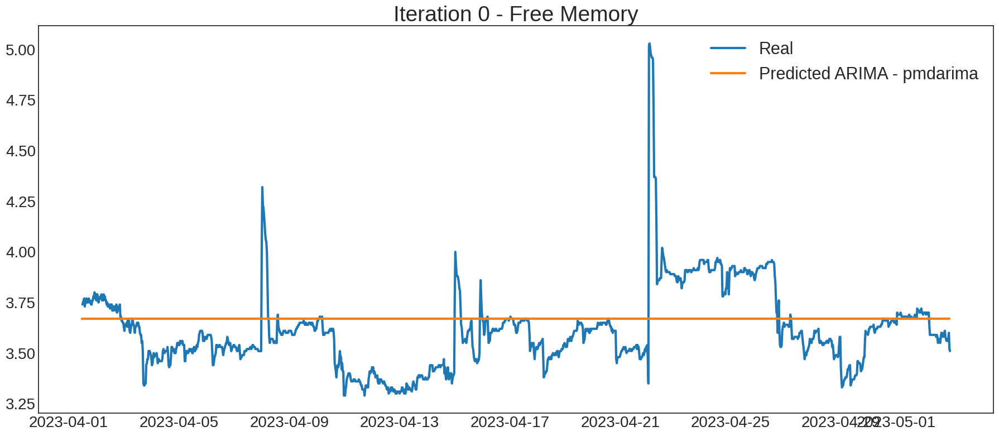

Training ARIMA... for Used Memory
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=-819.741, Time=7.24 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=154.718, Time=0.19 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-2930.954, Time=4.59 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-1538.663, Time=1.80 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2376.440, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-2932.897, Time=0.17 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=-2930.945, Time=3.42 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=6.86 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=-2957.757, Time=0.26 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=-2955.910, Time=5.07 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=-2955.902, Time=5.56 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=5.04 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=-2985.705, Time=0.50 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=-2983.702, T

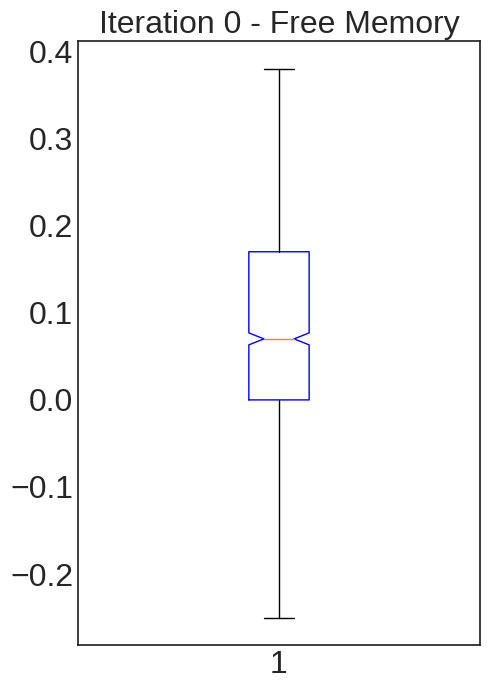

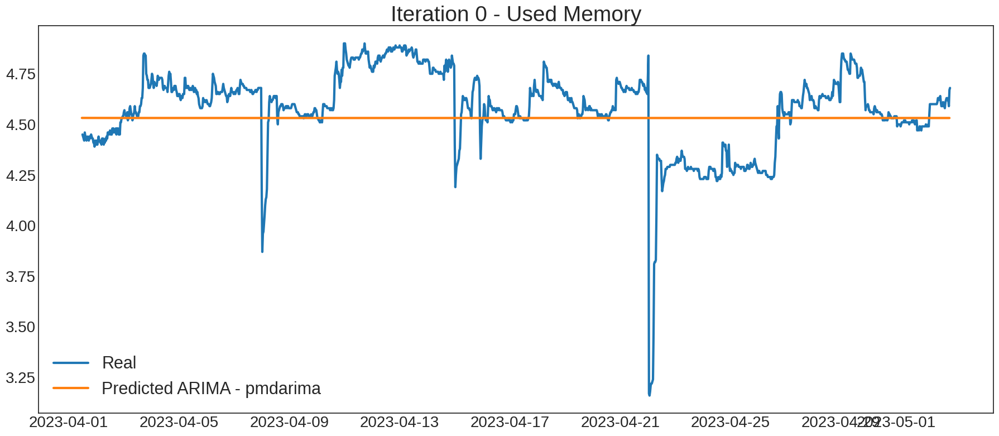

Training ARIMA... for Free Disk
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=-5388.095, Time=1.42 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-5367.626, Time=0.18 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-5385.196, Time=1.50 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-5388.166, Time=2.66 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-5366.317, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-5378.123, Time=0.65 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=-5416.818, Time=10.83 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=-5390.058, Time=1.41 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=14.70 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=-5408.020, Time=16.09 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=-5392.932, Time=6.64 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=-5395.689, Time=7.25 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=inf, Time=18.26 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, T

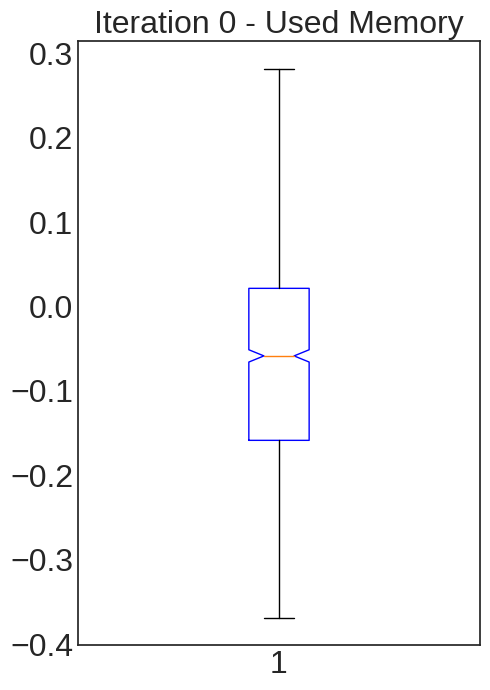

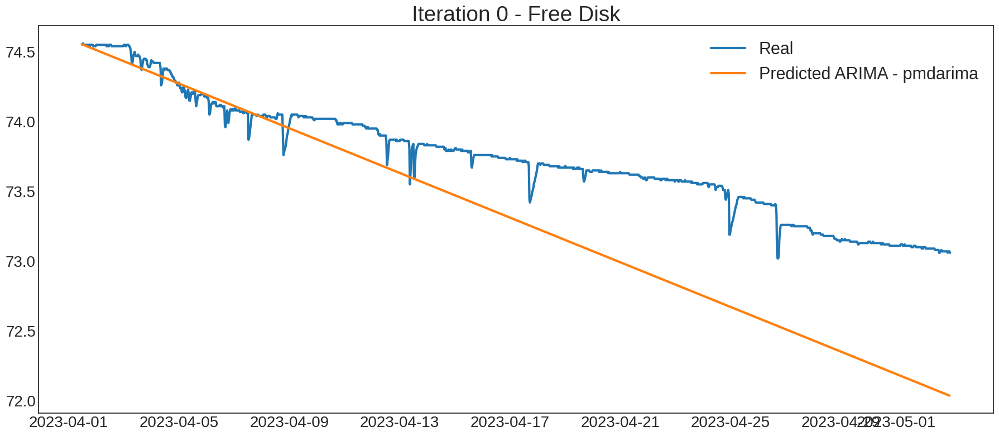

Training ARIMA... for Used Disk
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=8.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-5365.990, Time=0.17 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-5378.425, Time=1.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-5379.995, Time=3.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-5364.750, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-5372.137, Time=0.71 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=10.79 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=-5382.419, Time=7.20 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=18.30 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=-5376.022, Time=10.76 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=-5386.934, Time=17.38 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=-5385.228, Time=5.06 sec
 ARIMA(1,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=19.86 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=-5381.925, Time=7

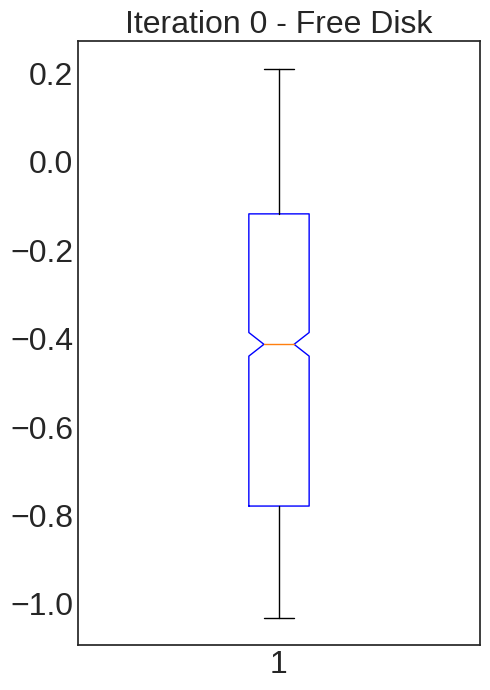

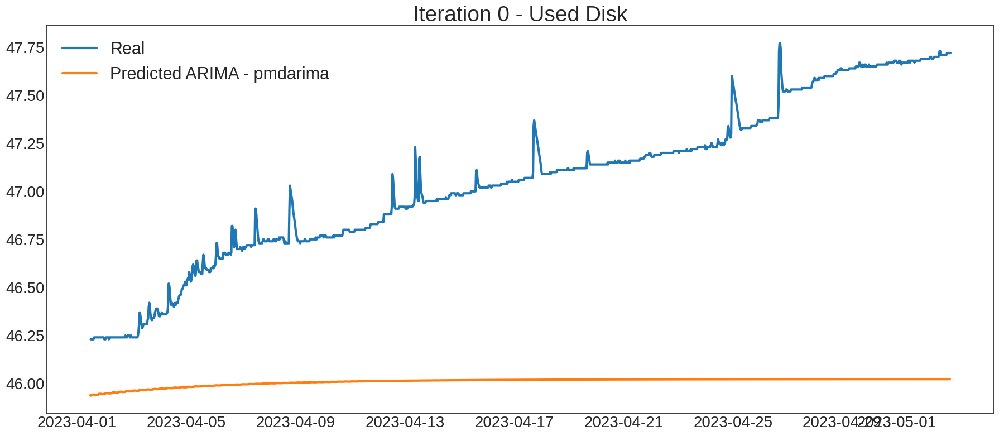

Training ARIMA... for Disk read/s
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=6.95 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-296.501, Time=0.37 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-1624.962, Time=5.45 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-1201.204, Time=1.95 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3419.193, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-1626.958, Time=0.22 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=-1624.962, Time=2.04 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=8.77 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=-1670.539, Time=0.52 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=-1668.546, Time=5.39 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=-1668.546, Time=2.06 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=10.36 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=-1676.793, Time=0.78 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=-1674.801, Time

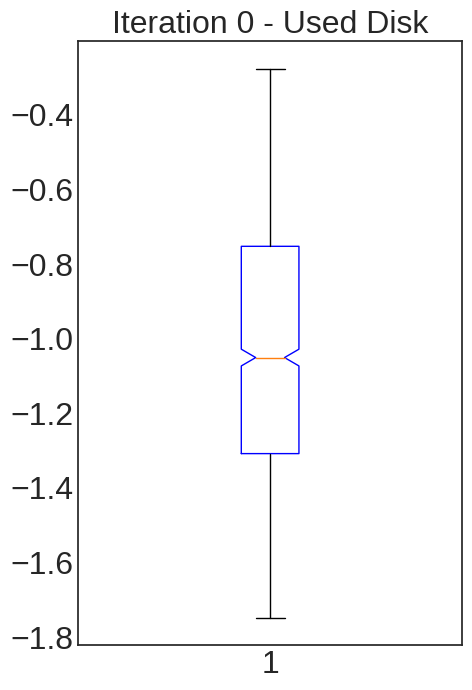

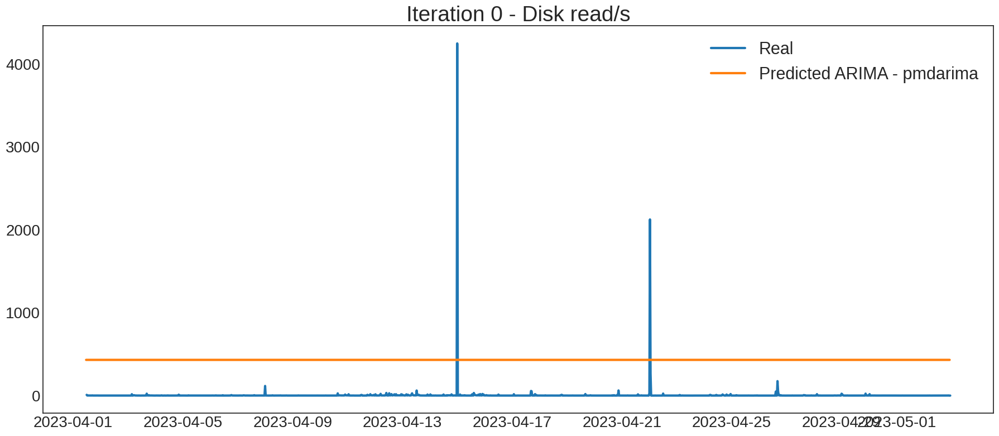

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)


Training ARIMA... for Disk write/s
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=-2723.514, Time=3.19 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-2611.034, Time=0.23 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-2588.514, Time=9.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-2737.579, Time=2.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3183.836, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=-2684.029, Time=0.53 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=-2741.858, Time=5.42 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=-2586.321, Time=7.59 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=-2754.716, Time=15.80 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=-2522.067, Time=14.40 sec
 ARIMA(0,0,1)(2,0,2)[12] intercept   : AIC=-2759.195, Time=21.32 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=inf, Time=19.27 sec
 ARIMA(0,0,0)(2,0,2)[12] intercept   : AIC=-2726.712, Time=15.94 sec
 ARIMA(1,0,1)(2,0,2)[12] intercept   : A

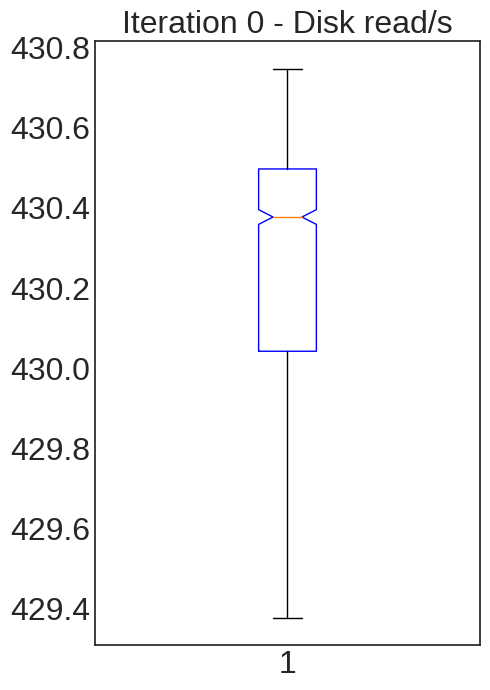

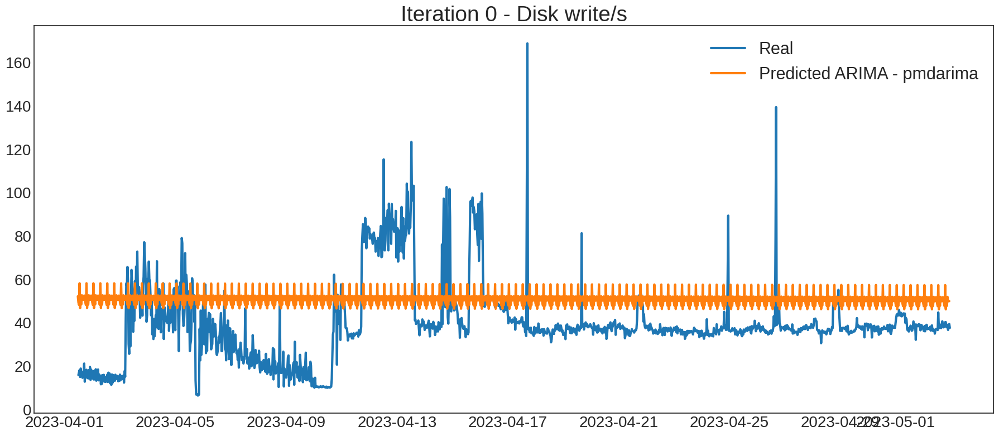

Training ARIMA... for NetBytes In
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=4.01 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-2793.601, Time=0.19 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-2099.007, Time=5.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-2789.623, Time=2.74 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3427.152, Time=0.14 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=-2503.121, Time=6.22 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=-2791.612, Time=0.83 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-2791.612, Time=0.21 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=-2791.612, Time=0.40 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=-2789.612, Time=0.21 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 20.057 seconds


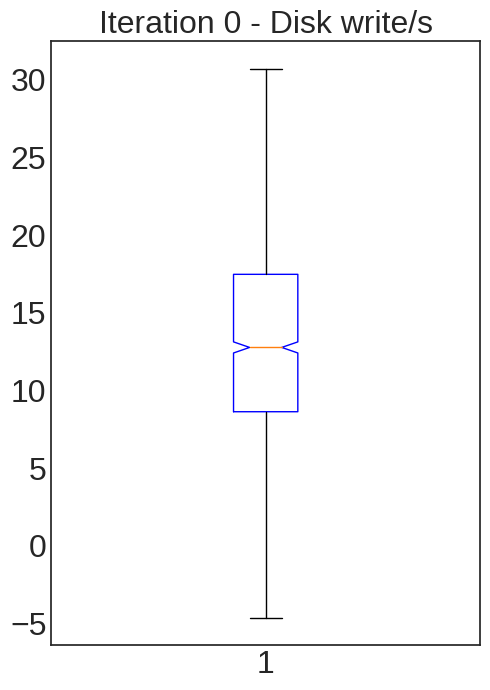

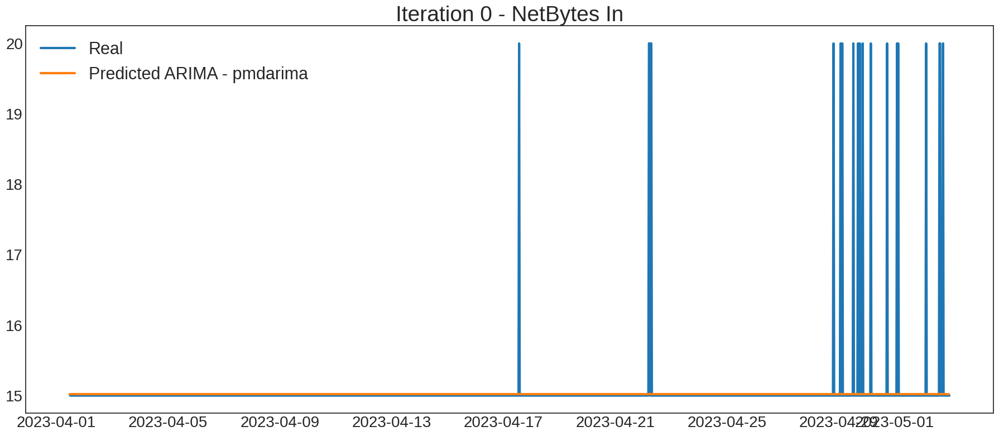

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)


Training ARIMA... for NetBytes Out
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=3.96 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-2793.601, Time=0.18 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-2099.007, Time=8.80 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-2789.623, Time=1.55 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3427.152, Time=0.10 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=-2503.121, Time=3.48 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=-2791.612, Time=0.84 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-2791.612, Time=0.21 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=-2791.612, Time=0.46 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=-2789.612, Time=0.22 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 19.853 seconds


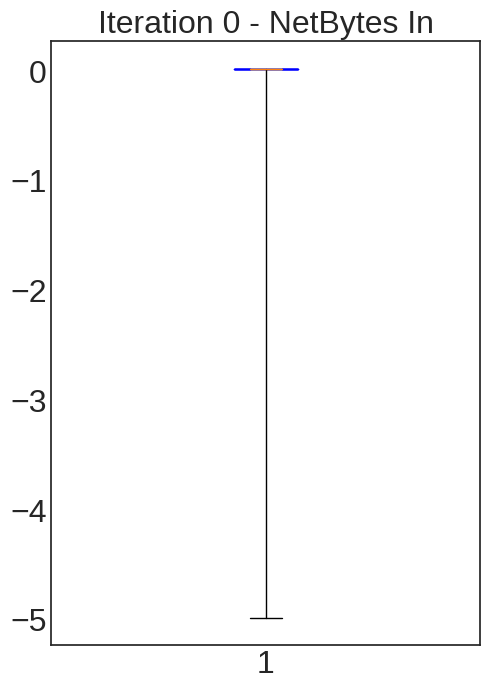

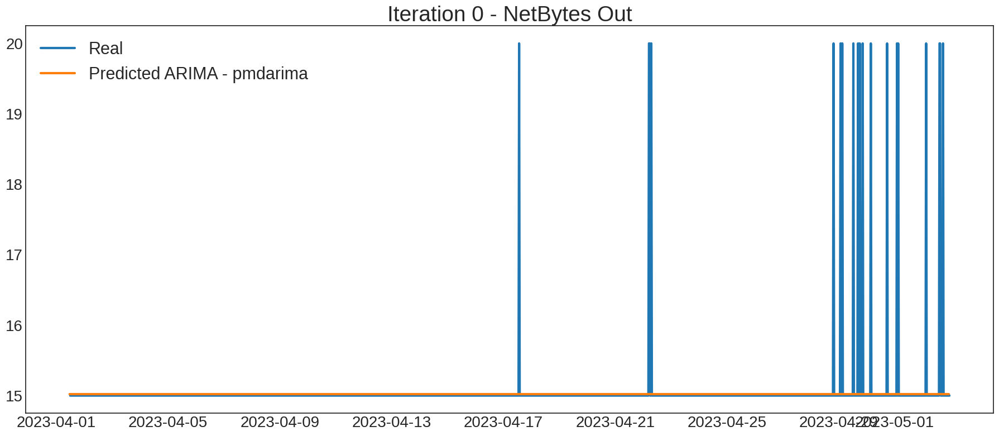

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)


Training ARIMA... for NetPackets In
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=6.99 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-2793.601, Time=0.20 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-2099.007, Time=5.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-2789.623, Time=1.56 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3427.152, Time=0.10 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=-2503.121, Time=7.43 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=-2791.612, Time=0.83 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-2791.612, Time=0.24 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=-2791.612, Time=0.41 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=-2789.612, Time=0.25 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 23.160 seconds


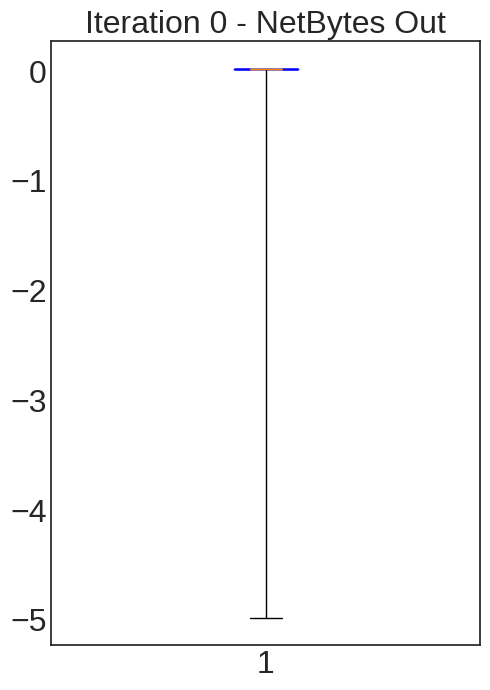

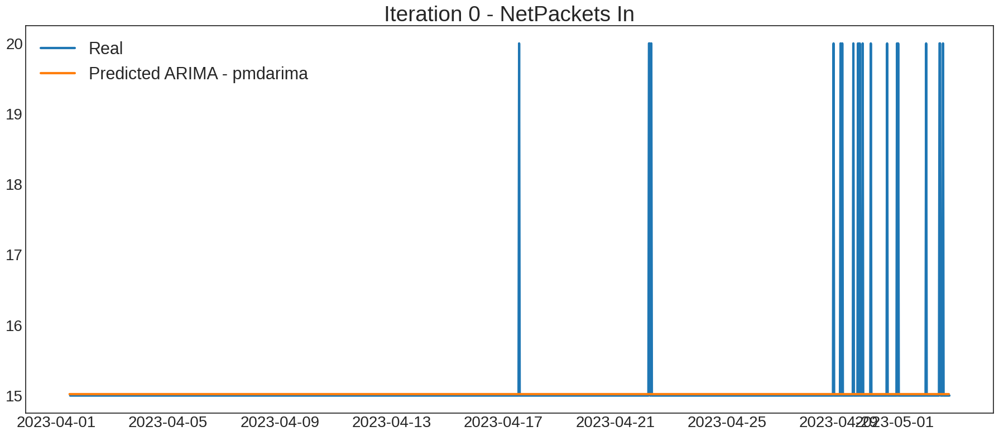

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)


Training ARIMA... for NetPackets Out
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=3.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-2793.601, Time=0.18 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-2099.007, Time=8.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-2789.623, Time=1.56 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3427.152, Time=0.10 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=-2503.121, Time=3.57 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=-2791.612, Time=0.80 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-2791.612, Time=0.21 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=-2791.612, Time=0.43 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=-2789.612, Time=0.27 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 19.378 seconds


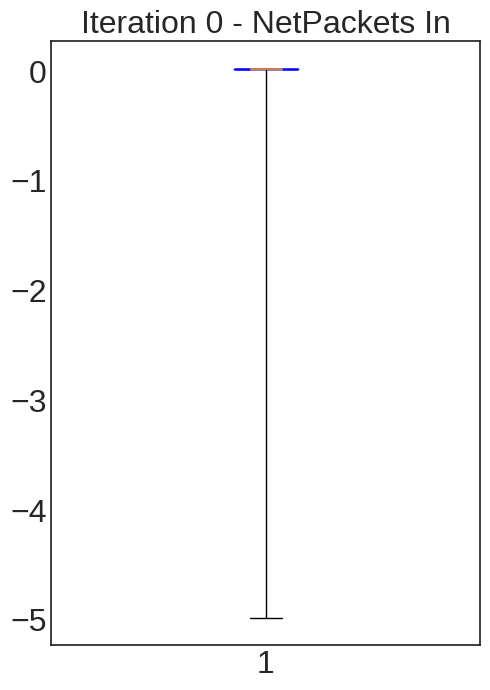

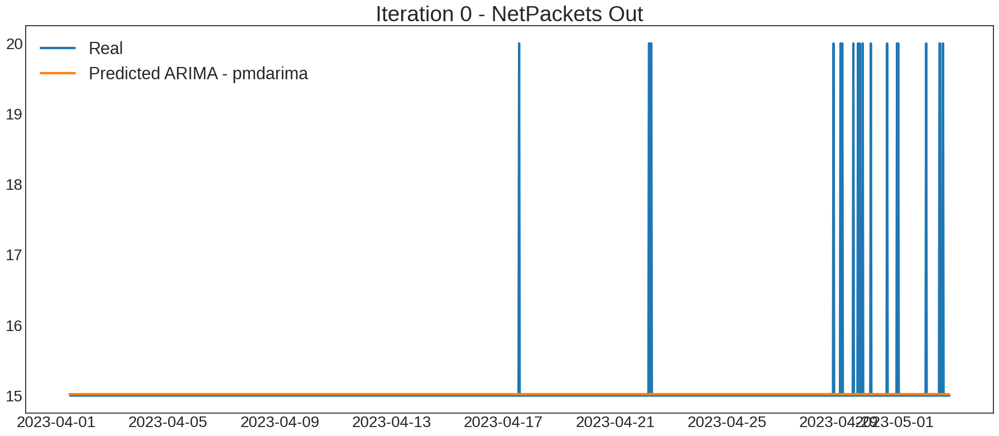

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)


Training ARIMA... for Rx packets
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=6.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-209.810, Time=0.16 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-206.204, Time=3.48 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-206.189, Time=1.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3430.155, Time=0.04 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=-208.002, Time=2.06 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=-207.984, Time=0.60 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-208.001, Time=0.26 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=-208.006, Time=0.31 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=-205.991, Time=0.33 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 15.267 seconds


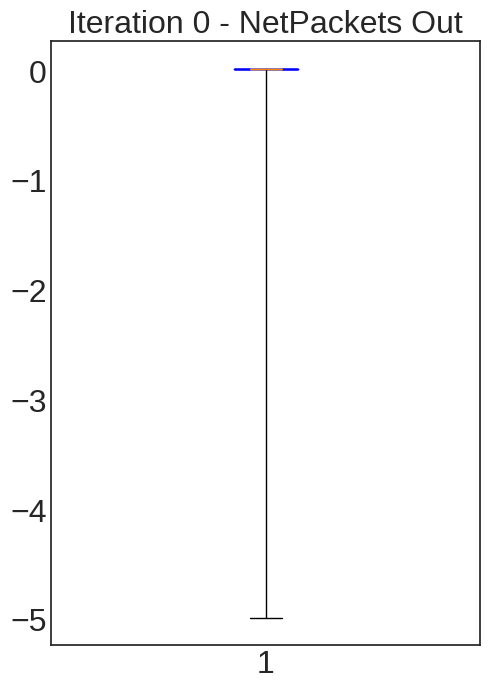

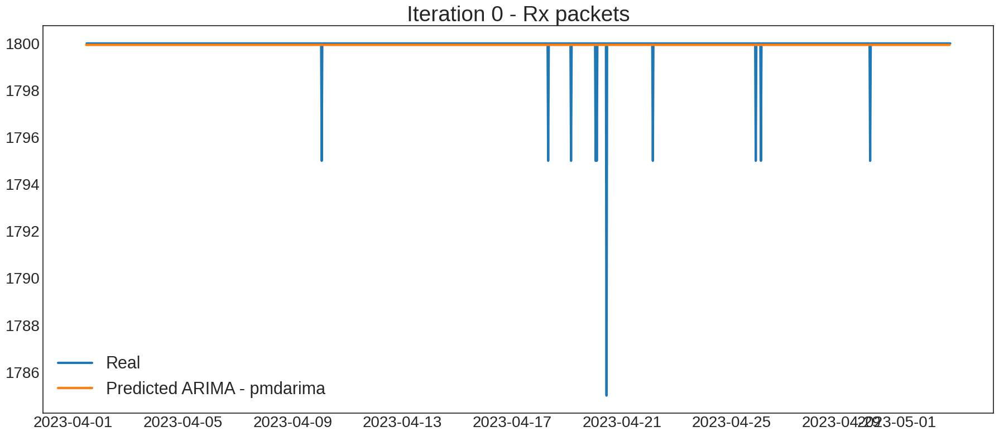

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)


Training ARIMA... for Tx packets
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=6.53 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-209.810, Time=0.17 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-206.204, Time=3.45 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-206.189, Time=1.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3430.155, Time=0.04 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=-208.002, Time=2.01 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=-207.984, Time=0.54 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-208.001, Time=0.27 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=-208.006, Time=0.29 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=-205.991, Time=0.32 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 14.837 seconds


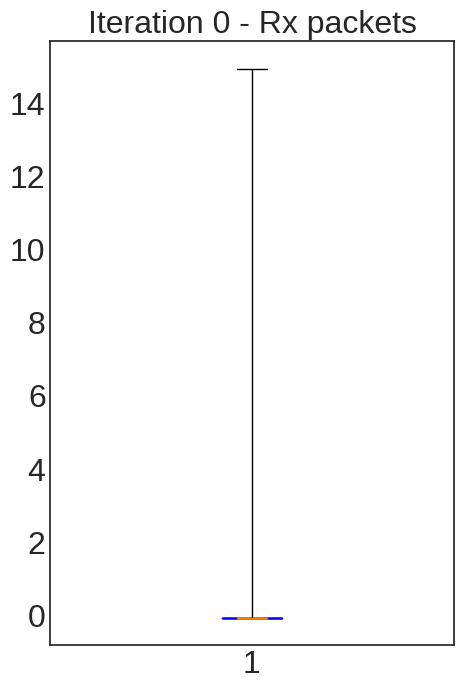

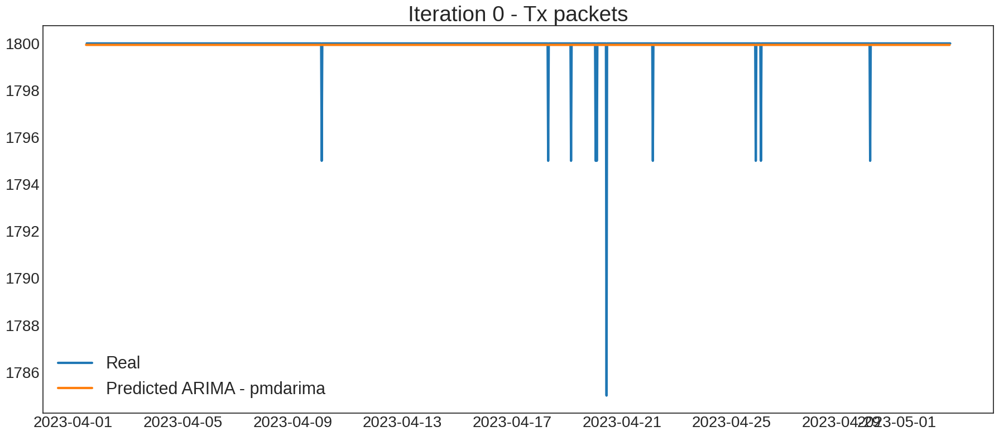

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)


Training ARIMA... for CPU percent
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=-181.962, Time=7.43 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-176.793, Time=0.21 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-1583.819, Time=3.98 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-1109.216, Time=1.62 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3038.344, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-1585.657, Time=0.22 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=-1583.816, Time=1.02 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=9.65 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=-1641.056, Time=0.65 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=-1639.352, Time=4.28 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=-1639.348, Time=4.46 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=9.07 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=-1649.307, Time=0.70 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=-1647.476, 

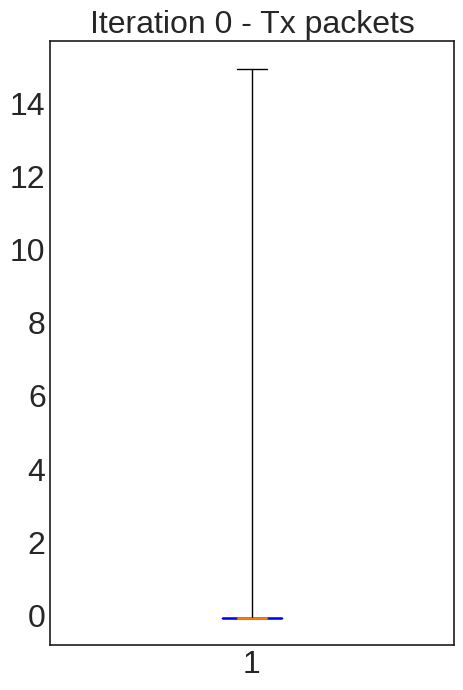

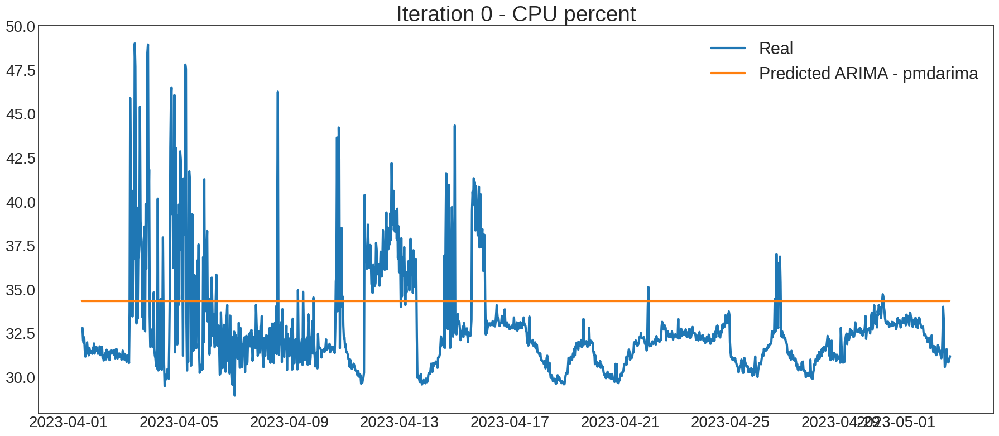

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)


Training ARIMA... for Memory Used percent
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=-821.603, Time=8.42 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=153.047, Time=0.25 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-2934.178, Time=3.65 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-1541.318, Time=1.88 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2371.072, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-2936.111, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=-2934.168, Time=3.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=5.17 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=-2960.540, Time=0.28 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=-2958.709, Time=5.56 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=-2958.703, Time=2.49 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=8.46 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=-2987.861, Time=0.57 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=-298

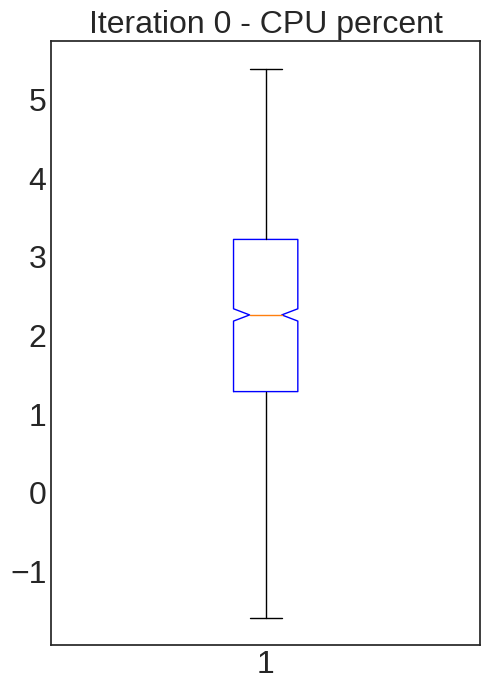

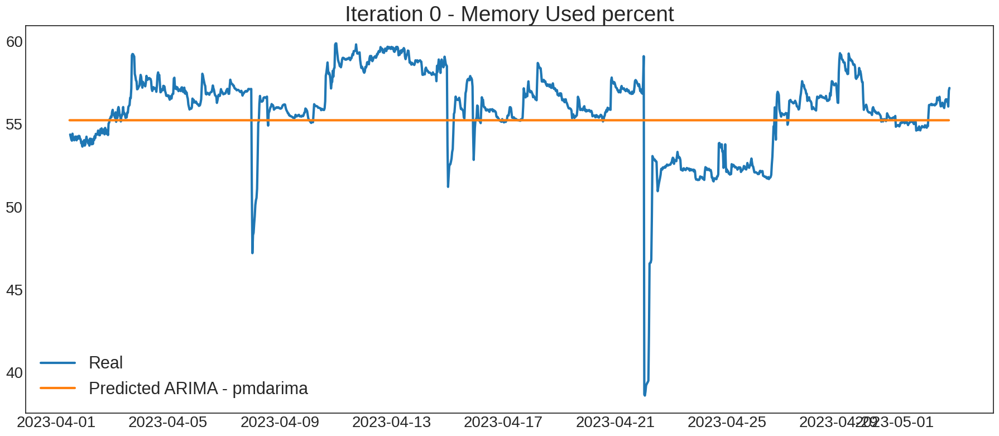

Training ARIMA... for Disk Used percent
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=-5370.100, Time=2.24 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-5355.203, Time=0.18 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-5368.074, Time=1.41 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-5370.228, Time=6.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-5353.959, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-5362.146, Time=0.66 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=5.36 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=-5371.820, Time=11.63 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=-5396.273, Time=16.45 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=-5384.636, Time=17.05 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=14.88 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=inf, Time=11.06 sec
 ARIMA(1,1,1)(1,0,2)[12] intercept   : AIC=-5387.825, Time=20.10 sec
 ARIMA(0,1,2)(1,0,2)[12] intercept   : AIC=-5

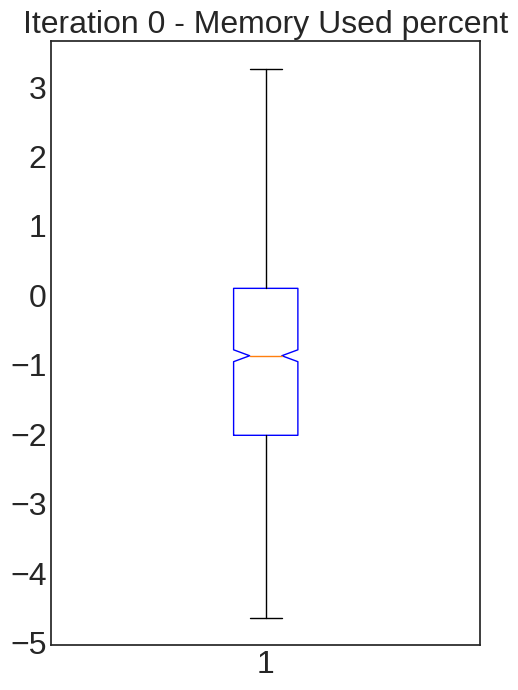

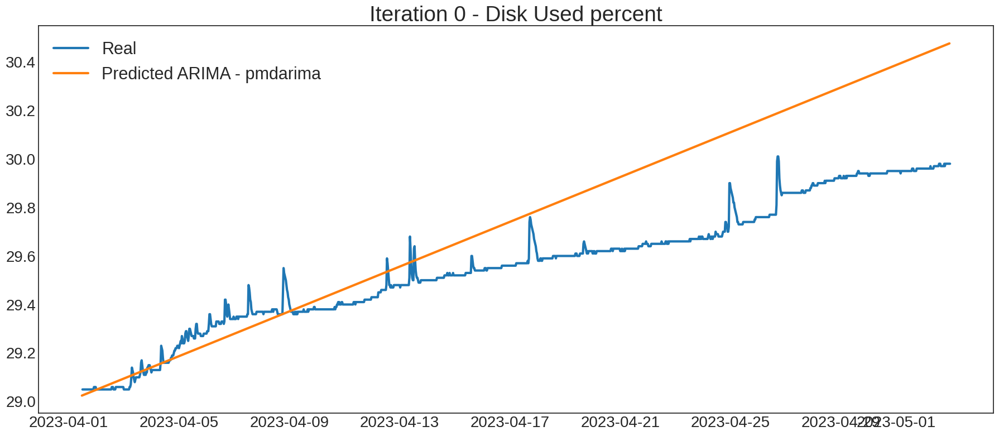

Training ARIMA... for Uptime
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=3.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=2106.864, Time=0.17 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=1.56 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=8.04 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2104.864, Time=0.09 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=2.48 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=1.80 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=inf, Time=1.29 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=-12016.781, Time=2.11 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=-14541.912, Time=11.15 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=12.000, Time=3.60 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=3.97 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=-12076.540, Time=8.14 sec
 ARIMA(1,0,1)(2,0,1)[12] 

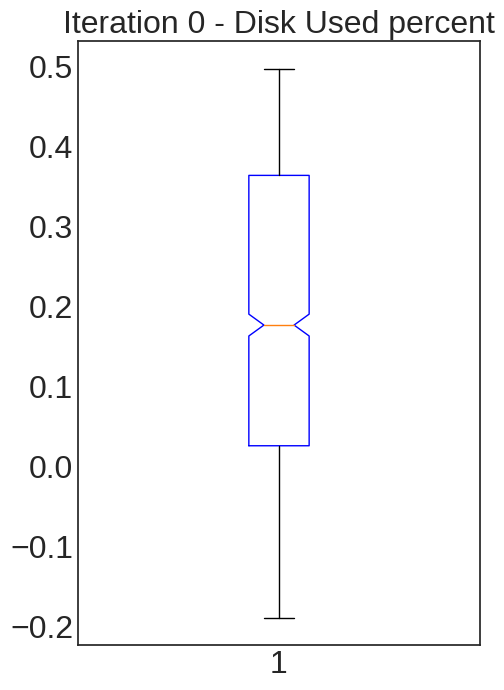

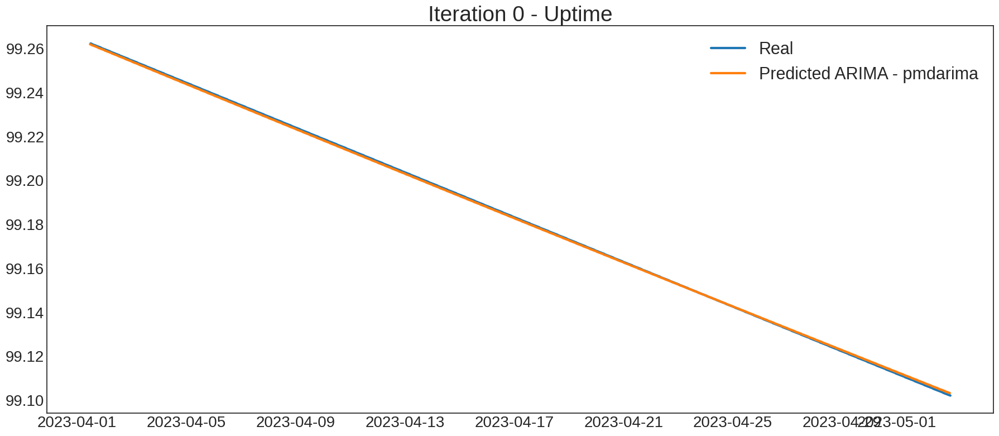

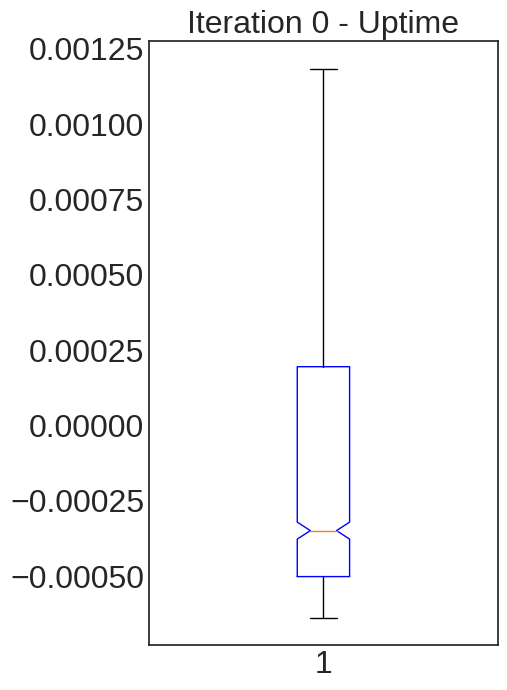

----------------------------------------
Training ARIMA... for Uptime (2418, 1) ---- (1208,)
----------------------------------------
Training ARIMA... for Free Memory
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=-2268.188, Time=12.05 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-340.100, Time=0.32 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-6889.068, Time=11.51 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-3797.743, Time=3.75 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=5140.763, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-6890.911, Time=0.21 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=-6889.068, Time=2.80 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=9.35 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=-6967.427, Time=2.06 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=-6966.827, Time=15.18 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=-6966.891, Time=12.46 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=in

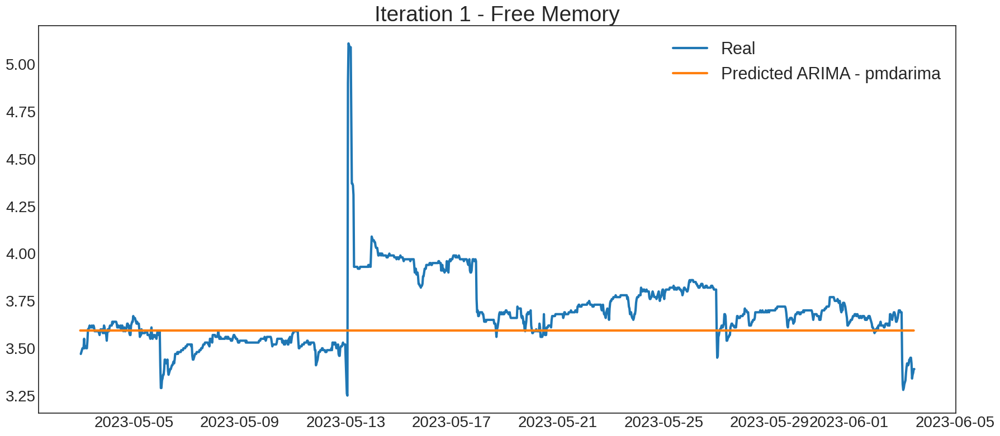

Training ARIMA... for Used Memory
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=-2268.465, Time=11.30 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-339.457, Time=0.31 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-6888.330, Time=12.30 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-3800.138, Time=7.91 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=5136.165, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-6890.136, Time=0.19 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=-6888.330, Time=3.01 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=12.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=-6966.818, Time=0.43 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=-6966.288, Time=14.45 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=-6966.362, Time=11.03 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=16.04 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=-7024.119, Time=0.62 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=-690

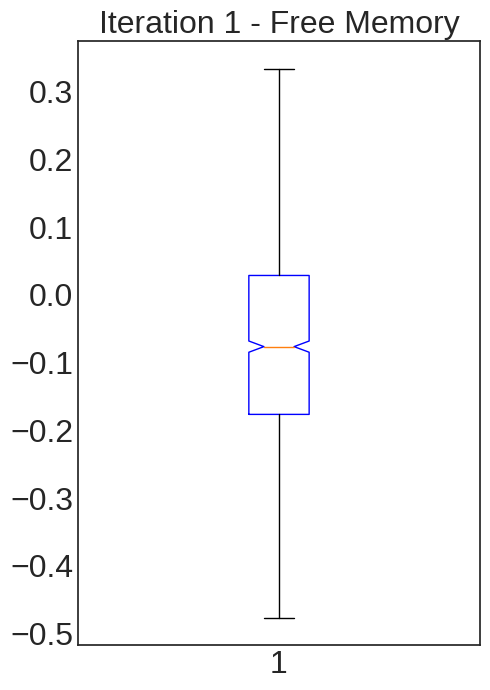

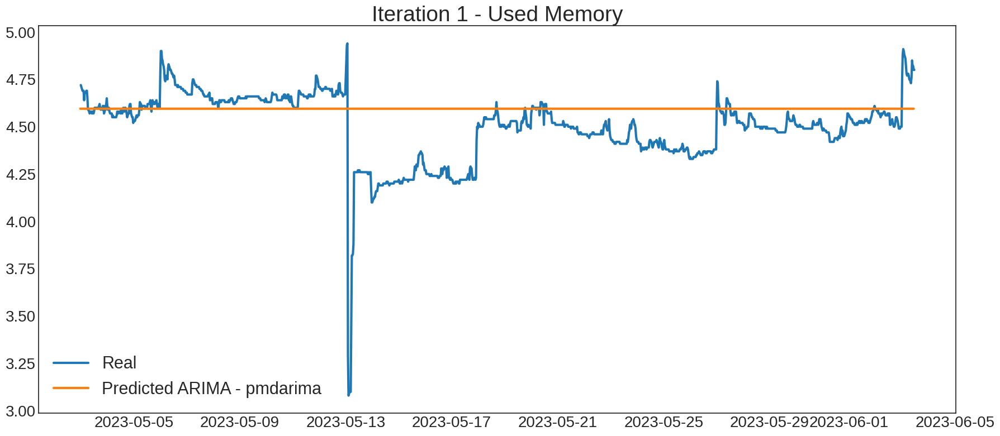

Training ARIMA... for Free Disk
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=-13745.813, Time=2.56 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-13735.090, Time=0.25 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13779.873, Time=8.41 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13798.344, Time=6.03 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-13730.268, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-13790.817, Time=1.47 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=-13803.856, Time=13.48 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=-13799.471, Time=2.77 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=-13808.735, Time=26.83 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=-13806.174, Time=14.83 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=inf, Time=35.85 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=-13808.688, Time=33.68 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=-13750.400, Time=17.24 sec
 ARIMA(1,1,1)(2,0,1)[12] inte

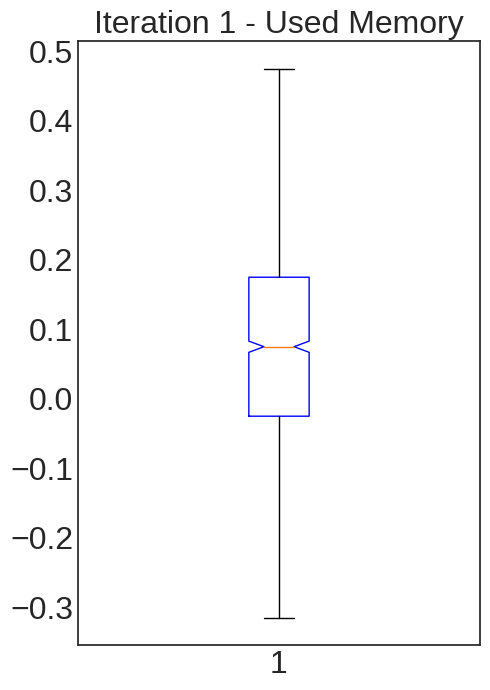

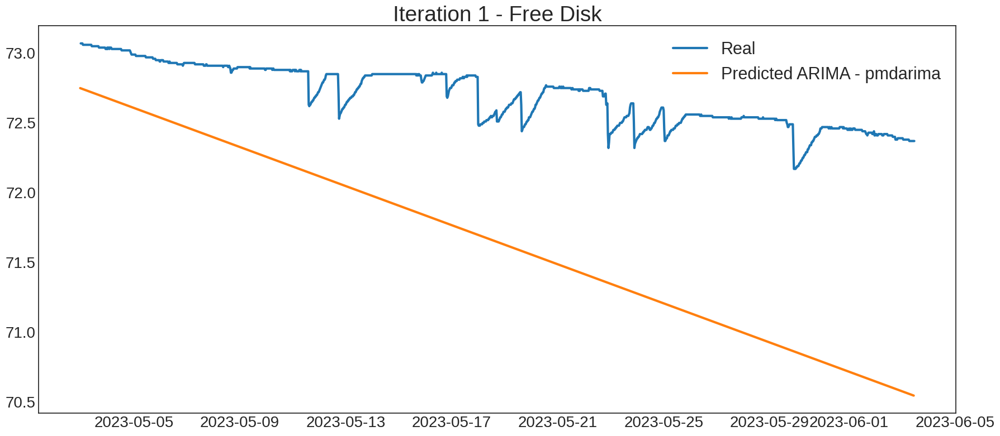

Training ARIMA... for Used Disk
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=-13759.193, Time=6.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-13748.500, Time=0.45 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13790.720, Time=3.74 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13807.376, Time=6.49 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-13743.719, Time=0.16 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-13800.942, Time=3.09 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=13.49 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=-13810.861, Time=22.34 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=-13815.024, Time=22.04 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=-13816.059, Time=22.25 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=-13815.341, Time=23.27 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=-13763.089, Time=18.62 sec
 ARIMA(1,1,1)(2,0,2)[12] intercept   : AIC=-13831.955, Time=40.48 sec
 ARIMA(1,1,1)(1,0,2)[12] int

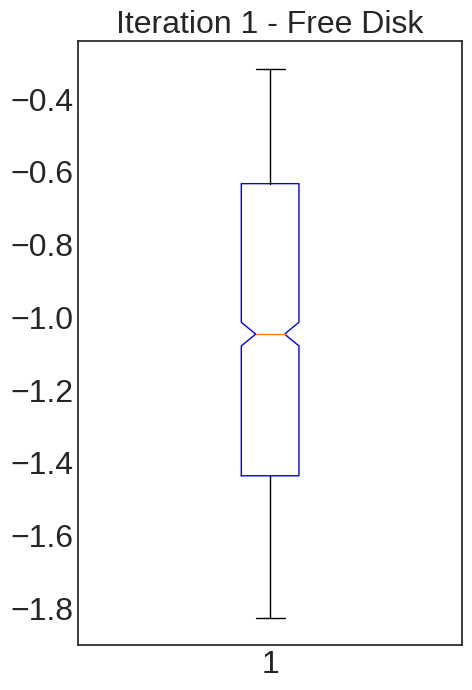

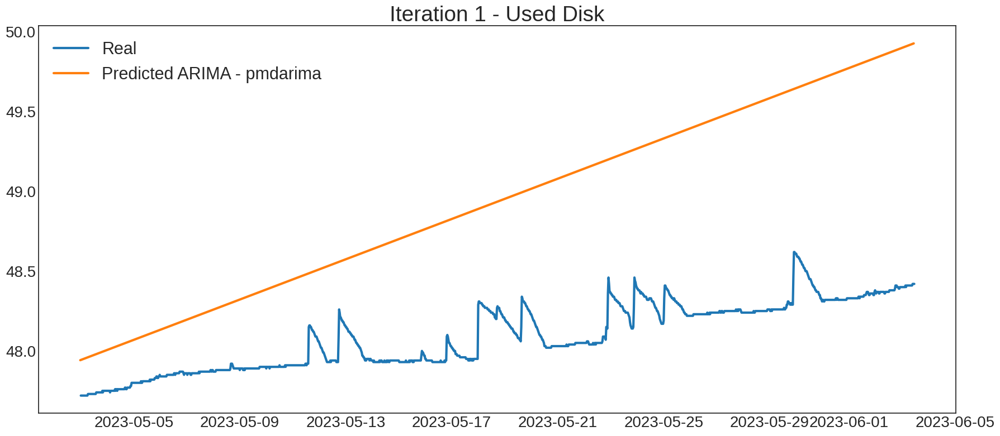

Training ARIMA... for Disk read/s
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=15.14 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-2252.521, Time=0.42 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-4921.405, Time=12.91 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-4061.175, Time=3.95 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=6852.251, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-4923.403, Time=0.19 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=-4921.405, Time=2.02 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=23.33 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=-5007.968, Time=0.70 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=-5005.857, Time=11.83 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=-5005.971, Time=4.48 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=13.79 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=-5022.057, Time=2.17 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=-5019.959,

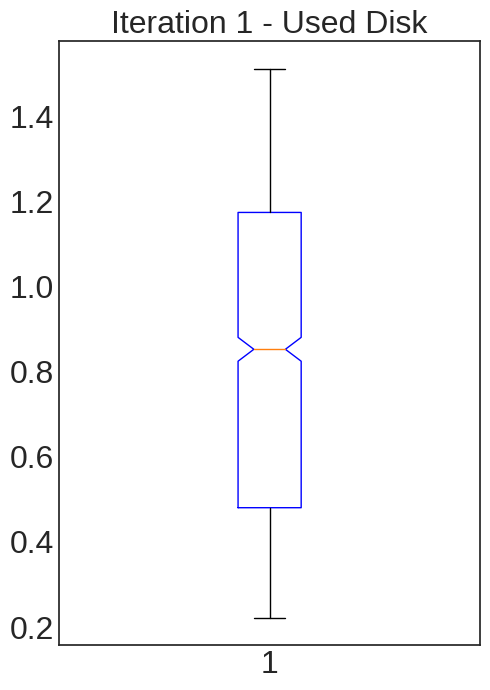

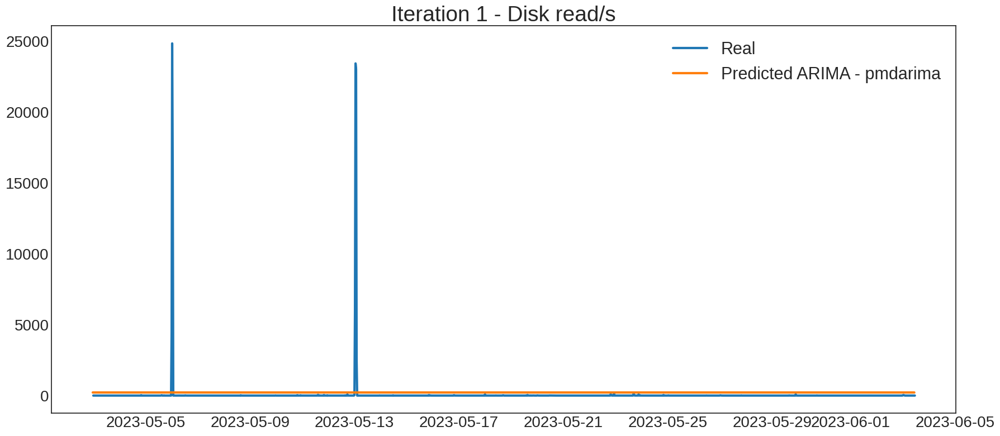

Training ARIMA... for Disk write/s
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=-6513.352, Time=12.05 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-6088.767, Time=0.38 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-6016.515, Time=11.72 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-6621.575, Time=4.74 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=6380.746, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=-6445.953, Time=0.75 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=-6698.365, Time=12.22 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=-6358.586, Time=9.96 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=-6692.924, Time=30.28 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=-6708.057, Time=34.13 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=-6697.213, Time=16.05 sec
 ARIMA(0,0,1)(2,0,2)[12] intercept   : AIC=-6665.685, Time=47.99 sec
 ARIMA(0,0,0)(1,0,2)[12] intercept   : AIC=-6500.192, Time=27.39 sec
 ARIMA(1,0,1)(1,0,2)[12] interc

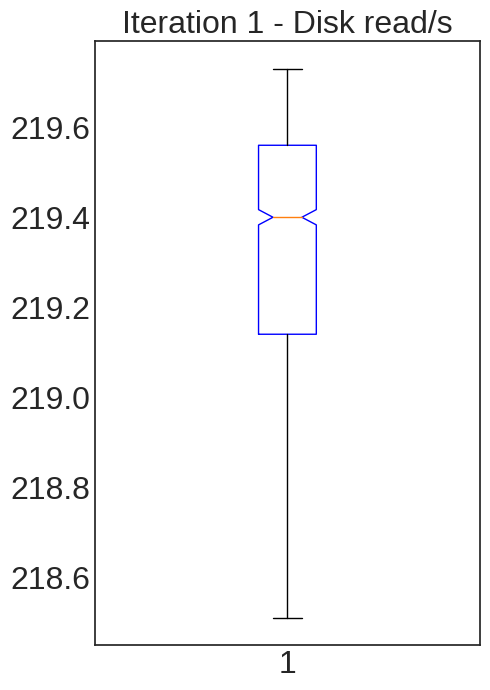

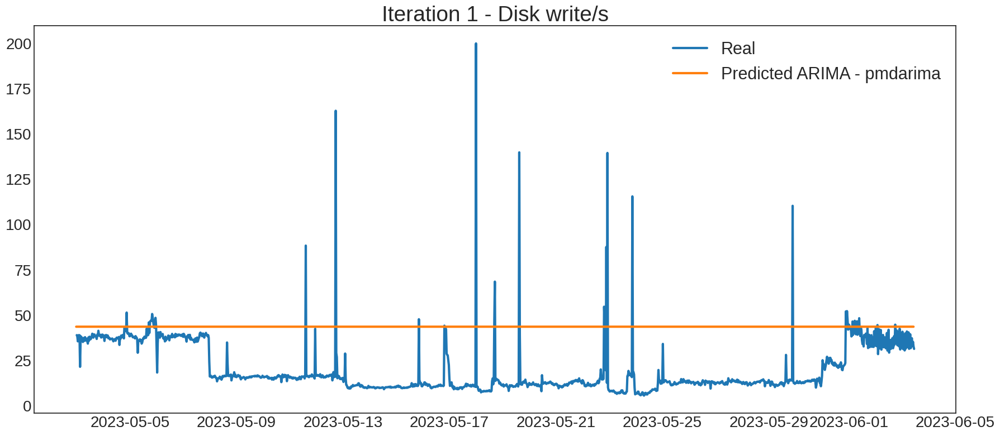

Training ARIMA... for NetBytes In
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=13.00 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-6948.331, Time=0.33 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-5736.929, Time=14.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-6944.348, Time=1.62 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=6859.983, Time=0.15 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=6.27 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=-6946.339, Time=4.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-6946.339, Time=0.40 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=-6946.331, Time=0.44 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=-6944.339, Time=0.85 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 41.330 seconds


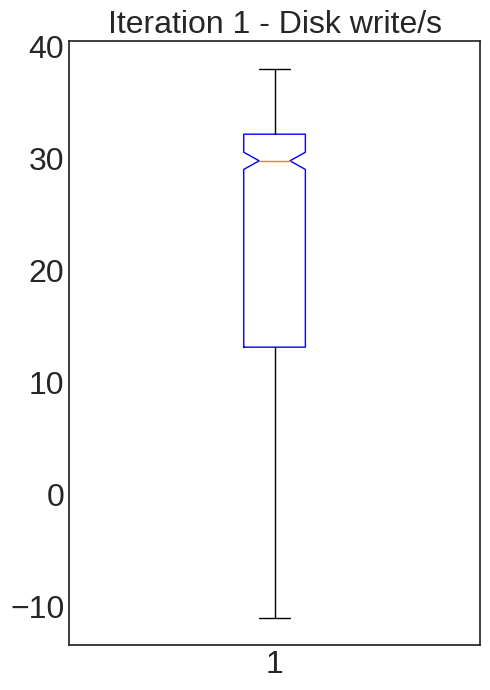

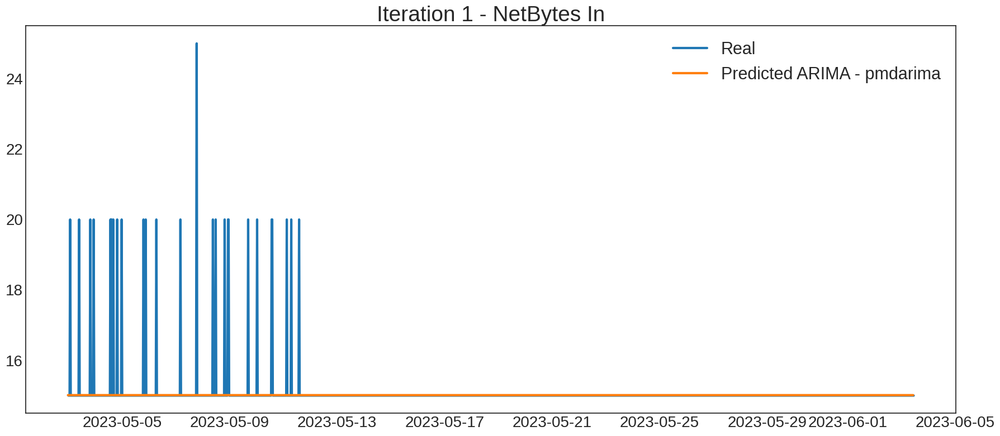

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)


Training ARIMA... for NetBytes Out
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=13.95 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-6948.331, Time=0.34 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-5736.929, Time=14.53 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-6944.348, Time=1.53 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=6859.983, Time=0.16 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=3.85 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=-6946.339, Time=4.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-6946.339, Time=0.73 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=-6946.331, Time=0.93 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=-6944.339, Time=2.74 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 42.882 seconds


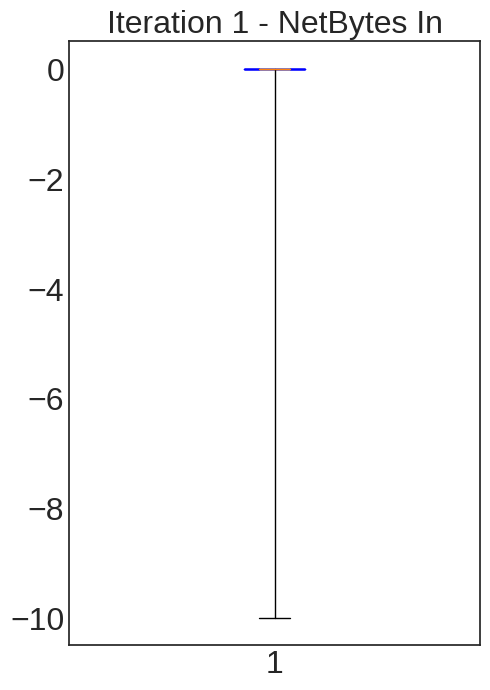

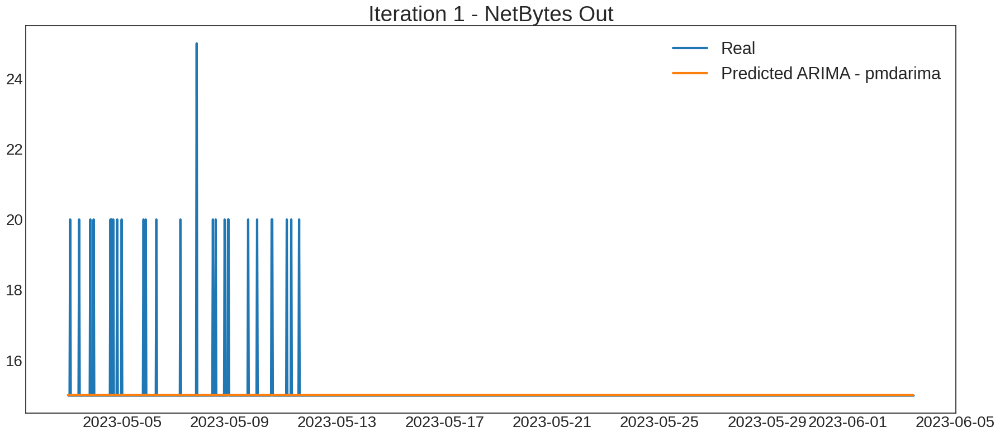

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)


Training ARIMA... for NetPackets In
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=13.58 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-6948.331, Time=0.53 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-5736.929, Time=11.31 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-6944.348, Time=3.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=6859.983, Time=0.25 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=5.23 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=-6946.339, Time=2.97 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-6946.339, Time=0.41 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=-6946.331, Time=0.47 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=-6944.339, Time=0.87 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 38.918 seconds


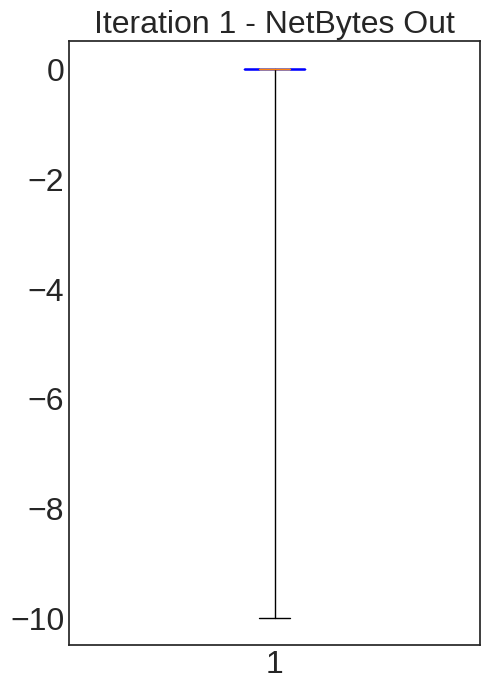

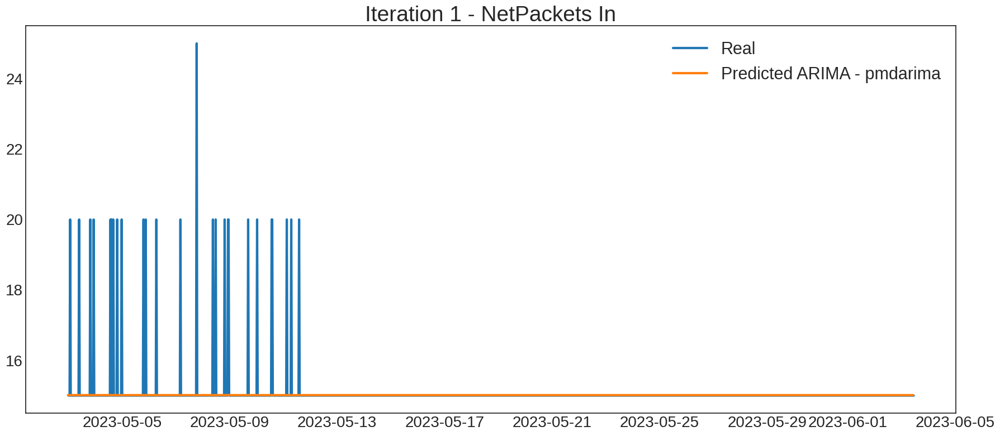

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)


Training ARIMA... for NetPackets Out
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=14.26 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-6948.331, Time=0.35 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-5736.929, Time=14.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-6944.348, Time=1.54 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=6859.983, Time=0.16 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=5.28 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=-6946.339, Time=5.13 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-6946.339, Time=0.42 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=-6946.331, Time=0.49 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=-6944.339, Time=0.95 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 42.916 seconds


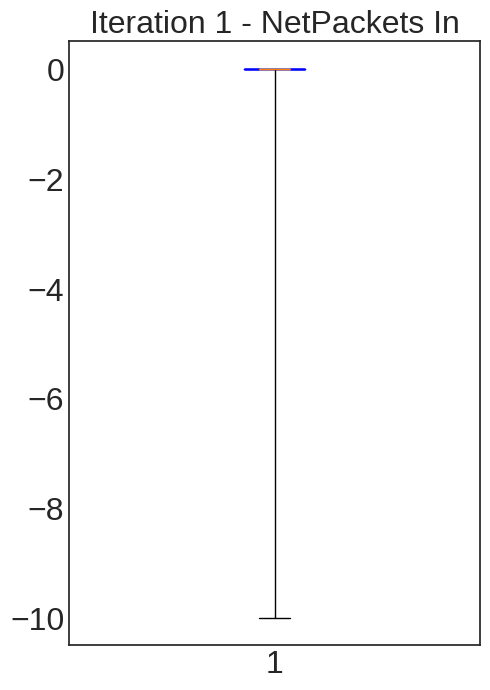

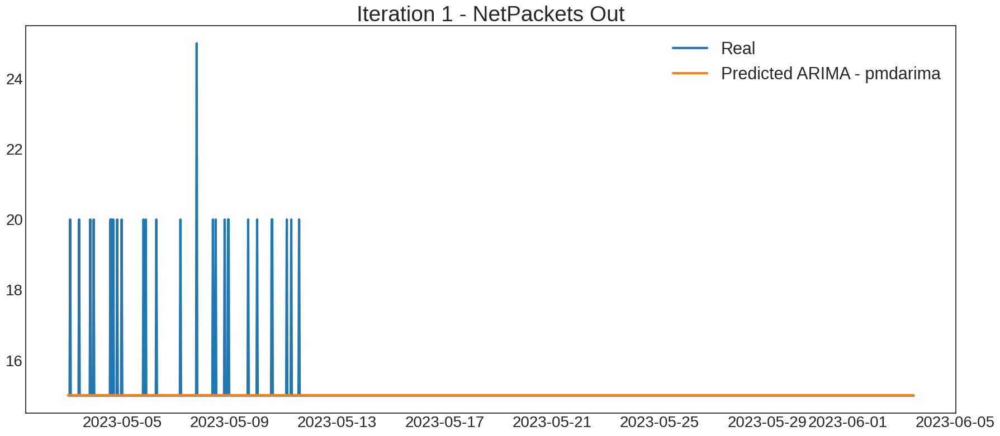

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)


Training ARIMA... for Rx packets
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=12.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-1167.817, Time=0.38 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-1164.233, Time=7.76 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-1164.204, Time=3.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=6863.987, Time=0.11 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=-1166.021, Time=8.89 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=-1166.007, Time=1.22 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-1166.020, Time=0.46 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=-1166.007, Time=0.57 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=-1163.982, Time=0.78 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 36.230 seconds


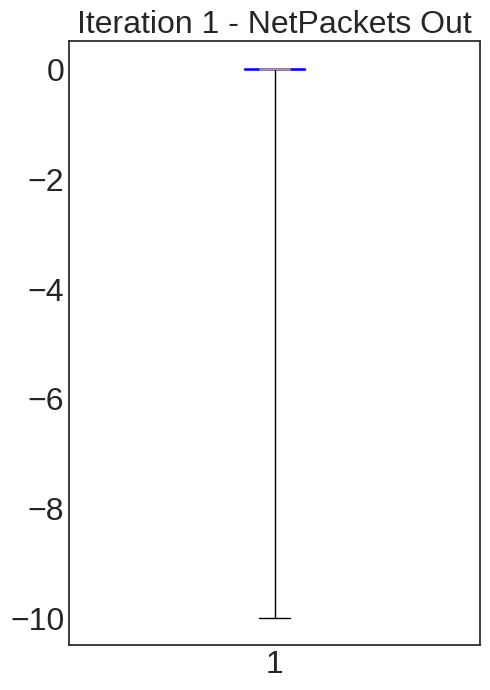

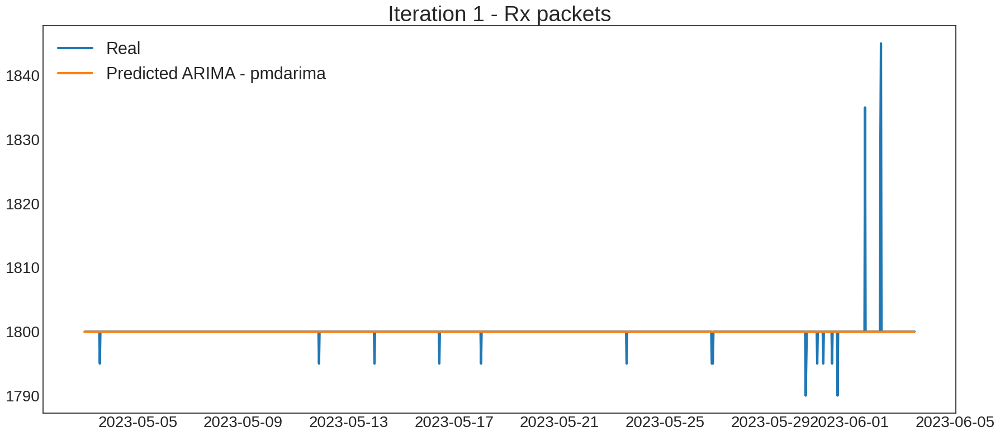

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)


Training ARIMA... for Tx packets
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=12.94 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-1167.817, Time=0.39 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-1164.233, Time=11.65 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-1164.204, Time=1.80 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=6863.987, Time=0.07 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=-1166.021, Time=7.39 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=-1166.007, Time=2.72 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-1166.020, Time=0.80 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=-1166.007, Time=2.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=-1163.982, Time=0.76 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 40.631 seconds


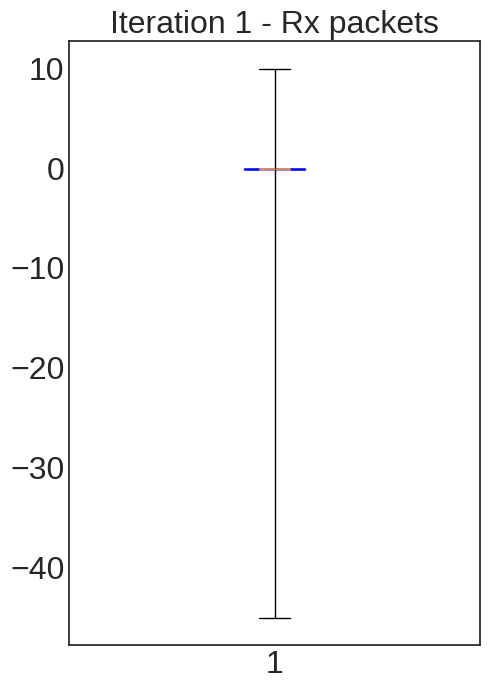

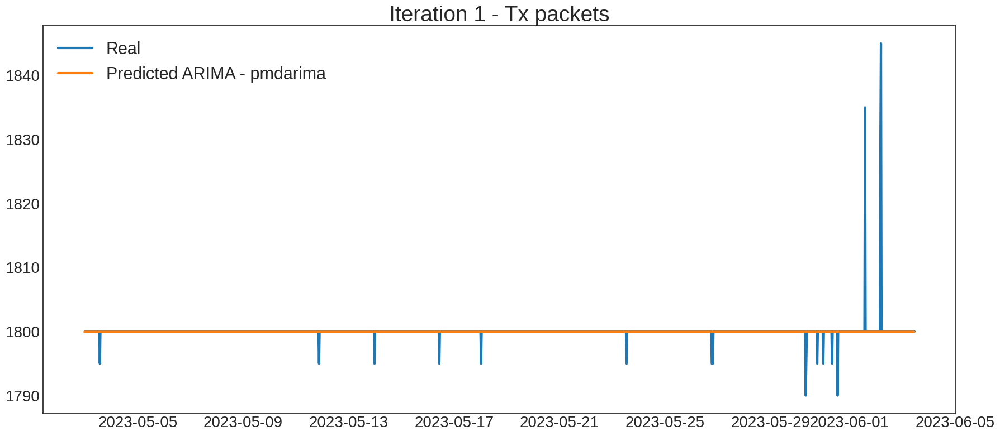

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)


Training ARIMA... for CPU percent
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=6.21 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-1710.679, Time=0.40 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-4406.346, Time=12.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-3443.903, Time=3.67 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=6088.082, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-4408.237, Time=0.23 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=-4406.344, Time=4.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=14.73 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=-4455.764, Time=2.83 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=-4454.126, Time=11.26 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=-4454.120, Time=8.96 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=20.36 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=-4465.520, Time=1.37 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=-4460.536, 

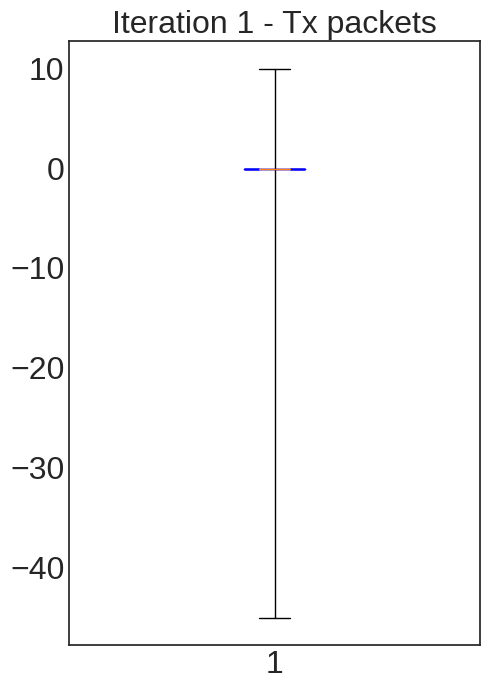

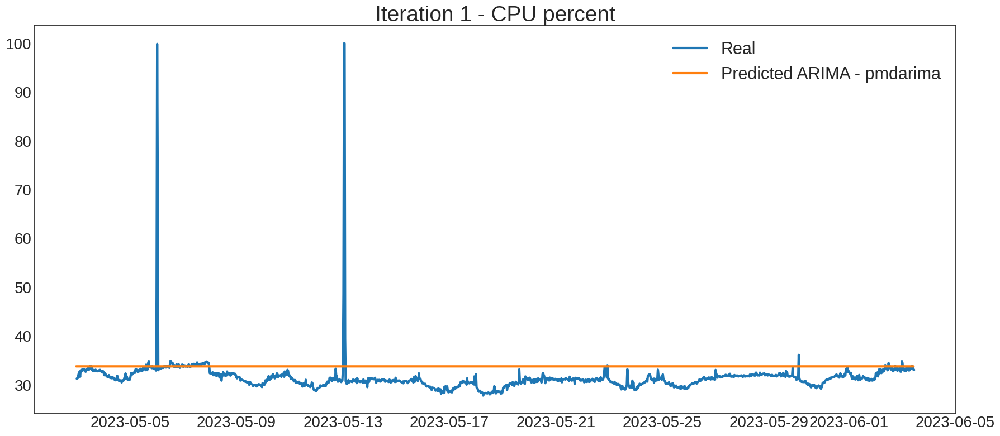

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)


Training ARIMA... for Memory Used percent
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=-2271.876, Time=12.45 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-343.638, Time=0.30 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-6897.863, Time=12.44 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-3806.937, Time=3.81 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=5125.762, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-6899.662, Time=0.19 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=-6897.864, Time=4.73 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=8.97 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=-6976.357, Time=0.45 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=-6935.805, Time=13.78 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=-6975.912, Time=4.75 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=13.42 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=-7032.116, Time=0.61 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AI

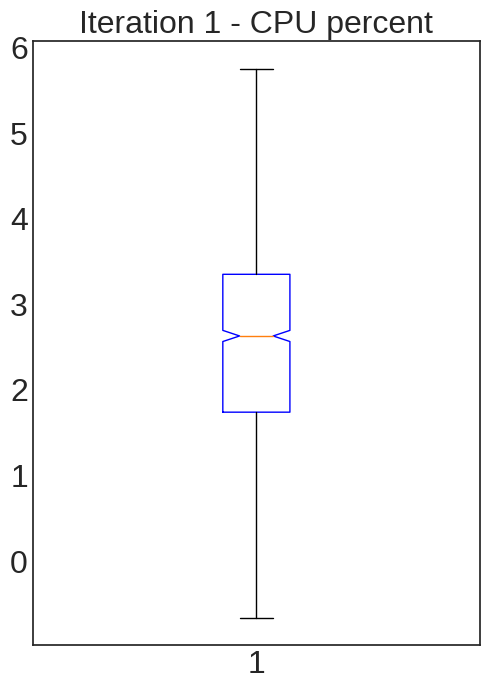

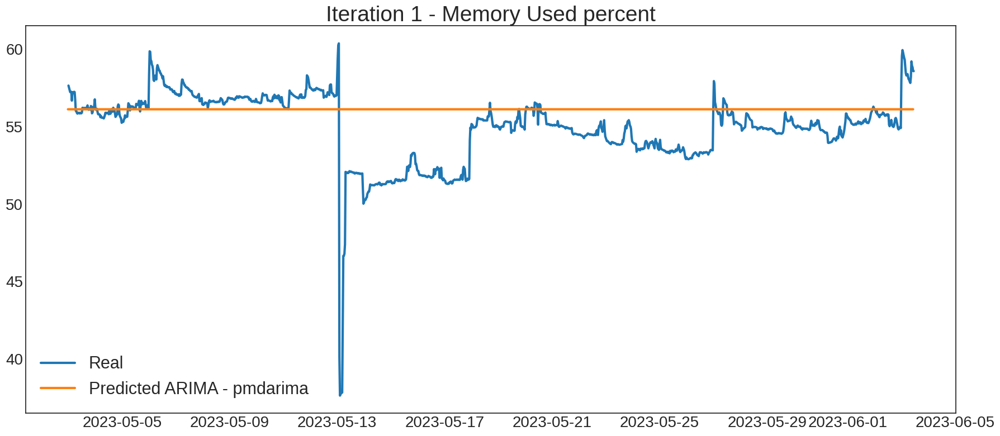

Training ARIMA... for Disk Used percent
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=-13688.714, Time=12.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-13680.458, Time=0.31 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13716.335, Time=3.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13729.993, Time=5.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-13675.836, Time=0.23 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-13723.327, Time=3.47 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=11.29 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=-13732.688, Time=29.33 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=-13735.681, Time=25.70 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=inf, Time=33.12 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=-13735.748, Time=13.84 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=-13734.162, Time=14.22 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=-13730.795, Time=4.33 sec
 ARIMA(0,1,0)(2,0,1)[12] in

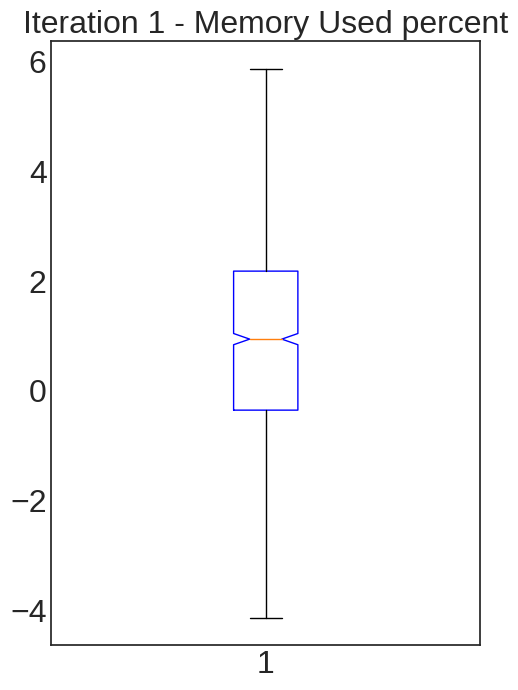

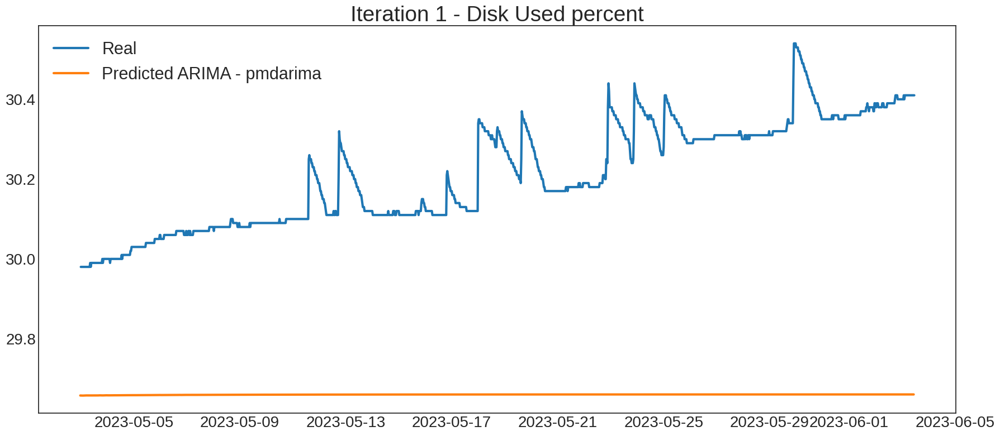

Training ARIMA... for Uptime
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=16.48 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-34544.215, Time=0.43 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=7.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-34534.239, Time=6.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-27321.579, Time=0.25 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=5.68 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-34535.805, Time=2.28 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-34553.596, Time=0.55 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=-34544.354, Time=4.42 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=15.82 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=-34564.725, Time=5.78 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=8.89 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=-34554.452, Time=6.55 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=6.52 sec
 A

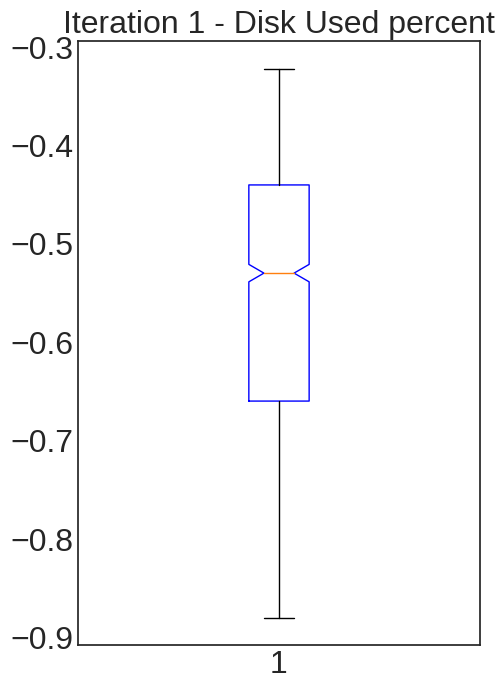

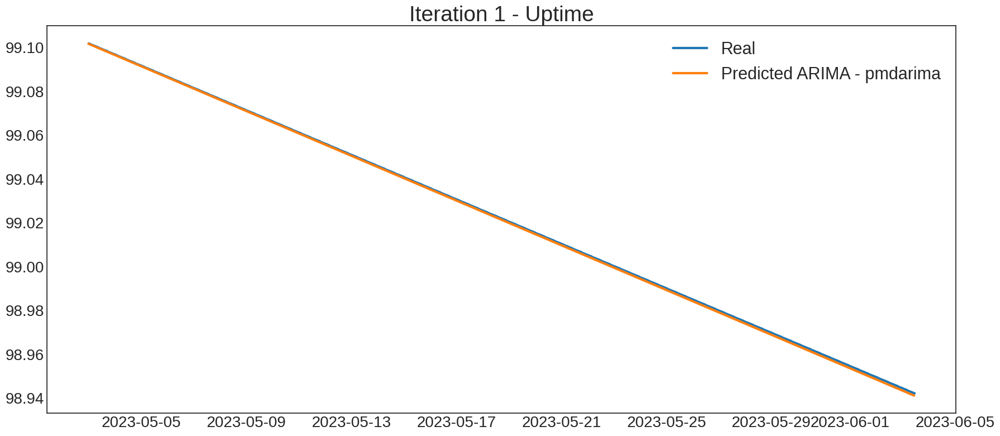

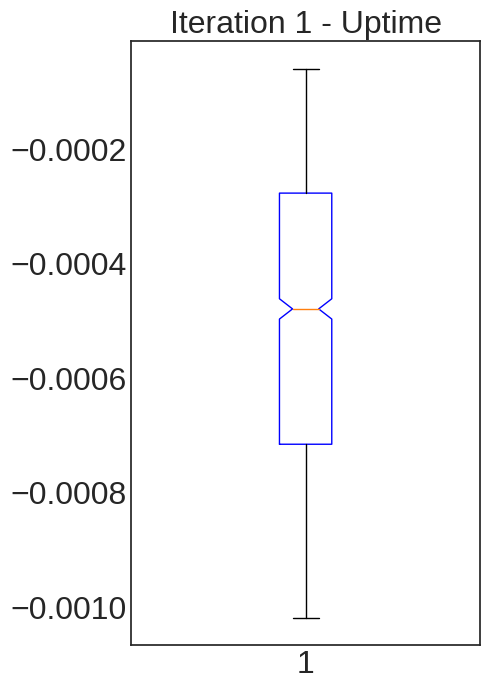

----------------------------------------
Training ARIMA... for Uptime (3627, 1) ---- (2418,)
----------------------------------------
Training ARIMA... for Free Memory
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=-3102.258, Time=15.99 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-597.884, Time=0.41 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-10094.076, Time=14.04 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-5494.548, Time=6.04 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=7457.828, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-10095.840, Time=1.21 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=-10094.072, Time=7.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=14.00 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=-10176.094, Time=0.65 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=-10176.549, Time=18.37 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=-9732.376, Time=46.31 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : 

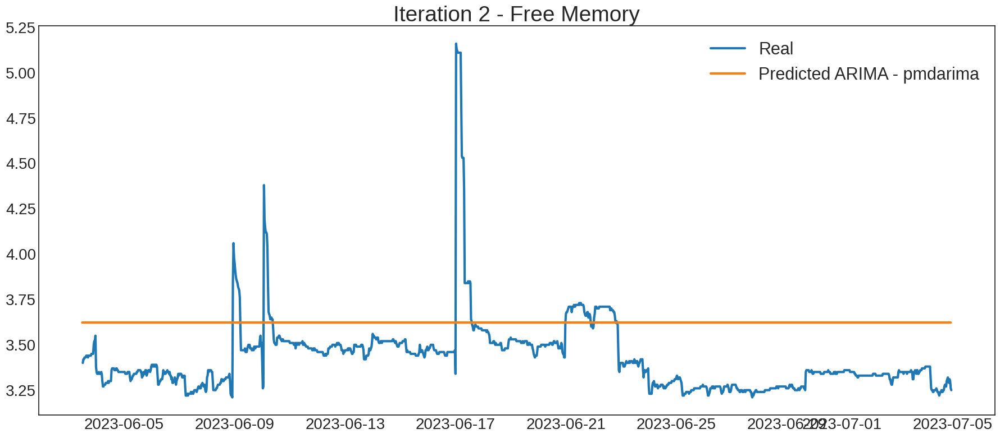

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)


Training ARIMA... for Used Memory
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=-3101.609, Time=16.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-596.316, Time=0.50 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-10094.862, Time=14.42 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-5496.915, Time=6.67 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=7451.160, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-10096.608, Time=0.51 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=-10094.858, Time=5.30 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=13.16 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=-10177.340, Time=2.16 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=-10177.829, Time=20.84 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=-10158.423, Time=46.99 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=15.44 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=-10177.775, Time=7.41 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : A

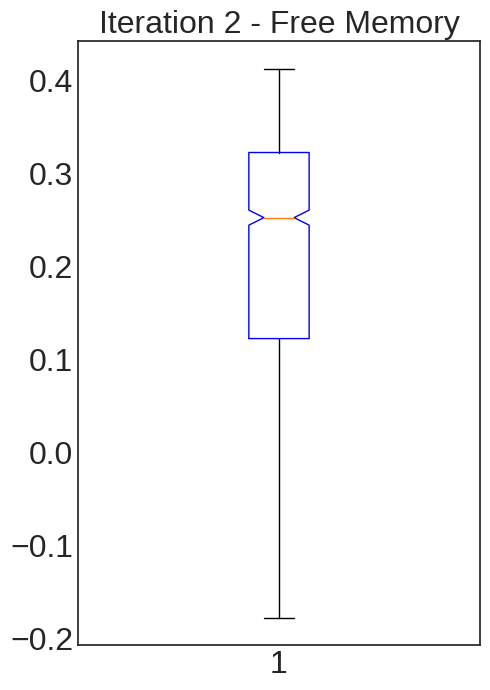

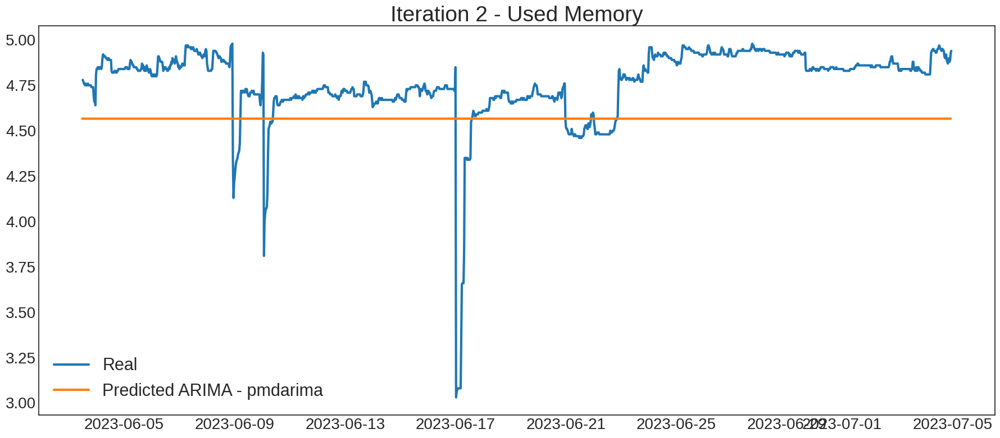

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)


Training ARIMA... for Free Disk
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=-22975.624, Time=8.50 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-22965.023, Time=0.74 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-23046.580, Time=7.64 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-23075.948, Time=9.45 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-22958.379, Time=0.38 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-23068.018, Time=2.43 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=-23081.170, Time=11.18 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=-23076.946, Time=6.16 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=-23086.820, Time=34.95 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=-23084.279, Time=26.93 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=-23089.414, Time=33.23 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=-23087.054, Time=34.62 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=-22983.633, Time=21.24 sec
 ARIMA(1,1,1)(2,0,2)[1

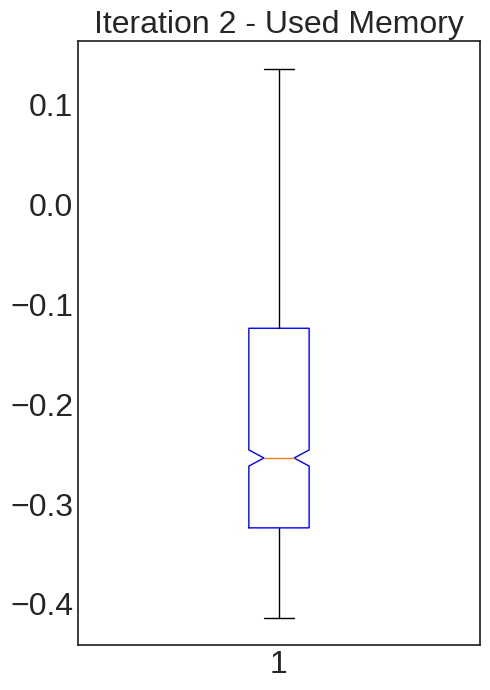

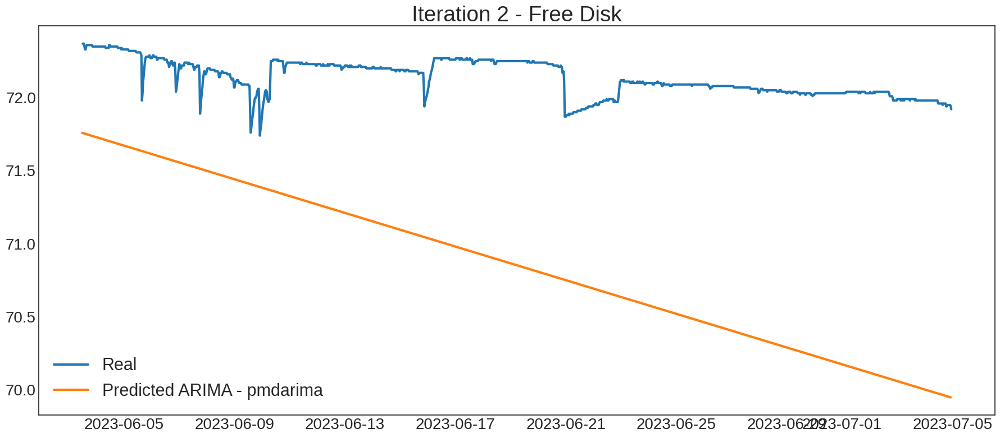

Training ARIMA... for Used Disk
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=-22974.071, Time=5.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-22964.499, Time=1.00 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-23038.949, Time=5.62 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-23064.363, Time=6.55 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-22957.895, Time=0.21 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-23058.943, Time=1.74 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=-23067.740, Time=8.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=-23065.211, Time=4.70 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=-23072.568, Time=35.43 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=-23069.639, Time=23.71 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=-23073.252, Time=57.72 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=-23071.506, Time=34.08 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=-22978.409, Time=25.57 sec
 ARIMA(1,1,1)(2,0,2)[12

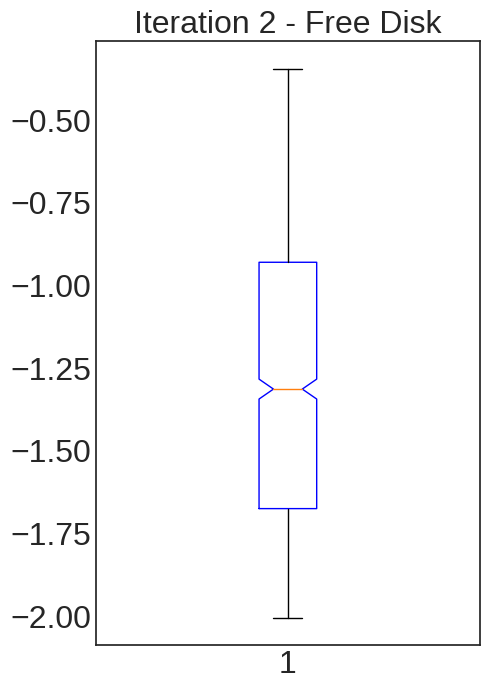

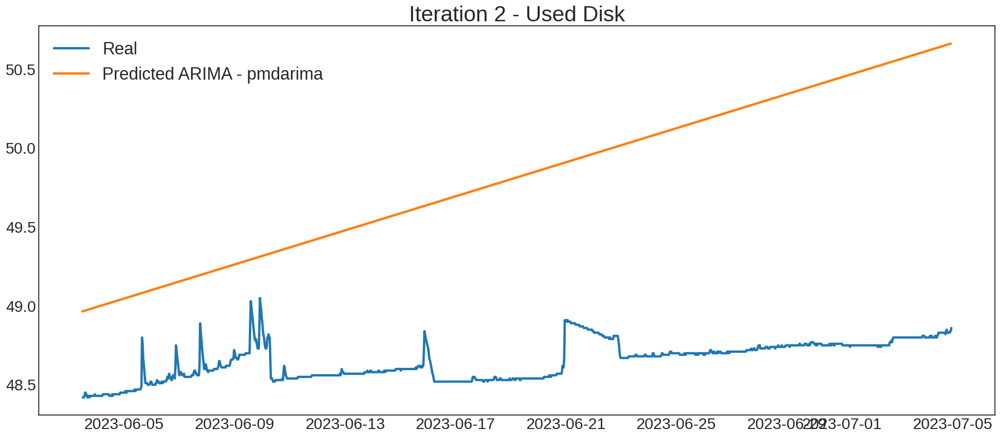

Training ARIMA... for Disk read/s
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=16.33 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-4351.707, Time=0.73 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-7930.682, Time=23.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-7045.885, Time=8.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=10278.154, Time=0.36 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-7932.680, Time=0.73 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=-7930.682, Time=2.94 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=18.23 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=-8108.499, Time=1.56 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=-8105.868, Time=23.11 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=-8106.504, Time=4.20 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=24.16 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=-8179.047, Time=4.81 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=-8177.050

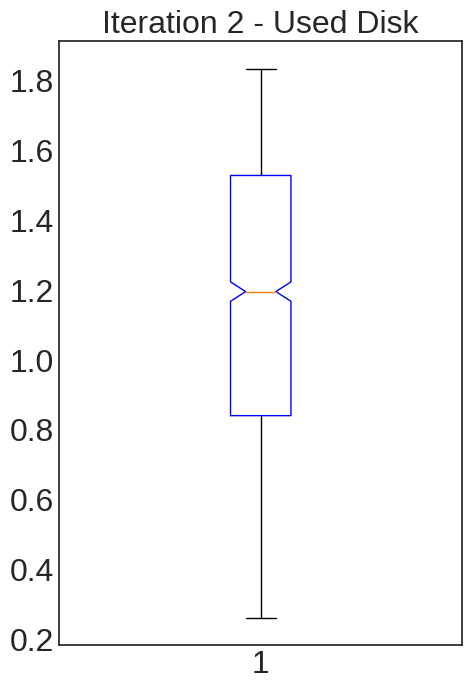

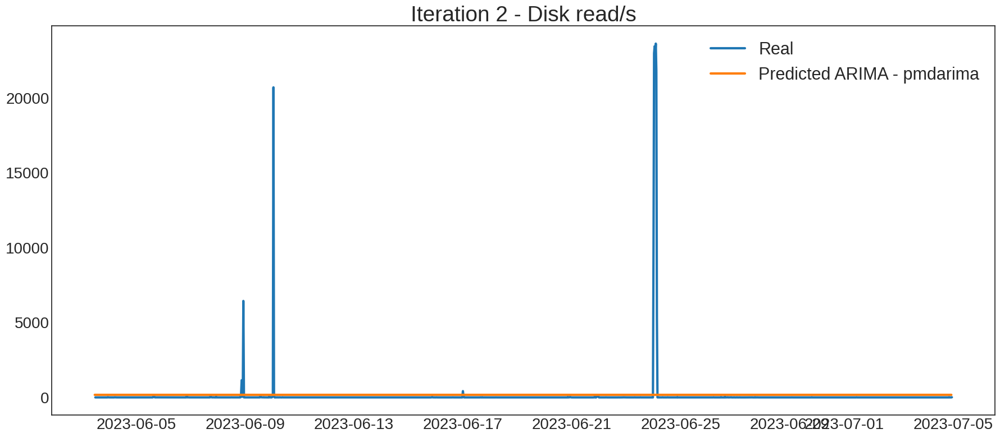

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)


Training ARIMA... for Disk write/s
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=-11238.139, Time=18.98 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-10019.664, Time=0.51 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=14.48 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-11030.544, Time=12.73 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=9645.398, Time=0.17 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=-10587.154, Time=4.36 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=10.42 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=-11200.094, Time=43.92 sec
 ARIMA(0,0,0)(1,0,2)[12] intercept   : AIC=-11191.926, Time=48.57 sec
 ARIMA(0,0,0)(0,0,2)[12] intercept   : AIC=-10801.982, Time=17.79 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=26.92 sec
 ARIMA(0,0,0)(2,0,2)[12] intercept   : AIC=-11238.885, Time=54.81 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=-11521.501, Time=65.76 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   :

KeyboardInterrupt: 

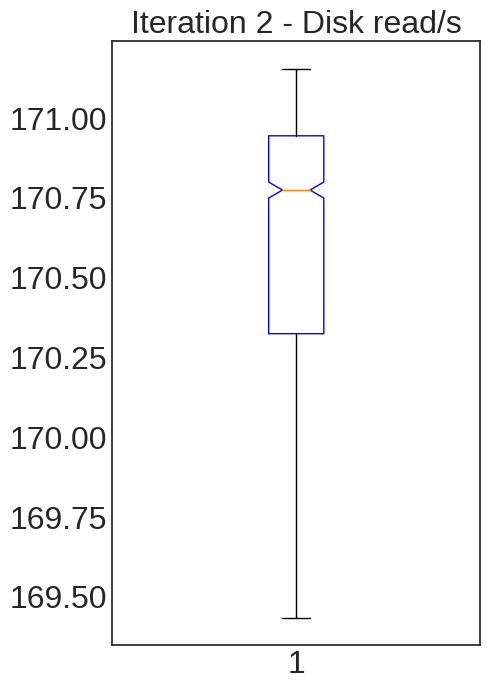

In [53]:
# from time import time

index = 0

dict_variables = {}

dict_variables_results = {}

for i, col in enumerate(df.columns):
  dict_variables_results[col] = {
      "rmse": 0,
      "mae": 0,
      "mape": 0,
  }


for jp in range(1):

  for (x_tr_s, y_tr_s), (x_vl_s, y_vl_s), (x_ts_s, y_ts_s) in zip(tr_s_ds.values(), vl_s_ds.values(), ts_s_ds.values()):

    print('--' * 20)
    print(f'Training ARIMA... for {col} {x_tr_s[:,:,i].shape} ---- {tr.index[:-1].shape}')
    print('--' * 20)

    scaler = scalers[index]
    tr_cut_date, vl_cut_date, ts_cut_date = cut_dates[index]

    tr, vl, ts = datasets[index]
    x_ts, y_true = ts_datasets[index]

    for i, col in enumerate(df.columns):
      start = time()

      print(f'Training ARIMA... for {col}')

      modelo = auto_arima(pd.DataFrame(x_tr_s[:,:,i], index=tr.index[:-1]),
                        m=12,               # frequency of series
                        d=None,             # let model determine 'd'
                        test='adf',         # use adftest to find optimal 'd'
                        start_p=0, start_q=0, # minimum p and q
                        max_p=12, max_q=12, # maximum p and q
                        D=None,             # let model determine 'D'
                        trace=True,
                        error_action='ignore',
                        suppress_warnings=True,
                        stepwise=True,
      )

      modelo.summary()


      predicciones_pdmarima = modelo.predict(len(vl) + len(ts))
      predicciones_pdmarima.name = 'predicciones_pdmarima'
      pred_arima = pd.DataFrame(predicciones_pdmarima[predicciones_pdmarima.index > str(vl_cut_date)])

      plt.figure(figsize=(18, 15))
      plt.subplot(2, 1, 1)

      scaled_predicted = scaler[i].inverse_transform(pred_arima.values)

      finish = time() - start

      # pd.DataFrame({'predict': scaler[i].inverse_transform(pred_arima.values).squeeze(), 'real': ts[[col]].values.squeeze()}, index=ts.index).to_csv('result')

      plt.plot(ts.index[:-1], ts[[col]][:-1], label='Real', linewidth=line_width)
      plt.plot(pred_arima.index, scaled_predicted, label='Predicted ARIMA - pmdarima', linewidth=line_width)
      plt.title(f'Iteration {index} - {col}', fontdict={'fontsize': 28})
      plt.legend(fontsize=22)

      plt.xticks(fontsize=20) # aumento de datos
      plt.yticks(fontsize=20)

      plt.grid(False)
      plt.savefig(f'{data_path}/AutoArima/test_result/Iteration-{index}_{cut_col_name(col)}_test_result.jpg')
      plt.tight_layout()
      plt.show()

      mae = MeanAbsoluteError()
      mape = MeanAbsolutePercentageError()

      mae.update_state(y_true[:, :, i], scaled_predicted)
      mape.update_state(y_true[:, :, i], scaled_predicted)

      i2, b2 = scaled_predicted.shape

      with open(f'{data_path}/AutoArima/metrics_result/{jp}_Iteration_{index}_results_ts.txt', 'a') as file:
      # with open(f'./AutoArima-fold_{index}_results_ts.txt', 'a') as file:
        file.write(f'VARIABLE ==> [{col}]\n')
        file.write(f'RMSE -> {round(root_mean_squared_error(y_true[:, :, i], scaled_predicted).numpy(), 3)} \n')
        file.write(f'MAE ->  {round(mae.result().numpy(), 3)} \n')
        file.write(f'MAPE -> { round(mape.result().numpy(), 3)} \n')
        file.write(f'SW statistic: -> {shapiro(abs(scaled_predicted.reshape(i2, b2))).statistic} \n')
        file.write(f'TRAIN TIME -> {round(finish, 3)} \n')

      dict_variables_results[col]['rmse'] = dict_variables_results[col]['rmse'] + round(root_mean_squared_error(y_true[:, :, i], scaled_predicted).numpy(), 3)
      dict_variables_results[col]['mae'] = dict_variables_results[col]['mae'] + round(mae.result().numpy(), 3)
      dict_variables_results[col]['mape'] = dict_variables_results[col]['mape'] + round(mape.result().numpy(), 3)

      fig, axe = plt.subplots(figsize=(5, 7))
      box = axe.boxplot(scaled_predicted - ts[[col]][:-1], notch=True, vert=True, autorange=True, sym="")
      for box in box['boxes']:
        box.set_color('b')
        axe.set_title(f'Iteration {index} - {col}', fontsize=23)
        axe.tick_params(labelsize=23)
        plt.tight_layout()
        plt.savefig(f'{data_path}/AutoArima/test_result/Iteration-{index}_{cut_col_name(col)}_test_result_box_plot.jpg')

    index += 1

    plt.show()
    # break


  for col in df.columns:
    with open(f'{data_path}/AutoArima/metrics_result/Iterations_results_summary.txt', 'a') as file:
      file.write(f'VARIABLE ==> [{col}]\n')
      file.write(f'RMSE -> {dict_variables_results[col]["rmse"]} \n')
      file.write(f'MAE -> {dict_variables_results[col]["mae"]} \n')
      file.write(f'MAPE -> {dict_variables_results[col]["mape"]} \n')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

MessageError: Error: credential propagation was unsuccessful